<a href="https://colab.research.google.com/github/Yanxi0608/-/blob/main/%E8%99%8E%E8%B1%B9ML_%E9%9B%86%E6%88%90%E6%96%B9%E6%B3%95.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 集成机器学习方法预测虎豹分布

In [ ]:
import shutil
from google.colab import drive

shutil.rmtree('/content/drive', ignore_errors=True)
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/虎豹分布_ML/animal/history/


dbb_pray.csv	     his_dbb_prediction.csv    mhl_density.asc
dbp_density.asc      his_tiger.csv	       tiger_pray.csv
his_dbb.csv	     his_tiger_density.csv     yz_density.asc
his_dbb_density.csv  his_tiger_prediction.csv


## 老虎分布预测

### 老虎数据集构建（KDE方法）

1. 大范围相机网格化覆盖近似完全，该调查区域内几乎没有大面积盲区，因此“没拍到物种”的伪缺失点（PA）参考价值极高，可以近似看作真缺失。

但在微观布设上，各区域的相机密度和拍摄频数仍存在差异。为了保证最终样本代表性的空间均匀，我们使用 HT 逆概率加权采样：对出现频率高（相机密集）的区域进行下采样，对出现频率低（相机稀疏）的区域进行上采样。

In [ ]:
# 数据集构建
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.preprocessing import minmax_scale
np.random.seed(123)

# ==东北虎数据集构建==
# ==step1：数据预处理：剔除den=-9999存在与不存在样本==
file_path = "/content/drive/MyDrive/虎豹分布_ML/animal/history/his_tiger_density.csv"
df_tiger_original = pd.read_csv(file_path)
print("东北虎存在样本数量：",len(df_tiger_original[df_tiger_original['occ']==1]))
print("东北虎不存在样本数量：", len(df_tiger_original[(df_tiger_original['occ'] == 0)]))

# 找出任意一个 density 列为 -9999 的行并剔除行（在图示中对应边界点）
mask_tiger_invalid = (
    (df_tiger_original["mhl_density"] == -9999) |
    (df_tiger_original["yz_density"] == -9999) |
    (df_tiger_original["dbp_density"] == -9999)
)
df_tiger_clean = df_tiger_original.loc[~mask_tiger_invalid].copy()

东北虎存在样本数量： 2410
东北虎不存在样本数量： 22669


In [ ]:
# --- Step 0: 基本参数 ---
X_COL = 'long'
Y_COL = 'lat'

# --- Step 1: 转换为 GeoDataFrame 并投影 (UTM，以米为单位) ---
UTM_CRS = "EPSG:32651"  # 假设使用 UTM 51N
geometry_tiger = [Point(xy) for xy in zip(df_tiger_clean[X_COL], df_tiger_clean[Y_COL])]
gdf_tiger = gpd.GeoDataFrame(df_tiger_clean, geometry=geometry_tiger, crs="EPSG:4326")
gdf_tiger = gdf_tiger.to_crs(UTM_CRS)

# --- Step 2: 分离存在点和伪缺席点 ---
gdf_tiger_presence = gdf_tiger[gdf_tiger['occ'] == 1].copy()
gdf_tiger_absence = gdf_tiger[gdf_tiger['occ'] == 0].copy()  # 所有缺席点都可用

# --- Step 3: TSM 加权采样伪缺席点 ---
# 3.1 准备 KDE 输入数据
pres_coords = np.vstack([gdf_tiger_presence.geometry.x, gdf_tiger_presence.geometry.y])
pa_coords = np.vstack([gdf_tiger_absence.geometry.x, gdf_tiger_absence.geometry.y])

# 3.2 计算 KDE (考虑出现频数加权)
try:
    weights = gdf_tiger_presence['NUMPOINTS'].values
    kde = gaussian_kde(pres_coords, weights=weights)
except np.linalg.LinAlgError:
    print("KDE 自动带宽失败，尝试手动设置 bw=0.01")
    kde = gaussian_kde(pres_coords, bw_method=0.01)

# 3.3 在 PA 候选点上评估密度，得到 Bias Map
pa_density = kde.evaluate(pa_coords)

# 3.4 归一化密度并计算逆权重
eps = 1e-6
pa_density_normalized = minmax_scale(pa_density) + eps
pa_weights = 1 / pa_density_normalized  # 密度低 -> 权重高

# 3.5 平衡采样数量
N_presence = len(gdf_tiger_presence)
N_pa_required = N_presence

if len(gdf_tiger_absence) <= N_pa_required:
    print(f"PA 候选点不足 ({len(gdf_tiger_absence)} < {N_pa_required})，直接使用全部缺席点")
    pa_samples_final = gdf_tiger_absence.copy()
else:
    sample_indices = np.random.choice(
        gdf_tiger_absence.index,
        size=N_pa_required,
        replace=False,
        p=pa_weights / np.sum(pa_weights)
    )
    pa_samples_final = gdf_tiger_absence.loc[sample_indices].copy()

# --- Step 4: 合并最终数据集 ---
cols_to_drop = [col for col in gdf_tiger_presence.columns if col in ['geometry', 'buffer_geom']]
df_final_pres = gdf_tiger_presence.drop(columns=cols_to_drop, errors='ignore')
df_final_pa = pa_samples_final.drop(columns=cols_to_drop, errors='ignore')

gdf_final_tiger = pd.concat([df_final_pres, df_final_pa], ignore_index=True)

# --- 输出信息 ---
print(f"总 PA 候选点数: {len(gdf_tiger_absence)}")
print(f"最终 PA 样本数: {len(gdf_final_tiger[gdf_final_tiger['occ'] == 0])}")
print(f"最终总样本数: {len(gdf_final_tiger)}")

总 PA 候选点数: 20842
最终 PA 样本数: 2358
最终总样本数: 4716


In [ ]:
import os

# 定义保存路径
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/采样数据集/"

# 保存CSV（若有geometry列会自动转为WKT字符串）
gdf_final_tiger.to_csv(os.path.join(save_path, "gdf_final_tiger.csv"), index=False, encoding="utf-8")
print("CSV文件已保存至：", os.path.join(save_path, "gdf_final_tiger.csv"))

CSV文件已保存至： /content/drive/MyDrive/虎豹分布_ML/results_test/采样数据集/gdf_final_tiger.csv


### 老虎历史分布-baseline

In [ ]:
# 集成机器学习方法-使用5种方法，用于预测虎豹分布范围-东北虎
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay)
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import joblib  # 用于模型保存
import random

# ==================== 数据加载与预处理 ====================
# 读取训练数据
df_tiger = gdf_final_tiger
y_tiger = df_tiger['occ']
X_tiger = df_tiger.iloc[:, 5:30]
# 这里后续也许要在模型中加入权重的因素

In [ ]:
import pandas as pd
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from scipy.stats import reciprocal, uniform

"""
# ==================== 模型调参 ====================
# 1. Random Forest 调参（速度快，推荐 GridSearch）
rf = RandomForestClassifier(class_weight="balanced", random_state=42)

rf_params = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 10, 20],
    "min_samples_split": [2, 5],
}

rf_search = GridSearchCV(
    rf, rf_params, scoring="roc_auc", cv=5, n_jobs=-1, verbose=2
)
rf_search.fit(X_tiger, y_tiger)

print("\n=== Random Forest Best Params ===")
print(rf_search.best_params_)
print("Best AUC:", rf_search.best_score_)


# ============================================================
# 2. Gradient Boosting (GBDT)
# ============================================================
gbdt = GradientBoostingClassifier(random_state=42)

gbdt_params = {
    "n_estimators": [100, 200],
    "learning_rate": [0.05, 0.1],
    "max_depth": [2, 3],
}

gbdt_search = GridSearchCV(
    gbdt, gbdt_params, scoring="roc_auc", cv=5, n_jobs=-1, verbose=2
)
gbdt_search.fit(X_tiger, y_tiger)

print("\n=== GBDT Best Params ===")
print(gbdt_search.best_params_)
print("Best AUC:", gbdt_search.best_score_)


# ============================================================
# 3. SVM — 使用 RandomizedSearch（网格太慢）
# ============================================================
svm = SVC(probability=True, random_state=42)

svm_params = {
    "C": uniform(0.1, 10),
    "gamma": reciprocal(1e-3, 1),
    "kernel": ["rbf"],
}

svm_search = RandomizedSearchCV(
    svm, svm_params, n_iter=15, scoring="roc_auc", cv=5,
    n_jobs=-1, random_state=42, verbose=2
)
svm_search.fit(X_tiger, y_tiger)

print("\n=== SVM Best Params ===")
print(svm_search.best_params_)
print("Best AUC:", svm_search.best_score_)


# ============================================================
# 4. KNN 调参
# ============================================================
knn = KNeighborsClassifier()

knn_params = {
    "n_neighbors": [3, 5, 7, 9],
    "weights": ["uniform", "distance"]
}

knn_search = GridSearchCV(
    knn, knn_params, scoring="roc_auc", cv=5, n_jobs=-1, verbose=2
)
knn_search.fit(X_tiger, y_tiger)

print("\n=== KNN Best Params ===")
print(knn_search.best_params_)
print("Best AUC:", knn_search.best_score_)


# ============================================================
# 5. Logistic Regression（作为 Meta Model）
# ============================================================
lr = Pipeline([
    ("scaler", StandardScaler()),
    ("lr", LogisticRegression(class_weight="balanced", max_iter=1000))
])

lr_params = {
    "lr__C": [0.1, 0.5, 1, 2],
    "lr__penalty": ["l2"]
}

lr_search = GridSearchCV(
    lr, lr_params, scoring="roc_auc", cv=5, n_jobs=-1, verbose=2
)
lr_search.fit(X_tiger, y_tiger)

print("\n=== Meta Logistic Regression Best Params ===")
print(lr_search.best_params_)
print("Best AUC:", lr_search.best_score_)
"""

'\n# ==================== 模型调参 ====================\n# 1. Random Forest 调参（速度快，推荐 GridSearch）\nrf = RandomForestClassifier(class_weight="balanced", random_state=42)\n\nrf_params = {\n    "n_estimators": [100, 200, 300],\n    "max_depth": [None, 10, 20],\n    "min_samples_split": [2, 5],\n}\n\nrf_search = GridSearchCV(\n    rf, rf_params, scoring="roc_auc", cv=5, n_jobs=-1, verbose=2\n)\nrf_search.fit(X_tiger, y_tiger)\n\nprint("\n=== Random Forest Best Params ===")\nprint(rf_search.best_params_)\nprint("Best AUC:", rf_search.best_score_)\n\n\n# ============================================================\n# 2. Gradient Boosting (GBDT)\n# ============================================================\ngbdt = GradientBoostingClassifier(random_state=42)\n\ngbdt_params = {\n    "n_estimators": [100, 200],\n    "learning_rate": [0.05, 0.1],\n    "max_depth": [2, 3],\n}\n\ngbdt_search = GridSearchCV(\n    gbdt, gbdt_params, scoring="roc_auc", cv=5, n_jobs=-1, verbose=2\n)\ngbdt_search.fit(X_ti

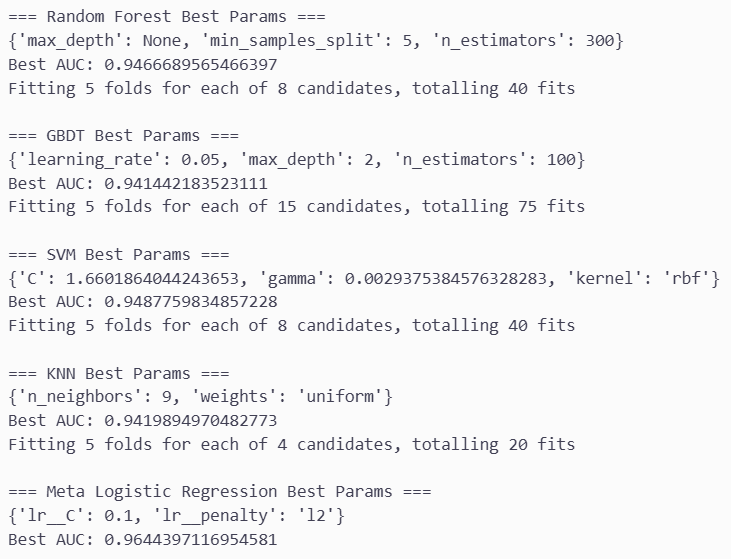

In [ ]:
# ==================== stacking集成模型构建 ====================
base_models = [

    # 1. Random Forest（无需标准化）
    ('rf', RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_split=5,
        class_weight='balanced',
        random_state=42
    )),

    # 2. Gradient Boosting（无需标准化）
    ('gbdt', GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.05,
        max_depth=2,
        random_state=42
    )),

    # 3. KNN（调参时使用了Scaler → 必须放入 Pipeline）
    ('knn', Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(
            n_neighbors=11,
            weights='uniform'
        ))
    ])),

    # 4. SVM（调参时使用了Scaler → 必须放入 Pipeline）
    ('svm', Pipeline([
        ('scaler', StandardScaler()),
        ('svm', SVC(
            C=3.1461376917337067,
            gamma=0.001963434157293333,
            kernel='rbf',
            probability=True,
            random_state=42
        ))
    ])),

    # 5. GaussianNB（无需标准化）
    ('nb', GaussianNB())
]

meta_model = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(
        C=0.05,
        penalty='l2',
        class_weight='balanced',
        max_iter=1000
    ))
])

stacking_model_tiger = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_model,
    stack_method='auto',
    n_jobs=-1,
    passthrough=False
)

model_pipeline_tiger = Pipeline([
    ('model', stacking_model_tiger)
])


In [ ]:
# ==================== 模型训练 ====================
folds = 5
skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=123)

accuracy_list = []
precision_list = []
recall_list = []
f1_list = []
auc_list = []

y_true_all_tiger = []
y_pred_all_tiger = []
y_proba_all_tiger = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X_tiger, y_tiger), 1):
    print(f"正在训练第 {fold}/{folds} 折...")

    X_train, X_test = X_tiger.iloc[train_idx], X_tiger.iloc[test_idx]
    y_train, y_test = y_tiger[train_idx], y_tiger[test_idx]

    # 训练
    model_pipeline_tiger.fit(X_train, y_train)

    # 预测
    y_pred = model_pipeline_tiger.predict(X_test)
    y_proba = model_pipeline_tiger.predict_proba(X_test)[:, 1]

    # 累积结果
    y_true_all_tiger.extend(y_test)
    y_pred_all_tiger.extend(y_pred)
    y_proba_all_tiger.extend(y_proba)

    # 指标
    accuracy_list.append(accuracy_score(y_test, y_pred))
    precision_list.append(precision_score(y_test, y_pred))
    recall_list.append(recall_score(y_test, y_pred))
    f1_list.append(f1_score(y_test, y_pred))
    auc_list.append(roc_auc_score(y_test, y_proba))

# 打印结果
print("\n========== 交叉验证平均指标 ==========")
print(f"Accuracy:  {np.mean(accuracy_list):.3f}")
print(f"Precision: {np.mean(precision_list):.3f}")
print(f"Recall:    {np.mean(recall_list):.3f}")
print(f"F1 Score:  {np.mean(f1_list):.3f}")
print(f"AUC-ROC:   {np.mean(auc_list):.3f}")


正在训练第 1/5 折...
正在训练第 2/5 折...
正在训练第 3/5 折...
正在训练第 4/5 折...
正在训练第 5/5 折...

========== 交叉验证平均指标 ==========
Accuracy:  0.948
Precision: 0.958
Recall:    0.937
F1 Score:  0.947
AUC-ROC:   0.983


:::::::::::::### 老虎历史分布绘图

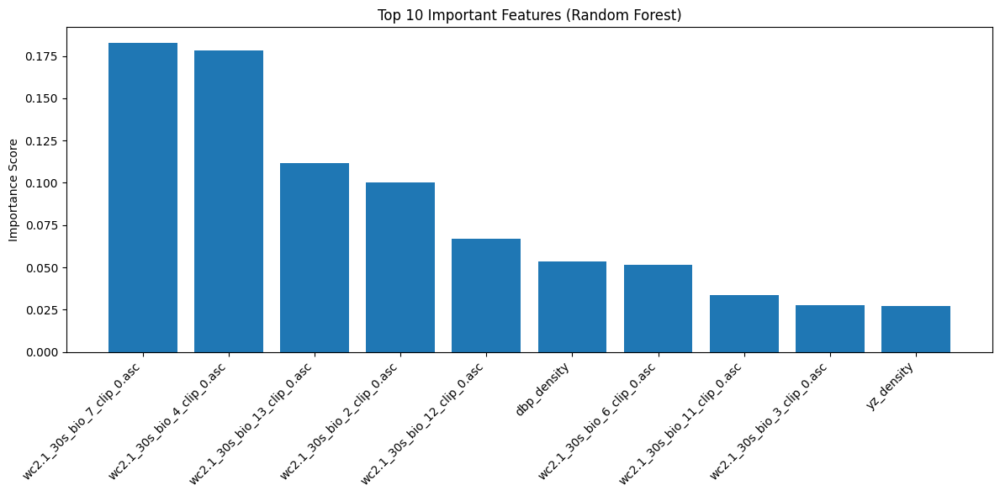

In [ ]:
if 'rf' in stacking_model_tiger.named_estimators_:
    feature_importance = stacking_model_tiger.named_estimators_['rf'].feature_importances_
    sorted_idx = np.argsort(feature_importance)[::-1]

    plt.figure(figsize=(12, 6))
    plt.title("Top 10 Important Features (Random Forest)")
    plt.bar(range(10), feature_importance[sorted_idx][:10])
    plt.xticks(range(10), X_tiger.columns[sorted_idx][:10], rotation=45, ha='right')
    plt.ylabel("Importance Score")
    plt.tight_layout()
    plt.show()


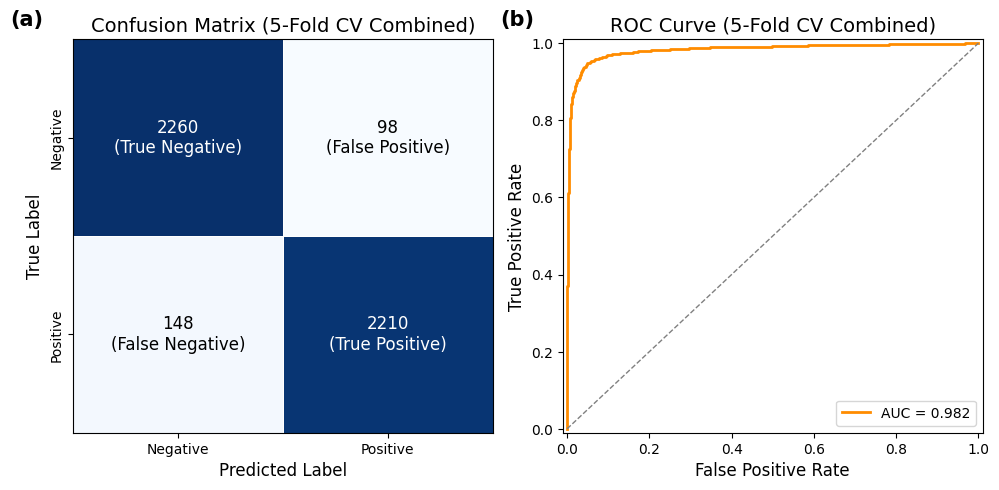

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

# ======================
# 计算指标
# ======================
cm = confusion_matrix(y_true_all_tiger, y_pred_all_tiger)
roc_auc = roc_auc_score(y_true_all_tiger, y_proba_all_tiger)
fpr, tpr, thresholds = roc_curve(y_true_all_tiger, y_proba_all_tiger)

# ======================
# 1×2 子图布局
# ======================
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# ======================
# (a) 混淆矩阵
# ======================
ax = axes[0]

# 自定义颜色：TN、TP 白字；FP、FN 黑字
annot_colors = [
    ["white", "black"],  # TN, FP
    ["black", "white"]   # FN, TP
]

annot_text = [
    [f"{cm[0,0]}\n(True Negative)", f"{cm[0,1]}\n(False Positive)"],
    [f"{cm[1,0]}\n(False Negative)", f"{cm[1,1]}\n(True Positive)"]
]

# 绘图
sns.heatmap(
    cm, annot=annot_text, fmt='',
    cmap='Blues', cbar=False,
    linewidths=0.5, linecolor='white',
    xticklabels=['Negative', 'Positive'],
    yticklabels=['Negative', 'Positive'],
    ax=ax,
    annot_kws={"size": 12}
)

# 修改注释文字的颜色
for text_obj, color in zip(ax.texts, sum(annot_colors, [])):
    text_obj.set_color(color)

# 坐标轴刻度
ax.tick_params(axis='both', labelsize=10)

# 加上坐标轴的边框线
for spine in ax.spines.values():
    spine.set_visible(True)

# 标题：居中，但左上角加粗 (a)
ax.set_title(f"Confusion Matrix ({folds}-Fold CV Combined)", fontsize=14)
ax.text(-0.15, 1.05, "(a)", transform=ax.transAxes,
        fontsize=15, fontweight='bold', va='center')

ax.set_xlabel("Predicted Label", fontsize=12)
ax.set_ylabel("True Label", fontsize=12)

# ======================
# (b) ROC 曲线
# ======================
ax2 = axes[1]

# ROC 曲线
ax2.plot(fpr, tpr, lw=2, color='darkorange',
         label=f"AUC = {roc_auc:.3f}")

# 对角线
ax2.plot([0, 1], [0, 1], linestyle='--', lw=1, color='gray')

# 坐标轴样式
ax2.set_xlim([-0.01, 1.01])
ax2.set_ylim([-0.01, 1.01])
ax2.set_xlabel("False Positive Rate", fontsize=12)
ax2.set_ylabel("True Positive Rate", fontsize=12)

# 标题：居中，但左上角加粗 (b)
ax2.set_title(f"ROC Curve ({folds}-Fold CV Combined)", fontsize=14)
ax2.text(-0.15, 1.05, "(b)", transform=ax2.transAxes,
         fontsize=15, fontweight='bold', va='center')

ax2.legend(fontsize=10, loc="lower right")

# 不画网格线
ax2.grid(False)

# 加上坐标轴边框线
for spine in ax2.spines.values():
    spine.set_visible(True)

plt.tight_layout()
plt.show()


In [ ]:
# 空间叠置精度图（栅格版）
import geopandas as gpd
import pandas as pd
import numpy as np
import rasterio
from rasterio.transform import from_origin
from rasterio.features import rasterize
from rasterio import plot
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap

# ==========================================================
# 0. 偏移量（固定，全图一致）
# ==========================================================
delta_long = 0.0951937
delta_lat  = 0.41843404

# ==========================================================
# 1. 修正经纬度
# ==========================================================
df_tiger["long_corrected"] = df_tiger["long"] + delta_long
df_tiger["lat_corrected"]  = df_tiger["lat"]  + delta_lat

# ==========================================================
# 2. 用最终模型重新拟合并预测整个数据集
# ==========================================================
model_pipeline_tiger.fit(X_tiger, y_tiger)
df_tiger["prediction"] = model_pipeline_tiger.predict(X_tiger)

# ==========================================================
# 3. 转换为 GeoDataFrame + 裁剪到公园范围
# ==========================================================
gdf = gpd.GeoDataFrame(
    df_tiger,
    geometry=gpd.points_from_xy(df_tiger.long_corrected, df_tiger.lat_corrected),
    crs="EPSG:4326"
)

# 加载虎豹国家公园 shp 并统一坐标系
hbgy = gpd.read_file('/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp')
hbgy = hbgy.to_crs(gdf.crs)

# 裁剪点数据到公园范围（避免栅格化超出边界）
mask = gdf.within(hbgy.unary_union)
gdf_clipped = gdf[mask]

# ==========================================================
# 4. 分类三类点（栅格化前的数据源）
# ==========================================================
gdf_occ1         = gdf_clipped[gdf_clipped.occ == 1]                     # 真实存在点
gdf_pred1        = gdf_clipped[gdf_clipped.prediction == 1]              # 预测存在点
gdf_correct_pred = gdf_clipped[(gdf_clipped.occ == 1) & (gdf_clipped.prediction == 1)]  # 正确预测

# ==========================================================
# 5. 栅格化参数设置（匹配你的坐标范围）
# ==========================================================
# 固定坐标范围（和你散点图一致）
xmin, xmax = 129.0, 131.5
ymin, ymax = 42.25, 44.5
resolution = 0.0083333  # 栅格分辨率（和你的示例一致，约1km）

# 计算栅格尺寸和转换矩阵
width = int((xmax - xmin) / resolution)
height = int((ymax - ymin) / resolution)
transform = from_origin(xmin, ymax, resolution, resolution)

# ==========================================================
# 6. 分别栅格化三类点
# ==========================================================
# 真实存在点栅格（值=1）
shapes_occ1 = [(geom, 1) for geom in gdf_occ1.geometry]
raster_occ1 = rasterize(
    shapes_occ1, out_shape=(height, width), transform=transform,
    fill=0, dtype=np.uint8
)

# 预测存在点栅格（值=1）
shapes_pred1 = [(geom, 1) for geom in gdf_pred1.geometry]
raster_pred1 = rasterize(
    shapes_pred1, out_shape=(height, width), transform=transform,
    fill=0, dtype=np.uint8
)

# 正确预测点栅格（值=1）
shapes_correct = [(geom, 1) for geom in gdf_correct_pred.geometry]
raster_correct = rasterize(
    shapes_correct, out_shape=(height, width), transform=transform,
    fill=0, dtype=np.uint8
)

/tmp/ipykernel_738/3338495397.py:45: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  mask = gdf.within(hbgy.unary_union)


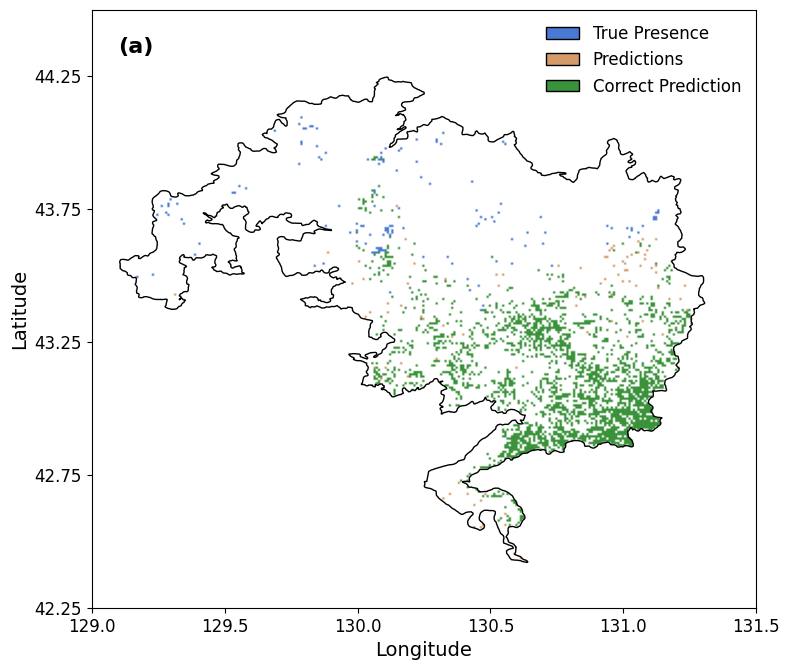

In [ ]:
# ==========================================================
# 7. 绘图（修复栅格叠加遮挡问题）
# ==========================================================
fig, ax = plt.subplots(figsize=(8, 10))

# --- 绘制虎豹国家公园边界 ---
hbgy.boundary.plot(ax=ax, color='black', linewidth=1)

# --- 【关键修改】重新定义栅格（用不同数值区分三类区域） ---
# 创建一个空栅格（初始值=0）
raster_combined = np.zeros((height, width), dtype=np.uint8)

# 1. 正确预测区域 → 赋值1（底层）
raster_combined[raster_correct == 1] = 1

# 2. 真实存在但未正确预测的区域 → 赋值2（中层）
# （真实存在 且 不是正确预测）
raster_occ_only = (raster_occ1 == 1) & (raster_correct == 0)
raster_combined[raster_occ_only] = 2

# 3. 预测存在但未正确预测的区域 → 赋值3（顶层）
# （预测存在 且 不是正确预测）
raster_pred_only = (raster_pred1 == 1) & (raster_correct == 0)
raster_combined[raster_pred_only] = 3

# --- 【关键修改】自定义颜色映射（对应三类区域） ---
cmap_combined = ListedColormap([
    'white',       # 0: 无数据
    '#3a923a',     # 1: 正确预测
    '#4a79d4',     # 2: 真实存在（非正确预测）
    '#d49a6a'      # 3: 预测存在（非正确预测）
])

# 绘制合并后的栅格
plot.show(
    raster_combined,
    transform=transform,
    ax=ax,
    cmap=cmap_combined
)

# ----------------------------------------------------------
# 出版级美化（保持原样式）
# ----------------------------------------------------------
# 1. 坐标轴设置
ax.set_xlabel("Longitude", fontsize=14)
ax.set_ylabel("Latitude", fontsize=14)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# 2. 刻度设置
ax.set_xticks(np.arange(129.0, 131.5 + 0.001, 0.5))
ax.set_yticks(np.arange(42.25, 44.25 + 0.001, 0.5))
ax.tick_params(axis='both', labelsize=12)

# 3. 图例（匹配颜色映射）
legend_elements = [
    Patch(facecolor='#4a79d4', edgecolor='black', label='True Presence'),
    Patch(facecolor='#d49a6a', edgecolor='black', label='Predictions'),
    Patch(facecolor='#3a923a', edgecolor='black', label='Correct Prediction')
]
leg = ax.legend(
    handles=legend_elements,
    loc="upper right",
    frameon=False,
    fontsize=12
)

# 4. 左上角 (a) 标注
ax.text(
    129.1, 44.4,
    "(a)",
    fontsize=16,
    fontweight='bold',
    va='top',
    ha='left'
)

# 5. 背景白色
ax.set_facecolor("white")

plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================
# 8. 计算空间叠置百分比
# ==========================================================

# 统计各类栅格的数量
count_correct = np.sum(raster_combined == 1)  # 绿色：正确预测
count_omitted = np.sum(raster_combined == 2)  # 蓝色：漏报（真实存在但未预测到）

# 计算总的实际观测栅格数 (绿色 + 蓝色)
total_observed = count_correct + count_omitted

# 计算百分比
if total_observed > 0:
    overlap_percentage = (count_correct / total_observed) * 100
    print(f"--- 空间叠置分析结果 ---")
    print(f"正确预测的栅格数 (绿色): {count_correct}")
    print(f"未被覆盖的观测栅格数 (蓝色): {count_omitted}")
    print(f"正确预测占比 (绿色 / (绿色+蓝色)): {overlap_percentage:.2f}%")
else:
    print("错误：未发现在公园范围内的实际观测点栅格。")

--- 空间叠置分析结果 ---
正确预测的栅格数 (绿色): 2222
未被覆盖的观测栅格数 (蓝色): 136
正确预测占比 (绿色 / (绿色+蓝色)): 94.23%


Tiger: 正在计算 SHAP 值...


  0%|          | 0/500 [00:00<?, ?it/s]

Tiger: SHAP 计算完成


/tmp/ipykernel_738/762583900.py:81: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


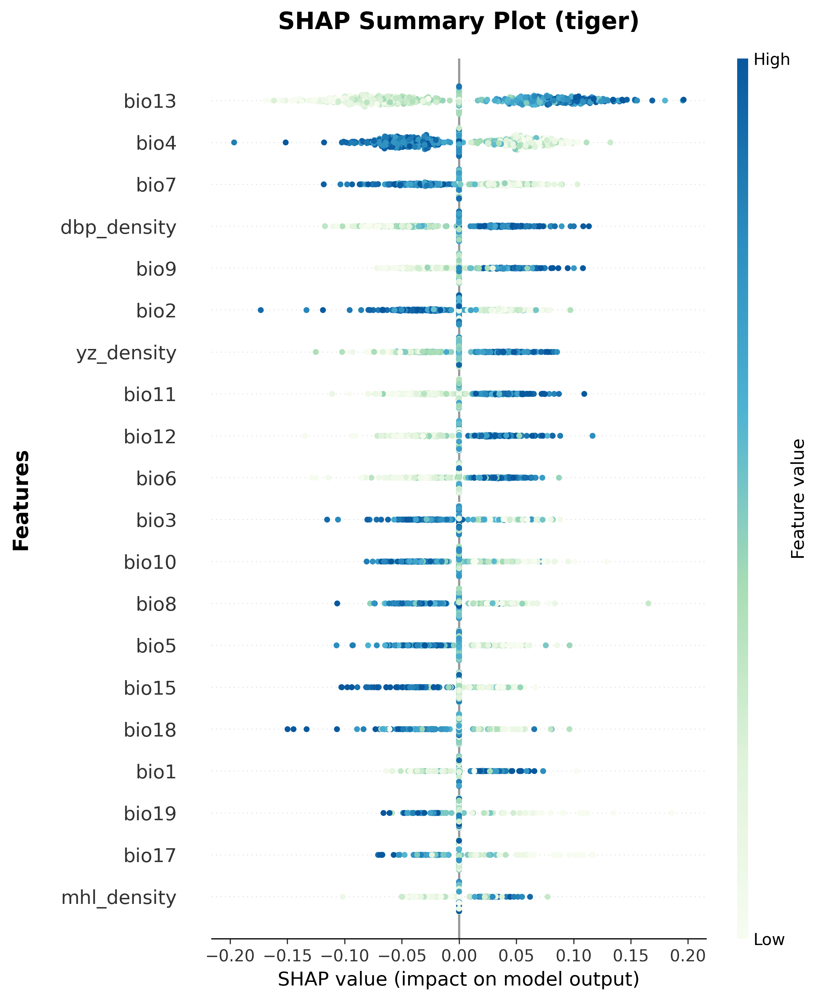

Tiger 图已保存: /content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/tiger_SHAP_Summary_Plot.png


In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import os

# -----------------------------
# 0. 保存路径
# -----------------------------
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/"
os.makedirs(save_path, exist_ok=True)

# -----------------------------
# 1. 列名清洗
# -----------------------------
def clean_feature_name(name):
    if name == 'hm.asc':
        return 'human activities'
    if 'bio_' in name:
        return f"bio{name.split('bio_')[1].split('_')[0]}"
    return name

# -----------------------------
# 2. 背景数据
# -----------------------------
X_background_tiger = shap.kmeans(X_tiger, 50)

# -----------------------------
# 3. 预测函数
# -----------------------------
def predict_proba_func_tiger(x):
    df_temp = pd.DataFrame(x, columns=X_tiger.columns)
    return model_pipeline_tiger.predict_proba(df_temp)[:, 1]

# -----------------------------
# 4. Explainer
# -----------------------------
explainer_tiger = shap.KernelExplainer(
    predict_proba_func_tiger,
    X_background_tiger
)

# -----------------------------
# 5. SHAP 计算
# -----------------------------
X_sample_tiger = X_tiger.sample(500, random_state=42)

print("Tiger: 正在计算 SHAP 值...")

shap_values_tiger = explainer_tiger.shap_values(
    X_sample_tiger,
    nsamples=100
)

print("Tiger: SHAP 计算完成")

# -----------------------------
# 6. 显示数据
# -----------------------------
X_display_tiger = X_sample_tiger.copy()
X_display_tiger.columns = [
    clean_feature_name(c) for c in X_display_tiger.columns
]

# -----------------------------
# 7. 配色
# -----------------------------
custom_colors = ['#f7fcf0', '#e0f3db', '#a8ddb5',
                 '#4eb3d3', '#2b8cbe', '#08589e']

cmap_custom = LinearSegmentedColormap.from_list(
    "custom_blue_green", custom_colors
)

# -----------------------------
# 8. 绘图
# -----------------------------
plt.figure(figsize=(12, 10), dpi=300)

shap.summary_plot(
    shap_values_tiger,
    X_display_tiger,
    show=False,
    cmap=cmap_custom
)

plt.ylabel("Features", fontsize=14, fontweight='bold', labelpad=20)
plt.title("SHAP Summary Plot (tiger)", fontsize=16, fontweight='bold', pad=20)

plt.tight_layout()

# -----------------------------
# 9. 保存
# -----------------------------
save_file_tiger = os.path.join(
    save_path,
    "tiger_SHAP_Summary_Plot.png"
)

plt.savefig(save_file_tiger, dpi=300, bbox_inches='tight')
plt.show()

print(f"Tiger 图已保存: {save_file_tiger}")


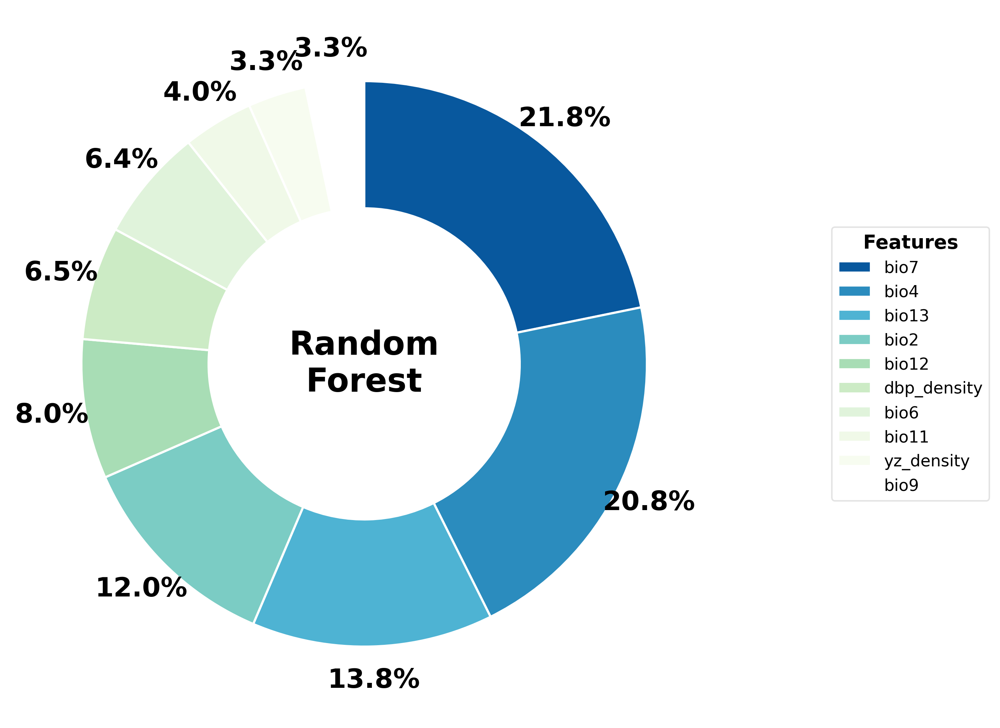

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

if 'rf' in stacking_model_tiger.named_estimators_:

    # 1. 获取重要性数据
    feature_importance = stacking_model_tiger.named_estimators_['rf'].feature_importances_
    sorted_idx = np.argsort(feature_importance)[::-1]
    top_10_idx_tiger = sorted_idx[:10]
    top_10_importance = feature_importance[top_10_idx_tiger]

    # 2. 特征名清洗
    raw_labels_tiger = X_tiger.columns[top_10_idx_tiger]
    clean_labels_tiger = [
        f"bio{label.split('bio_')[1].split('_')[0]}" if 'bio_' in label else label
        for label in raw_labels_tiger
    ]

    # 3. 颜色方案（精准匹配原图色系：深蓝 -> 浅绿）
    colors_hex = [
        '#08589e', '#2b8cbe', '#4eb3d3', '#7bccc4', '#a8ddb5',
        '#ccebc5', '#e0f3db', '#f0f9e8', '#f7fcf0', '#ffffff'
    ]
    colors = colors_hex[:len(top_10_importance)]

    # 4. 绘图
    fig, ax = plt.subplots(figsize=(9, 8), dpi=300)

    # wedgeprops 设置圆环宽度和白色分割线
    # pctdistance=1.1 让百分比贴在环外
    wedges, texts, autotexts = ax.pie(
        top_10_importance,
        labels=None,
        autopct='%1.1f%%',
        startangle=90,
        counterclock=False,
        colors=colors,
        wedgeprops=dict(width=0.45, edgecolor='white', linewidth=1.5),
        pctdistance=1.12
    )

    # 5. 调整百分比文字样式
    for txt in autotexts:
        txt.set_color('black')       # 统一为黑色
        txt.set_fontsize(18)         # 加大字号
        txt.set_fontweight('bold')   # 加粗显示

    # 6. 中心文字
    ax.text(
        0, 0, "Random\nForest",
        ha='center', va='center',
        fontsize=22, fontweight='bold',
    )

    # 7. 图例样式
    legend = ax.legend(
        wedges,
        clean_labels_tiger,
        title="Features",
        title_fontproperties={'weight': 'bold', 'size': 13},
        loc="center left",
        bbox_to_anchor=(1.15, 0.5), # 略微向右偏移，避免遮挡百分比
        frameon=True,
        edgecolor='#dddddd',
        fontsize=11
    )

    ax.set_aspect('equal')
    plt.tight_layout()
    plt.show()

In [ ]:
# -----------------------------
# 9. 绘制 SHAP Dependence Plot (环境因子响应曲线)
# -----------------------------
# 选取贡献较大的核心气候因子，例如 bio4 (温度季节性) 和 bio7 (气温年较差)
# 注意：这里使用的名称必须是 X_display.columns 中的清洗后名称
target_features = ['bio4', 'bio7']

for feature in target_features:
    plt.figure(figsize=(10, 7), dpi=300)

    # 获取该特征在展示用 DataFrame 中的索引
    feature_idx = list(X_display.columns).index(feature)

    # 绘制依赖图
    # interaction_index='auto' 会自动寻找一个与之交互最强的因子并用颜色表示（如降水或人类活动）
    shap.dependence_plot(
        feature_idx,
        shap_values,
        X_display,
        feature_names=X_display.columns.tolist(),
        interaction_index='auto',
        show=False,
        alpha=0.7,
        dot_size=30
    )

    # 图表修饰
    plt.title(f"SHAP Dependence Plot: {feature} (Response Mechanism)", fontsize=15, fontweight='bold', pad=15)
    plt.xlabel(f"{feature} Value", fontsize=12)
    plt.ylabel("SHAP value (Impact on Suitability)", fontsize=12)
    plt.axhline(0, color='red', linestyle='--', linewidth=1.5, alpha=0.5) # 添加 0 值基准线

    plt.grid(True, linestyle=':', alpha=0.4)
    plt.tight_layout()

    # 保存依赖图
    dep_save_file = os.path.join(save_path, f"tiger_Dependence_Plot_{feature}.png")
    plt.savefig(dep_save_file, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"依赖图已成功保存至: {dep_save_file}")

NameError: name 'X_display' is not defined

<Figure size 3000x2100 with 0 Axes>

### 老虎未来情景预测

In [ ]:
# ============= 当前情景预测（Tiger） =============

# ---- 只保留训练时的变量列 ----
X_current = df_tiger_clean[X_tiger.columns]

# ---- 剔除含 -9999 的行（保持原来的 mask） ----
mask = (X_current != -9999).all(axis=1)
X_clean = X_current[mask]

# ---- 预测分类 ----
pred = model_pipeline_tiger.predict(X_clean)

# ---- 预测概率 ----
proba = model_pipeline_tiger.predict_proba(X_clean)[:, 1]

# ---- 把结果直接写回原 df_tiger_clean ----
df_tiger_clean.loc[mask, "prediction"] = pred
df_tiger_clean.loc[mask, "probability"] = proba

# 查看前几行确认
df_tiger_clean.head()


,id,long,lat,NUMPOINTS,occ,dem.asc,hm.asc,slope.asc,wc2.1_30s_bio_10_clip_0.asc,wc2.1_30s_bio_11_clip_0.asc,...,wc2.1_30s_bio_5_clip_0.asc,wc2.1_30s_bio_6_clip_0.asc,wc2.1_30s_bio_7_clip_0.asc,wc2.1_30s_bio_8_clip_0.asc,wc2.1_30s_bio_9_clip_0.asc,mhl_density,yz_density,dbp_density,prediction,probability
13,524.0,129.021473,43.134899,0.0,0.0,1105.0,14.0,89.986990,15.866667,-15.933333,...,22.2,-24.3,46.5,15.866667,-15.933333,2.831592,1.368590,2.072843,0.0,0.184567
14,525.0,129.021473,43.126566,0.0,0.0,1025.0,14.0,89.995580,16.300000,-15.616667,...,22.6,-23.9,46.5,16.300000,-15.616667,2.332159,1.237149,2.233674,0.0,0.096930
15,526.0,129.021473,43.118232,0.0,0.0,987.0,14.0,89.995895,16.666666,-15.283334,...,22.9,-23.6,46.5,16.666666,-15.283334,2.051256,1.168023,2.320361,0.0,0.095660
16,527.0,129.021473,43.109899,0.0,0.0,784.0,14.0,89.994020,17.183332,-14.866667,...,23.4,-23.2,46.6,17.183332,-14.866667,2.518931,1.309599,2.191105,0.0,0.094500
17,528.0,129.021473,43.101566,0.0,0.0,772.0,14.0,89.994690,17.200000,-14.816667,...,23.4,-23.1,46.5,17.200000,-14.816667,2.547137,1.324449,2.167454,0.0,0.106821


In [ ]:
# ============= 未来情景预测 =============
import os
import pandas as pd
import numpy as np

# 路径设置
input_dir = "/content/drive/MyDrive/虎豹分布_ML/animal/envi_density/tiger/"
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/"
os.makedirs(output_dir, exist_ok=True)

# 训练好的模型（已 fit 完成）
model_trained = model_pipeline_tiger   # 不需要 scaler_trained 了

# 未来情景文件列表
file_list = [
    "tiger_126_2021-2040_density_renamed.csv",
    "tiger_126_2041-2060_density_renamed.csv",
    "tiger_126_2061-2080_density_renamed.csv",
    "tiger_126_2081-2100_density_renamed.csv",
    "tiger_245_2021-2040_density_renamed.csv",
    "tiger_245_2041-2060_density_renamed.csv",
    "tiger_245_2061-2080_density_renamed.csv",
    "tiger_245_2081-2100_density_renamed.csv",
    "tiger_585_2021-2040_density_renamed.csv",
    "tiger_585_2041-2060_density_renamed.csv",
    "tiger_585_2061-2080_density_renamed.csv",
    "tiger_585_2081-2100_density_renamed.csv",
]

# 主循环
for fname in file_list:

    print(f"正在处理：{fname}")

    file_path = os.path.join(input_dir, fname)
    df = pd.read_csv(file_path)

    # ---- 提取地理列 (ID, long, lat) ----
    geo_info = df.iloc[:, 0:3]

    # ---- 只保留训练时的变量列 ----
    X_future = df[X_tiger.columns]

    # ---- 剔除含 -9999 的行 ----
    mask = (X_future != -9999).all(axis=1)
    X_clean = X_future[mask]
    geo_clean = geo_info[mask]

    print(f"原样本量 {len(df)} → 剔除后 {len(X_clean)}")

    # ------------- (无需手动标准化) -------------
    # 模型内部会自动使用各自 pipeline 的 StandardScaler()

    # (1) 预测分类
    pred = model_trained.predict(X_clean)

    # (2) 预测概率
    proba = model_trained.predict_proba(X_clean)[:, 1]

    # 保存结果
    result = pd.DataFrame({
        "ID": geo_clean.iloc[:, 0],
        "long": geo_clean.iloc[:, 1],
        "lat": geo_clean.iloc[:, 2],
        "prediction": pred,
        "probability": proba
    })

    save_path = os.path.join(output_dir, fname.replace(".csv", "_prediction.csv"))
    result.to_csv(save_path, index=False)

    print(f"已保存：{save_path}\n")

print("全部未来情景预测完成！")


正在处理：tiger_126_2021-2040_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/tiger_126_2021-2040_density_renamed_prediction.csv

正在处理：tiger_126_2041-2060_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/tiger_126_2041-2060_density_renamed_prediction.csv

正在处理：tiger_126_2061-2080_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/tiger_126_2061-2080_density_renamed_prediction.csv

正在处理：tiger_126_2081-2100_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/tiger_126_2081-2100_density_renamed_prediction.csv

正在处理：tiger_245_2021-2040_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/tiger_245_2021-2040_density_renamed_prediction.csv

正在处理：tiger_245_2041-2060_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/

In [ ]:
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/"

# 找所有 prediction 文件
pred_files = [f for f in os.listdir(output_dir) if f.endswith("_prediction.csv")]

summary_list = []

for fname in pred_files:
    path = os.path.join(output_dir, fname)
    df = pd.read_csv(path)

    # 预测为 1、0 的数量
    n1 = (df["prediction"] == 1).sum()
    n0 = (df["prediction"] == 0).sum()

    # 各自概率平均值
    avg_prob_1 = df.loc[df["prediction"] == 1, "probability"].mean()
    avg_prob_0 = df.loc[df["prediction"] == 0, "probability"].mean()

    summary_list.append({
        "file": fname,
        "n_predict_1": n1,
        "n_predict_0": n0,
        "avg_prob_1": avg_prob_1,
        "avg_prob_0": avg_prob_0
    })

summary_df = pd.DataFrame(summary_list)

# 输出汇总表
summary_df

,file,n_predict_1,n_predict_0,avg_prob_1,avg_prob_0
0,tiger_126_2021-2040_density_renamed_prediction...,9793,13407,0.890893,0.146225
1,tiger_126_2041-2060_density_renamed_prediction...,11588,11612,0.797873,0.205257
2,tiger_126_2061-2080_density_renamed_prediction...,11182,12018,0.765228,0.225750
3,tiger_126_2081-2100_density_renamed_prediction...,10976,12224,0.762689,0.225901
4,tiger_245_2021-2040_density_renamed_prediction...,10004,13196,0.904702,0.156552
5,tiger_245_2041-2060_density_renamed_prediction...,12057,11143,0.781875,0.219922
6,tiger_245_2061-2080_density_renamed_prediction...,12616,10584,0.709035,0.296465
7,tiger_245_2081-2100_density_renamed_prediction...,13349,9851,0.682518,0.358480
8,tiger_585_2021-2040_density_renamed_prediction...,10344,12856,0.879581,0.168762
9,tiger_585_2041-2060_density_renamed_prediction...,12564,10636,0.732584,0.279436


In [ ]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from rasterio.features import rasterize
from rasterio.transform import from_origin

# 时间段 & 情景
periods = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]
scenarios = ["126", "245", "585"]

# 情景标题映射
sc_titles = {
    "126": "SSP1–2.6",
    "245": "SSP2–4.5",
    "585": "SSP5–8.5"
}

# CSV 输入文件夹
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/"

# 图片保存路径
save_root = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/未来概率图/"
os.makedirs(save_root, exist_ok=True)

# 经纬度校正（固定值，示例）
delta_long = 129.1666666 - 129.0714729
delta_lat  = 43.49499957 - 43.07656553

# 读取虎豹国家公园边界（EPSG:4326）
hbgy = gpd.read_file(
    "/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp"
).to_crs("EPSG:4326")

# 新接口 union_all 替代 unary_union
park_geom = hbgy.union_all()

# 栅格范围与分辨率
xmin, xmax = 129.0, 131.5
ymin, ymax = 42.25, 44.5
resolution = 0.0083333   # ~1 km

width  = int((xmax - xmin) / resolution)
height = int((ymax - ymin) / resolution)

transform = from_origin(xmin, ymax, resolution, resolution)

# imshow extent 参数
extent = (xmin, xmax, ymin, ymax)

# ==========================================================
# 主绘图循环（最终版：子图本身宽度真正变宽）
# ==========================================================
for period in periods:
    # 核心1：直接增大整体画布宽度（36→每个子图宽度=12，足够宽）
    # 高度保持10，和第二张图比例匹配
    fig = plt.figure(figsize=(36, 10))

    # 核心2：gridspec强制子图等宽、无间隙，最大化利用横向空间
    gs = gridspec.GridSpec(
        1, 3,
        figure=fig,
        width_ratios=[1, 1, 1],  # 强制3个子图宽度完全相等
        wspace=0.001,              # 子图间距设为0，消除间隙挤占宽度
        bottom=0.15,             # 底部留colorbar空间
        top=0.95,                # 子图高度占满
        left=0.02,               # 最小化左边距
        right=0.98               # 最大化右边距
    )

    im = None  # 用于 colorbar

    for i, sc in enumerate(scenarios):
        ax = fig.add_subplot(gs[0, i])

        fname = f"tiger_{sc}_{period}_density_renamed_prediction.csv"
        fpath = os.path.join(output_dir, fname)

        if not os.path.exists(fpath):
            print(f"缺少文件：{fname}")
            continue

        # --------------------------------------------------
        # 数据处理（保持原样）
        # --------------------------------------------------
        df = pd.read_csv(fpath)
        df["lon_c"] = df["long"] + delta_long
        df["lat_c"] = df["lat"]  + delta_lat

        gdf = gpd.GeoDataFrame(
            df,
            geometry=gpd.points_from_xy(df.lon_c, df.lat_c),
            crs="EPSG:4326"
        )
        gdf = gdf[gdf.within(park_geom)]

        shapes = [(geom, value) for geom, value in zip(gdf.geometry, gdf["probability"])]
        raster_prob = rasterize(
            shapes,
            out_shape=(height, width),
            transform=transform,
            fill=np.nan,
            dtype="float32"
        )

        # --------------------------------------------------
        # 绘制栅格
        # --------------------------------------------------
        im = ax.imshow(
            raster_prob,
            extent=extent,
            origin="upper",
            cmap="Greens",
            vmin=0,
            vmax=1
        )

        hbgy.boundary.plot(ax=ax, color="black", linewidth=2)

        # --------------------------------------------------
        # 坐标轴设置
        # --------------------------------------------------
        ax.set_xlabel("Longitude", fontsize=16, labelpad=10)
        if i == 0:
            ax.set_ylabel("Latitude", fontsize=16, labelpad=10)

        ax.tick_params(labelsize=14)
        ax.set_facecolor("white")

        # 核心3：强制坐标轴范围，防止子图自动缩放导致宽度视觉变化
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)

        ax.set_aspect(0.9)

        # 左下角编号 (a)(b)(c)
        ax.text(
            0.02, 0.04,
            f"({chr(97+i)})",
            transform=ax.transAxes,
            fontsize=22,
            fontweight="bold"
        )

        # 子图标题
        ax.set_title(f"{sc_titles[sc]} / {period}", fontsize=20, pad=15)

    # =======================================================
    # 底部统一 colorbar
    # =======================================================
    cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])

    if im is not None:
        cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal")
        cbar.set_label("Habitat Suitability Probability", fontsize=18, labelpad=10)
        cbar.ax.tick_params(labelsize=14)

    # =======================================================
    # 保存（核心4：禁用tight，防止子图宽度被压缩）
    # =======================================================
    save_path = os.path.join(save_root, f"tiger_probability_{period}_raster.png")
    fig.savefig(save_path, dpi=300, bbox_inches=None, pad_inches=0.1)
    plt.close(fig)

    print(f"已保存：{save_path}")

已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/未来概率图/tiger_probability_2021-2040_raster.png
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/未来概率图/tiger_probability_2041-2060_raster.png
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/未来概率图/tiger_probability_2061-2080_raster.png
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/未来概率图/tiger_probability_2081-2100_raster.png


<>:127: SyntaxWarning: invalid escape sequence '\D'
<>:134: SyntaxWarning: invalid escape sequence '\D'
<>:127: SyntaxWarning: invalid escape sequence '\D'
<>:134: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_4127/2353214398.py:127: SyntaxWarning: invalid escape sequence '\D'
  ax.set_title(f"$\Delta$ Prob ({sc_titles[sc]})\n{period} vs. Historical", fontsize=20, pad=20)
/tmp/ipykernel_4127/2353214398.py:134: SyntaxWarning: invalid escape sequence '\D'
  cbar.set_label("Change in Habitat Probability ($\Delta$ Probability)", fontsize=18, labelpad=10)


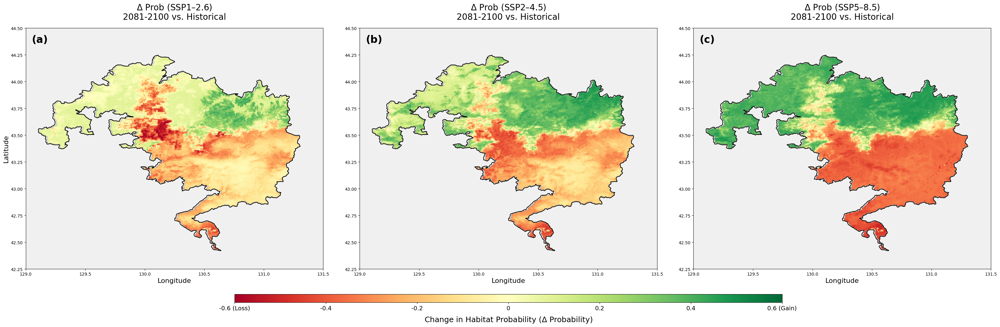

In [ ]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from rasterio.features import rasterize
from rasterio.transform import from_origin

# ==========================================================
# 1. 基础配置与环境准备
# ==========================================================
# 时间段 & 情景
period = "2081-2100"
scenarios = ["126", "245", "585"]
sc_titles = {"126": "SSP1–2.6", "245": "SSP2–4.5", "585": "SSP5–8.5"}

# 输入路径 (请确保这些路径在你的环境中正确)
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/"
# 读取虎豹国家公园边界
hbgy = gpd.read_file("/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp").to_crs("EPSG:4326")
park_geom = hbgy.union_all() # 确保在过滤数据前定义

# 经纬度校正
delta_long = 129.1666666 - 129.0714729
delta_lat  = 43.49499957 - 43.07656553

# 栅格范围与分辨率设置
xmin, xmax = 129.0, 131.5
ymin, ymax = 42.25, 44.5
resolution = 0.0083333
width  = int((xmax - xmin) / resolution)
height = int((ymax - ymin) / resolution)
transform = from_origin(xmin, ymax, resolution, resolution)
extent = (xmin, xmax, ymin, ymax)

# ==========================================================
# 2. 准备基准期数据栅格 (Historical)
# ==========================================================
# 假设 df_tiger_clean 已在内存中
df_hist = df_tiger_clean.copy()
df_hist["lon_c"] = df_hist["long"] + delta_long
df_hist["lat_c"] = df_hist["lat"]  + delta_lat

gdf_hist = gpd.GeoDataFrame(
    df_hist,
    geometry=gpd.points_from_xy(df_hist.lon_c, df_hist.lat_c),
    crs="EPSG:4326"
)
# 使用刚才定义好的 park_geom 进行过滤
gdf_hist = gdf_hist[gdf_hist.within(park_geom)]

shapes_hist = [(geom, value) for geom, value in zip(gdf_hist.geometry, gdf_hist["probability"])]
raster_hist = rasterize(
    shapes_hist,
    out_shape=(height, width),
    transform=transform,
    fill=np.nan,
    dtype="float32"
)

# ==========================================================
# 3. 绘制差异分布图 (Future - Historical)
# ==========================================================
fig = plt.figure(figsize=(36, 11))

gs = gridspec.GridSpec(
    1, 3,
    figure=fig,
    width_ratios=[1, 1, 1],
    wspace=0.05,
    bottom=0.18,
    top=0.90,
    left=0.05,
    right=0.95
)

im_diff = None

for i, sc in enumerate(scenarios):
    ax = fig.add_subplot(gs[0, i])

    fname = f"tiger_{sc}_{period}_density_renamed_prediction.csv"
    fpath = os.path.join(output_dir, fname)

    if not os.path.exists(fpath):
        print(f"跳过丢失文件: {fname}")
        continue

    # 读取并处理未来情景数据
    df_future = pd.read_csv(fpath)
    df_future["lon_c"] = df_future["long"] + delta_long
    df_future["lat_c"] = df_future["lat"]  + delta_lat

    gdf_f = gpd.GeoDataFrame(df_future, geometry=gpd.points_from_xy(df_future.lon_c, df_future.lat_c), crs="EPSG:4326")
    gdf_f = gdf_f[gdf_f.within(park_geom)]

    shapes_f = [(geom, value) for geom, value in zip(gdf_f.geometry, gdf_f["probability"])]
    raster_future = rasterize(shapes_f, out_shape=(height, width), transform=transform, fill=np.nan, dtype="float32")

    # 计算差异: 正值为生境改善(绿)，负值为生境退化(红)
    raster_diff = raster_future - raster_hist

    # 绘制
    im_diff = ax.imshow(
        raster_diff,
        extent=extent,
        origin="upper",
        cmap="RdYlGn",
        vmin=-0.6,
        vmax=0.6
    )

    # 叠加边界
    hbgy.boundary.plot(ax=ax, color="black", linewidth=1.5)

    # 坐标轴与样式
    ax.set_xlabel("Longitude", fontsize=16)
    if i == 0:
        ax.set_ylabel("Latitude", fontsize=16)

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_aspect(0.9)
    ax.set_facecolor("#f0f0f0")

    ax.set_title(f"$\Delta$ Prob ({sc_titles[sc]})\n{period} vs. Historical", fontsize=20, pad=20)
    ax.text(0.02, 0.94, f"({chr(97+i)})", transform=ax.transAxes, fontsize=24, fontweight="bold")

# 设置统一的 Colorbar
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.025])
if im_diff is not None:
    cbar = fig.colorbar(im_diff, cax=cbar_ax, orientation="horizontal")
    cbar.set_label("Change in Habitat Probability ($\Delta$ Probability)", fontsize=18, labelpad=10)
    # 显式设置刻度标签
    cbar.set_ticks([-0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6])
    cbar.ax.set_xticklabels(['-0.6 (Loss)', '-0.4', '-0.2', '0', '0.2', '0.4', '0.6 (Gain)'], fontsize=14)

plt.show() # 直接展示，不保存

<>:62: SyntaxWarning: invalid escape sequence '\D'
<>:62: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_4127/3469389217.py:62: SyntaxWarning: invalid escape sequence '\D'
  plt.xlabel("Change in Probability ($\Delta$ Probability)", fontsize=14)


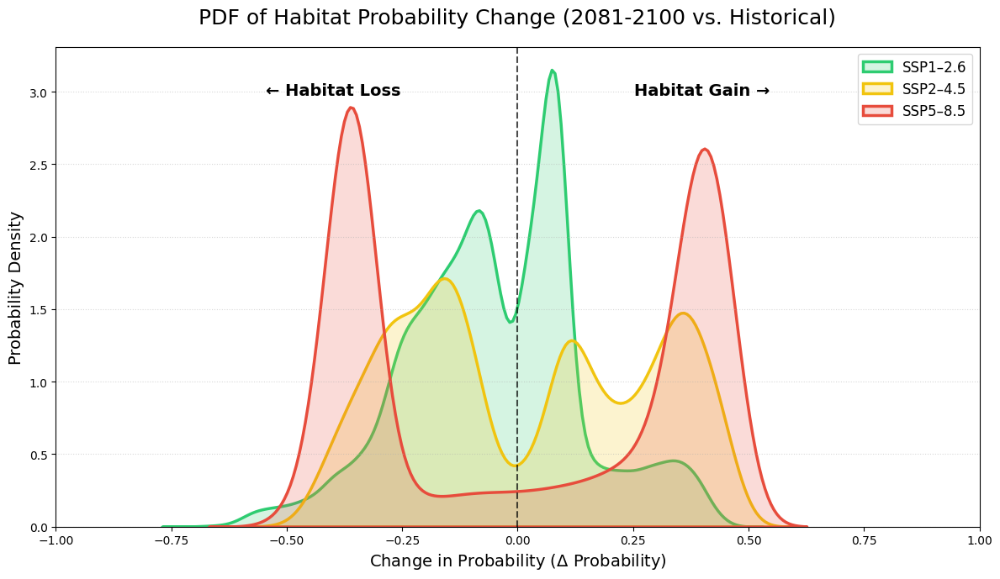

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import geopandas as gpd
from rasterio.features import rasterize

# ==========================================================
# 1. 准备数据与初始化（复用之前的栅格逻辑）
# ==========================================================
all_diff_values_tiger = {} # 存储每个情景的有效差异值

for sc in scenarios:
    fname = f"tiger_{sc}_{period}_density_renamed_prediction.csv"
    fpath = os.path.join(output_dir, fname)

    if not os.path.exists(fpath):
        continue

    # 读取并栅格化未来数据
    df_f = pd.read_csv(fpath)
    df_f["lon_c"] = df_f["long"] + delta_long
    df_f["lat_c"] = df_f["lat"]  + delta_lat
    gdf_f = gpd.GeoDataFrame(df_f, geometry=gpd.points_from_xy(df_f.lon_c, df_f.lat_c), crs="EPSG:4326")
    gdf_f = gdf_f[gdf_f.within(park_geom)]

    shapes_f = [(geom, value) for geom, value in zip(gdf_f.geometry, gdf_f["probability"])]
    raster_future = rasterize(shapes_f, out_shape=(height, width), transform=transform, fill=np.nan, dtype="float32")

    # 计算差异值
    raster_diff = raster_future - raster_hist

    # 提取非空值 (Flatten 并去除 NaN)
    diff_values = raster_diff.flatten()
    diff_values = diff_values[~np.isnan(diff_values)]
    all_diff_values_tiger[sc_titles[sc]] = diff_values

# ==========================================================
# 2. 绘制 PDF 概率密度曲线
# ==========================================================
plt.figure(figsize=(12, 7))

# 设置颜色映射
colors = {"SSP1–2.6": "#2ecc71", "SSP2–4.5": "#f1c40f", "SSP5–8.5": "#e74c3c"}

for sc_name, values in all_diff_values_tiger.items():
    sns.kdeplot(
        values,
        label=sc_name,
        color=colors[sc_name],
        fill=True,
        alpha=0.2,
        linewidth=2.5
    )

# 绘制 X=0 的基准参考线
plt.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.7)

# 图表装饰
plt.title(f"PDF of Habitat Probability Change ({period} vs. Historical)", fontsize=18, pad=20)
plt.xlabel("Change in Probability ($\Delta$ Probability)", fontsize=14)
plt.ylabel("Probability Density", fontsize=14)
plt.xlim(-1.0, 1.0) # 根据你的数据范围调整
plt.grid(axis='y', linestyle=':', alpha=0.5)

# 标注 Loss 和 Gain 区域
plt.text(-0.4, plt.ylim()[1]*0.9, "← Habitat Loss", fontsize=14, color="black", fontweight='bold', ha='center')
plt.text(0.4, plt.ylim()[1]*0.9, "Habitat Gain →", fontsize=14, color="black", fontweight='bold', ha='center')

plt.legend(fontsize=12, loc='upper right')
plt.tight_layout()
plt.show()

### 老虎中心移动情况

In [ ]:
import os
import pandas as pd
import geopandas as gpd

# ==========================================================
# 0. 路径设置
# ==========================================================

# 当前情景（已是 DataFrame，带 probability 列）
df_current = df_tiger_clean.copy()  # 确保不修改原数据

# 未来情景预测结果目录
future_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/"

# 输出结果 CSV
output_csv = "/content/drive/MyDrive/虎豹分布_ML/results_test/Tiger_重心迁移汇总表.csv"

# ==========================================================
# 1. 定义概率加权重心函数（核心公式）
# ==========================================================

def weighted_centroid(df, x="long", y="lat", w="probability"):
    """
    计算概率加权重心 (x̄, ȳ) = (Σ x_i w_i / Σ w_i , Σ y_i w_i / Σ w_i)
    """
    df = df.dropna(subset=[x, y, w])
    wx = (df[x] * df[w]).sum()
    wy = (df[y] * df[w]).sum()
    wsum = df[w].sum()
    return wx / wsum, wy / wsum

# ==========================================================
# 2. 计算 current 情景重心
# ==========================================================

results = []

cx, cy = weighted_centroid(df_current)

results.append({
    "species": "Tiger",
    "scenario": "current",
    "period": "current",
    "centroid_long": cx,
    "centroid_lat": cy
})

# ==========================================================
# 3. 计算未来情景（SSP × period）重心
# ==========================================================

future_files = sorted([
    f for f in os.listdir(future_dir)
    if f.endswith("_prediction.csv")
])

for fname in future_files:
    path = os.path.join(future_dir, fname)
    df = pd.read_csv(path)

    # 确保 probability 列存在
    if "probability" not in df.columns:
        df["probability"] = 1.0

    # 文件名示例：
    # tiger_ssp126_2021-2040_prediction.csv
    parts = fname.replace(".csv", "").split("_")
    scenario = parts[1]        # ssp126 / ssp245 / ssp585
    period   = parts[2]        # 2021-2040 / 2041-2060 ...

    cx, cy = weighted_centroid(df)

    results.append({
        "species": "Tiger",
        "scenario": scenario,
        "period": period,
        "centroid_long": cx,
        "centroid_lat": cy
    })

# ==========================================================
# 4. 汇总为 DataFrame，并排序
# ==========================================================

centroid_table_tiger = pd.DataFrame(results)

period_order = [
    "current",
    "2021-2040",
    "2041-2060",
    "2061-2080",
    "2081-2100"
]

centroid_table_tiger["period"] = pd.Categorical(
    centroid_table_tiger["period"],
    categories=period_order,
    ordered=True
)

centroid_table_tiger = centroid_table_tiger.sort_values(
    ["scenario", "period"]
).reset_index(drop=True)

# ==========================================================
# 5. 保存结果
# ==========================================================

centroid_table_tiger.to_csv(output_csv, index=False)

print(f"输出文件：{output_csv}")
print(centroid_table_tiger)


输出文件：/content/drive/MyDrive/虎豹分布_ML/results_test/Tiger_重心迁移汇总表.csv
   species scenario     period  centroid_long  centroid_lat
0    Tiger      126  2021-2040     130.528229     42.858051
1    Tiger      126  2041-2060     130.511757     42.912320
2    Tiger      126  2061-2080     130.512473     42.921063
3    Tiger      126  2081-2100     130.502488     42.920843
4    Tiger      245  2021-2040     130.522442     42.865898
5    Tiger      245  2041-2060     130.488066     42.924912
6    Tiger      245  2061-2080     130.475738     42.966136
7    Tiger      245  2081-2100     130.440669     42.996606
8    Tiger      585  2021-2040     130.521512     42.875707
9    Tiger      585  2041-2060     130.485607     42.955083
10   Tiger      585  2061-2080     130.370574     43.044517
11   Tiger      585  2081-2100     130.340202     43.071678
12   Tiger  current    current     130.488507     42.879983


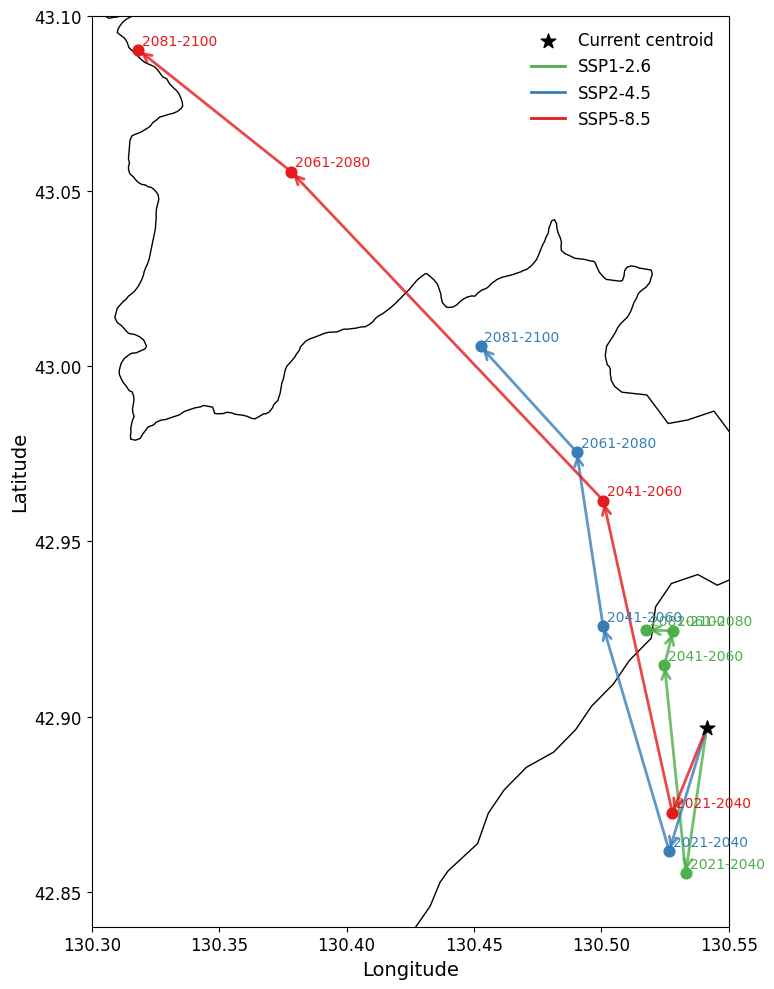

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
import numpy as np

# ==========================================================
# 0. 构造 DataFrame（直接用你提供的数据）
# ==========================================================
data = {
    "species": ["Tiger"]*13,
    "scenario": ["126"]*4 + ["245"]*4 + ["585"]*4 + ["current"],
    "period": [
        "2021-2040","2041-2060","2061-2080","2081-2100",
        "2021-2040","2041-2060","2061-2080","2081-2100",
        "2021-2040","2041-2060","2061-2080","2081-2100",
        "current"
    ],
    "centroid_long": [
        130.532924, 130.524578, 130.527945, 130.517413,
        130.526638, 130.500677, 130.490326, 130.452623,
        130.528060, 130.501006, 130.378454, 130.318517,
        130.541384
    ],
    "centroid_lat": [
        42.855337, 42.914730, 42.924517, 42.924652,
        42.861643, 42.925837, 42.975530, 43.005655,
        42.872581, 42.961637, 43.055564, 43.090311,
        42.896850
    ]
}
df = pd.DataFrame(data)

# 分离 current 和未来情景
df_current = df[df["scenario"] == "current"].copy()
df_future  = df[df["scenario"] != "current"].copy()

# 设置期次顺序
period_order = ["2021-2040","2041-2060","2061-2080","2081-2100"]
df_future.loc[:, "period"] = pd.Categorical(df_future["period"], categories=period_order, ordered=True)

# ==========================================================
# 1. 读取虎豹国家公园边界
# ==========================================================
hbgy = gpd.read_file("/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp")

# ==========================================================
# 2. 绘图设置
# ==========================================================
fig, ax = plt.subplots(figsize=(12,10))  # 放大画布

# 公园边界
hbgy.boundary.plot(ax=ax, color="black", linewidth=1)

# current 重心
ax.scatter(
    df_current.centroid_long,
    df_current.centroid_lat,
    color="black",
    s=120,
    marker="*",
    zorder=5,
    label="Current centroid"
)

# SSP 情景样式
scenario_styles = {
    "126": {"color": "#4daf4a", "label": "SSP1-2.6", "offset": 0.0002},
    "245": {"color": "#377eb8", "label": "SSP2-4.5", "offset": 0.0000},
    "585": {"color": "#e41a1c", "label": "SSP5-8.5", "offset": -0.0002},
}

# 绘制每个情景的重心迁移
for scen, style in scenario_styles.items():
    df_s = df_future[df_future["scenario"] == scen].sort_values("period")
    x_prev = df_current.centroid_long.values[0]
    y_prev = df_current.centroid_lat.values[0]

    for i, row in df_s.iterrows():
        # 应用轻微偏移避免线重叠
        x = row.centroid_long + style["offset"]
        y = row.centroid_lat

        # 箭头
        arrow = FancyArrowPatch(
            (x_prev, y_prev),
            (x, y),
            arrowstyle="->",
            color=style["color"],
            linewidth=2,
            mutation_scale=15,
            alpha=0.8,
            zorder=3
        )
        ax.add_patch(arrow)

        # 重心点
        ax.scatter(x, y, color=style["color"], s=60, zorder=4)

        # 时间标注
        ax.text(
            x + 0.0015, y + 0.0015, row.period,
            fontsize=10,
            color=style["color"],
            zorder=6
        )

        x_prev, y_prev = x, y

    # 图例占位点
    ax.plot([], [], color=style["color"], linewidth=2, label=style["label"])

# ==========================================================
# 3. 坐标轴和出版级美化
# ==========================================================
ax.set_xlabel("Longitude", fontsize=14)
ax.set_ylabel("Latitude", fontsize=14)

# 调整显示范围，让重心移动占比更大
ax.set_xlim(130.3, 130.55)
ax.set_ylim(42.84, 43.1)

ax.tick_params(labelsize=12)
ax.set_facecolor("white")

ax.legend(frameon=False, fontsize=12, loc="upper right")

plt.tight_layout()
plt.show()


## 豹子分布预测

### 豹子数据集构建（KDE方法）

In [ ]:
# 数据集构建
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.preprocessing import minmax_scale
np.random.seed(123)

# ==dbb数据集构建==
# ==step1：数据预处理：剔除den=-9999存在与不存在样本==
file_path = "/content/drive/MyDrive/虎豹分布_ML/animal/history/his_dbb_density.csv"  # 若文件名称也需修改，可在此处调整
df_dbb_original = pd.read_csv(file_path)
print("dbb存在样本数量：",len(df_dbb_original[df_dbb_original['occ']==1]))
print("dbb不存在样本数量：", len(df_dbb_original[(df_dbb_original['occ'] == 0)]))

# 找出任意一个 density 列为 -9999 的行并剔除行（在图示中对应边界点）
mask_dbb_invalid = (
    (df_dbb_original["mhl_density"] == -9999) |
    (df_dbb_original["yz_density"] == -9999) |
    (df_dbb_original["dbp_density"] == -9999)
)
df_dbb_clean = df_dbb_original.loc[~mask_dbb_invalid].copy()

dbb存在样本数量： 3201
dbb不存在样本数量： 21878


In [ ]:
# --- Step 0: 基本参数 ---
X_COL = 'long'
Y_COL = 'lat'

# --- Step 1: 转换为 GeoDataFrame 并投影 (UTM，以米为单位) ---
UTM_CRS = "EPSG:32651"  # 假设使用 UTM 51N
geometry_dbb = [Point(xy) for xy in zip(df_dbb_clean[X_COL], df_dbb_clean[Y_COL])]
gdf_dbb = gpd.GeoDataFrame(df_dbb_clean, geometry=geometry_dbb, crs="EPSG:4326")
gdf_dbb = gdf_dbb.to_crs(UTM_CRS)

# --- Step 2: 分离存在点和伪缺席点 ---
gdf_dbb_presence = gdf_dbb[gdf_dbb['occ'] == 1].copy()
gdf_dbb_absence = gdf_dbb[gdf_dbb['occ'] == 0].copy()  # 所有缺席点都可用

# --- Step 3: TSM 加权采样伪缺席点 ---
# 3.1 准备 KDE 输入数据
pres_coords = np.vstack([gdf_dbb_presence.geometry.x, gdf_dbb_presence.geometry.y])
pa_coords = np.vstack([gdf_dbb_absence.geometry.x, gdf_dbb_absence.geometry.y])

# 3.2 计算 KDE (考虑出现频数加权)
try:
    weights = gdf_dbb_presence['NUMPOINTS'].values
    kde = gaussian_kde(pres_coords, weights=weights)
except np.linalg.LinAlgError:
    print("KDE 自动带宽失败，尝试手动设置 bw=0.01")
    kde = gaussian_kde(pres_coords, bw_method=0.01)

# 3.3 在 PA 候选点上评估密度，得到 Bias Map
pa_density = kde.evaluate(pa_coords)

# 3.4 归一化密度并计算逆权重
eps = 1e-6
pa_density_normalized = minmax_scale(pa_density) + eps
pa_weights = 1 / pa_density_normalized  # 密度低 -> 权重高

# 3.5 平衡采样数量
N_presence = len(gdf_dbb_presence)
N_pa_required = N_presence

if len(gdf_dbb_absence) <= N_pa_required:
    print(f"PA 候选点不足 ({len(gdf_dbb_absence)} < {N_pa_required})，直接使用全部缺席点")
    pa_samples_final = gdf_dbb_absence.copy()
else:
    sample_indices = np.random.choice(
        gdf_dbb_absence.index,
        size=N_pa_required,
        replace=False,
        p=pa_weights / np.sum(pa_weights)
    )
    pa_samples_final = gdf_dbb_absence.loc[sample_indices].copy()

# --- Step 4: 合并最终数据集 ---
cols_to_drop = [col for col in gdf_dbb_presence.columns if col in ['geometry', 'buffer_geom']]
df_final_pres = gdf_dbb_presence.drop(columns=cols_to_drop, errors='ignore')
df_final_pa = pa_samples_final.drop(columns=cols_to_drop, errors='ignore')

gdf_final_dbb = pd.concat([df_final_pres, df_final_pa], ignore_index=True)

# --- 输出信息 ---
print(f"总 PA 候选点数: {len(gdf_dbb_absence)}")
print(f"最终 PA 样本数: {len(gdf_final_dbb[gdf_final_dbb['occ'] == 0])}")
print(f"最终总样本数: {len(gdf_final_dbb)}")

总 PA 候选点数: 20071
最终 PA 样本数: 3129
最终总样本数: 6258


In [ ]:
import os

# 定义保存路径
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/采样数据集/"

# 保存CSV（若有geometry列会自动转为WKT字符串）
gdf_final_dbb.to_csv(os.path.join(save_path, "gdf_final_dbb.csv"), index=False, encoding="utf-8")
print("CSV文件已保存至：", os.path.join(save_path, "gdf_final_dbb.csv"))

CSV文件已保存至： /content/drive/MyDrive/虎豹分布_ML/results_test/采样数据集/gdf_final_dbb.csv


### 豹子历史分布-baseline

In [ ]:
# 集成机器学习方法-使用5种方法，用于预测虎豹分布范围-东北虎
# 集成机器学习方法-使用5种方法，用于预测虎豹分布范围-东北虎
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay)
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import joblib  # 用于模型保存
import random

# ==================== 数据加载与预处理 ====================
# 读取训练数据
df_dbb = gdf_final_dbb
y_dbb = df_dbb['occ']
X_dbb = df_dbb.iloc[:, 5:30]
# 这里后续也许要在模型中加入权重的因素

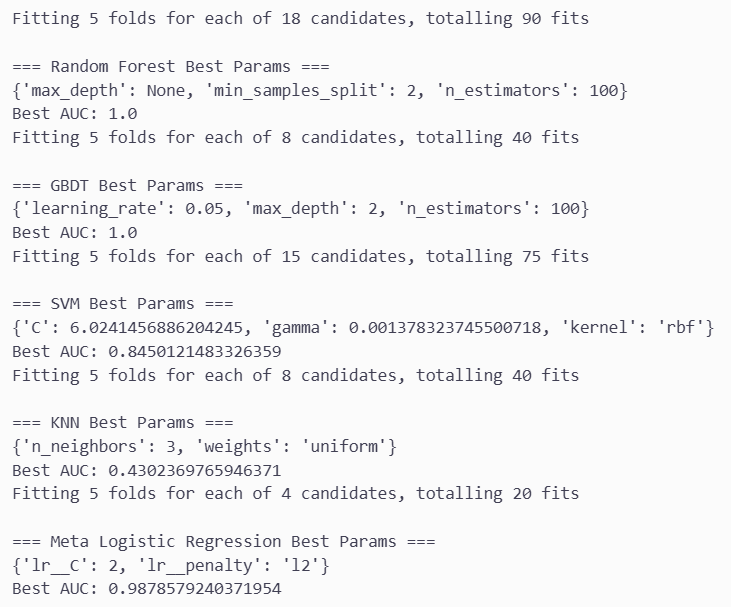

In [ ]:
# ==================== stacking集成模型构建 ====================
base_models = [

    # 1. Random Forest（无需标准化）
    ('rf', RandomForestClassifier(
        n_estimators=100,
        max_depth=None,
        min_samples_split=2,
        class_weight='balanced',
        random_state=42
    )),

    # 2. Gradient Boosting（无需标准化）
    ('gbdt', GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.05,
        max_depth=2,
        random_state=42
    )),

    # 3. KNN（调参时使用了Scaler → 必须放入 Pipeline）
    ('knn', Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(
            n_neighbors=3,
            weights='uniform'
        ))
    ])),

    # 4. SVM（调参时使用了Scaler → 必须放入 Pipeline）
    ('svm', Pipeline([
        ('scaler', StandardScaler()),
        ('svm', SVC(
            C=6.0241456886204245,
            gamma=0.001378323745500718,
            kernel='rbf',
            probability=True,
            random_state=42
        ))
    ])),

    # 5. GaussianNB（无需标准化）
    ('nb', GaussianNB())
]

meta_model = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(
        C=2,
        penalty='l2',
        class_weight='balanced',
        max_iter=1000
    ))
])

stacking_model_dbb = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_model,
    stack_method='auto',
    n_jobs=-1,
    passthrough=False
)

model_pipeline_dbb = Pipeline([
    ('model', stacking_model_dbb)
])


In [ ]:
# ==================== 模型训练 ====================
folds = 5
skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=123)

accuracy_list = []
precision_list = []
recall_list = []
f1_list = []
auc_list = []

y_true_all_dbb = []
y_pred_all_dbb = []
y_proba_all_dbb = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X_dbb, y_dbb), 1):
    print(f"正在训练第 {fold}/{folds} 折...")

    X_train, X_test = X_dbb.iloc[train_idx], X_dbb.iloc[test_idx]
    y_train, y_test = y_dbb[train_idx], y_dbb[test_idx]

    # 训练
    model_pipeline_dbb.fit(X_train, y_train)

    # 预测
    y_pred = model_pipeline_dbb.predict(X_test)
    y_proba = model_pipeline_dbb.predict_proba(X_test)[:, 1]

    # 累积结果
    y_true_all_dbb.extend(y_test)
    y_pred_all_dbb.extend(y_pred)
    y_proba_all_dbb.extend(y_proba)

    # 指标
    accuracy_list.append(accuracy_score(y_test, y_pred))
    precision_list.append(precision_score(y_test, y_pred))
    recall_list.append(recall_score(y_test, y_pred))
    f1_list.append(f1_score(y_test, y_pred))
    auc_list.append(roc_auc_score(y_test, y_proba))

# 打印结果
print("\n========== 交叉验证平均指标 ==========")
print(f"Accuracy:  {np.mean(accuracy_list):.3f}")
print(f"Precision: {np.mean(precision_list):.3f}")
print(f"Recall:    {np.mean(recall_list):.3f}")
print(f"F1 Score:  {np.mean(f1_list):.3f}")
print(f"AUC-ROC:   {np.mean(auc_list):.3f}")

正在训练第 1/5 折...
正在训练第 2/5 折...
正在训练第 3/5 折...
正在训练第 4/5 折...
正在训练第 5/5 折...

========== 交叉验证平均指标 ==========
Accuracy:  0.908
Precision: 0.948
Recall:    0.864
F1 Score:  0.904
AUC-ROC:   0.970


### 豹子历史分布绘图

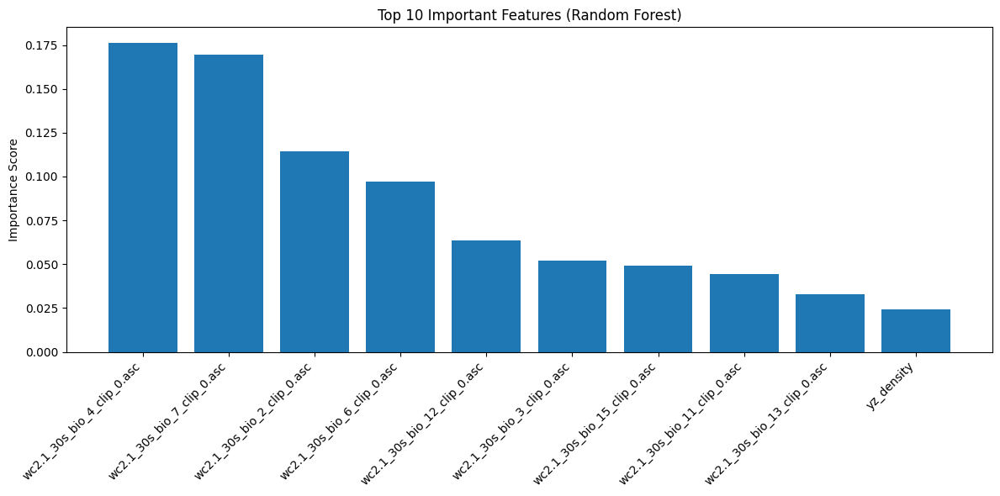

In [ ]:
if 'rf' in stacking_model_dbb.named_estimators_:
    feature_importance = stacking_model_dbb.named_estimators_['rf'].feature_importances_
    sorted_idx = np.argsort(feature_importance)[::-1]

    plt.figure(figsize=(12, 6))
    plt.title("Top 10 Important Features (Random Forest)")
    plt.bar(range(10), feature_importance[sorted_idx][:10])
    plt.xticks(range(10), X_dbb.columns[sorted_idx][:10], rotation=45, ha='right')
    plt.ylabel("Importance Score")
    plt.tight_layout()
    plt.show()




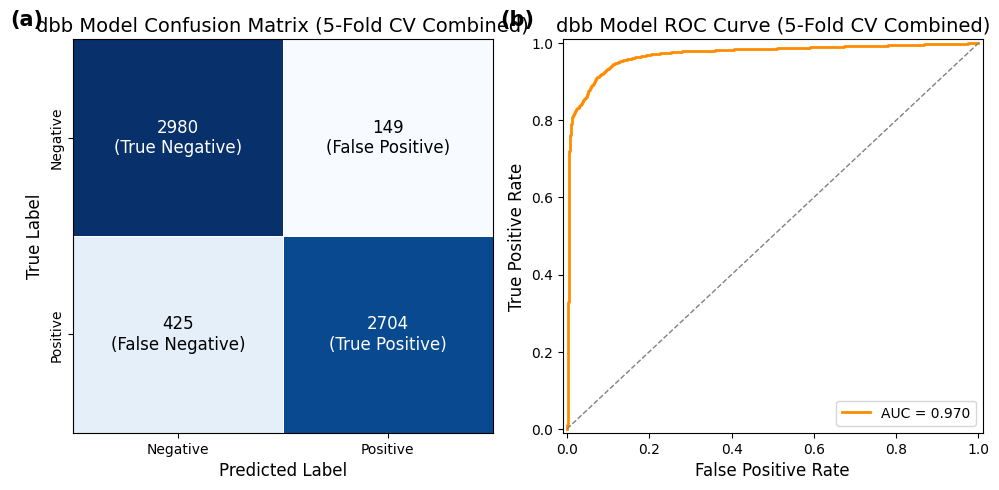

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

# ======================
# 计算dbb模型评估指标
# ======================
cm = confusion_matrix(y_true_all_dbb, y_pred_all_dbb)
roc_auc = roc_auc_score(y_true_all_dbb, y_proba_all_dbb)
fpr, tpr, thresholds = roc_curve(y_true_all_dbb, y_proba_all_dbb)

# ======================
# 1×2 子图布局
# ======================
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# ======================
# (a) dbb模型混淆矩阵
# ======================
ax = axes[0]

# 自定义颜色：TN、TP 白字；FP、FN 黑字
annot_colors = [
    ["white", "black"],  # TN, FP
    ["black", "white"]   # FN, TP
]

annot_text = [
    [f"{cm[0,0]}\n(True Negative)", f"{cm[0,1]}\n(False Positive)"],
    [f"{cm[1,0]}\n(False Negative)", f"{cm[1,1]}\n(True Positive)"]
]

# 绘图
sns.heatmap(
    cm, annot=annot_text, fmt='',
    cmap='Blues', cbar=False,
    linewidths=0.5, linecolor='white',
    xticklabels=['Negative', 'Positive'],
    yticklabels=['Negative', 'Positive'],
    ax=ax,
    annot_kws={"size": 12}
)

# 修改注释文字的颜色
for text_obj, color in zip(ax.texts, sum(annot_colors, [])):
    text_obj.set_color(color)

# 坐标轴刻度
ax.tick_params(axis='both', labelsize=10)

# 加上坐标轴的边框线
for spine in ax.spines.values():
    spine.set_visible(True)

# 标题：居中，但左上角加粗 (a)
ax.set_title(f"dbb Model Confusion Matrix ({folds}-Fold CV Combined)", fontsize=14)
ax.text(-0.15, 1.05, "(a)", transform=ax.transAxes,
        fontsize=15, fontweight='bold', va='center')

ax.set_xlabel("Predicted Label", fontsize=12)
ax.set_ylabel("True Label", fontsize=12)

# ======================
# (b) dbb模型ROC 曲线
# ======================
ax2 = axes[1]

# ROC 曲线
ax2.plot(fpr, tpr, lw=2, color='darkorange',
         label=f"AUC = {roc_auc:.3f}")

# 对角线
ax2.plot([0, 1], [0, 1], linestyle='--', lw=1, color='gray')

# 坐标轴样式
ax2.set_xlim([-0.01, 1.01])
ax2.set_ylim([-0.01, 1.01])
ax2.set_xlabel("False Positive Rate", fontsize=12)
ax2.set_ylabel("True Positive Rate", fontsize=12)

# 标题：居中，但左上角加粗 (b)
ax2.set_title(f"dbb Model ROC Curve ({folds}-Fold CV Combined)", fontsize=14)
ax2.text(-0.15, 1.05, "(b)", transform=ax2.transAxes,
         fontsize=15, fontweight='bold', va='center')

ax2.legend(fontsize=10, loc="lower right")

# 不画网格线
ax2.grid(False)

# 加上坐标轴边框线
for spine in ax2.spines.values():
    spine.set_visible(True)

plt.tight_layout()
plt.show()

In [ ]:
# 空间叠置精度图（栅格版）
import geopandas as gpd
import pandas as pd
import numpy as np
import rasterio
from rasterio.transform import from_origin
from rasterio.features import rasterize
from rasterio import plot
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap

# ==========================================================
# 0. 偏移量（固定，全图一致）
# ==========================================================
delta_long = 0.0951937
delta_lat  = 0.41843404

# ==========================================================
# 1. 修正经纬度
# ==========================================================
df_dbb["long_corrected"] = df_dbb["long"] + delta_long
df_dbb["lat_corrected"]  = df_dbb["lat"]  + delta_lat

# ==========================================================
# 2. 用最终模型重新拟合并预测整个数据集
# ==========================================================
model_pipeline_dbb.fit(X_dbb, y_dbb)
df_dbb["prediction"] = model_pipeline_dbb.predict(X_dbb)

# ==========================================================
# 3. 转换为 GeoDataFrame + 裁剪到公园范围
# ==========================================================
gdf = gpd.GeoDataFrame(
    df_dbb,
    geometry=gpd.points_from_xy(df_dbb.long_corrected, df_dbb.lat_corrected),
    crs="EPSG:4326"
)

# 加载虎豹国家公园 shp 并统一坐标系
hbgy = gpd.read_file('/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp')
hbgy = hbgy.to_crs(gdf.crs)

# 裁剪点数据到公园范围（避免栅格化超出边界）
mask = gdf.within(hbgy.unary_union)
gdf_clipped = gdf[mask]

# ==========================================================
# 4. 分类三类点（栅格化前的数据源）
# ==========================================================
gdf_occ1         = gdf_clipped[gdf_clipped.occ == 1]                     # 真实存在点
gdf_pred1        = gdf_clipped[gdf_clipped.prediction == 1]              # 预测存在点
gdf_correct_pred = gdf_clipped[(gdf_clipped.occ == 1) & (gdf_clipped.prediction == 1)]  # 正确预测

# ==========================================================
# 5. 栅格化参数设置（匹配你的坐标范围）
# ==========================================================
# 固定坐标范围（和你散点图一致）
xmin, xmax = 129.0, 131.5
ymin, ymax = 42.25, 44.5
resolution = 0.0083333  # 栅格分辨率（和你的示例一致，约1km）

# 计算栅格尺寸和转换矩阵
width = int((xmax - xmin) / resolution)
height = int((ymax - ymin) / resolution)
transform = from_origin(xmin, ymax, resolution, resolution)

# ==========================================================
# 6. 分别栅格化三类点
# ==========================================================
# 真实存在点栅格（值=1）
shapes_occ1 = [(geom, 1) for geom in gdf_occ1.geometry]
raster_occ1 = rasterize(
    shapes_occ1, out_shape=(height, width), transform=transform,
    fill=0, dtype=np.uint8
)

# 预测存在点栅格（值=1）
shapes_pred1 = [(geom, 1) for geom in gdf_pred1.geometry]
raster_pred1 = rasterize(
    shapes_pred1, out_shape=(height, width), transform=transform,
    fill=0, dtype=np.uint8
)

# 正确预测点栅格（值=1）
shapes_correct = [(geom, 1) for geom in gdf_correct_pred.geometry]
raster_correct = rasterize(
    shapes_correct, out_shape=(height, width), transform=transform,
    fill=0, dtype=np.uint8
)

/tmp/ipykernel_4127/381687837.py:45: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  mask = gdf.within(hbgy.unary_union)


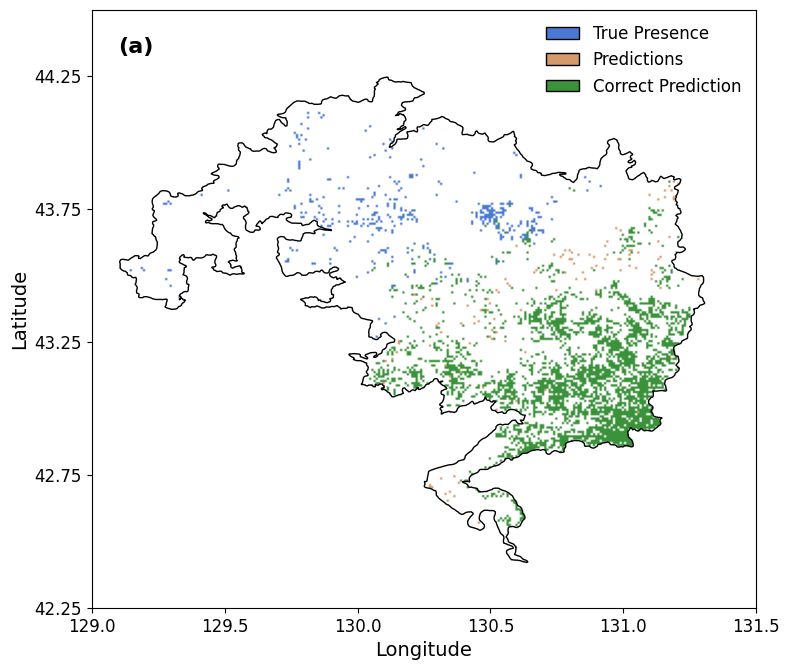

In [ ]:
# ==========================================================
# 7. 绘图（修复栅格叠加遮挡问题）
# ==========================================================
fig, ax = plt.subplots(figsize=(8, 10))

# --- 绘制虎豹国家公园边界 ---
hbgy.boundary.plot(ax=ax, color='black', linewidth=1)

# --- 【关键修改】重新定义栅格（用不同数值区分三类区域） ---
# 创建一个空栅格（初始值=0）
raster_combined = np.zeros((height, width), dtype=np.uint8)

# 1. 正确预测区域 → 赋值1（底层）
raster_combined[raster_correct == 1] = 1

# 2. 真实存在但未正确预测的区域 → 赋值2（中层）
# （真实存在 且 不是正确预测）
raster_occ_only = (raster_occ1 == 1) & (raster_correct == 0)
raster_combined[raster_occ_only] = 2

# 3. 预测存在但未正确预测的区域 → 赋值3（顶层）
# （预测存在 且 不是正确预测）
raster_pred_only = (raster_pred1 == 1) & (raster_correct == 0)
raster_combined[raster_pred_only] = 3

# --- 【关键修改】自定义颜色映射（对应三类区域） ---
cmap_combined = ListedColormap([
    'white',       # 0: 无数据
    '#3a923a',     # 1: 正确预测
    '#4a79d4',     # 2: 真实存在（非正确预测）
    '#d49a6a'      # 3: 预测存在（非正确预测）
])

# 绘制合并后的栅格
plot.show(
    raster_combined,
    transform=transform,
    ax=ax,
    cmap=cmap_combined
)

# ----------------------------------------------------------
# 出版级美化（保持原样式）
# ----------------------------------------------------------
# 1. 坐标轴设置
ax.set_xlabel("Longitude", fontsize=14)
ax.set_ylabel("Latitude", fontsize=14)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# 2. 刻度设置
ax.set_xticks(np.arange(129.0, 131.5 + 0.001, 0.5))
ax.set_yticks(np.arange(42.25, 44.25 + 0.001, 0.5))
ax.tick_params(axis='both', labelsize=12)

# 3. 图例（匹配颜色映射）
legend_elements = [
    Patch(facecolor='#4a79d4', edgecolor='black', label='True Presence'),
    Patch(facecolor='#d49a6a', edgecolor='black', label='Predictions'),
    Patch(facecolor='#3a923a', edgecolor='black', label='Correct Prediction')
]
leg = ax.legend(
    handles=legend_elements,
    loc="upper right",
    frameon=False,
    fontsize=12
)

# 4. 左上角 (a) 标注
ax.text(
    129.1, 44.4,
    "(a)",
    fontsize=16,
    fontweight='bold',
    va='top',
    ha='left'
)

# 5. 背景白色
ax.set_facecolor("white")

plt.tight_layout()
plt.show()

In [ ]:
# ==========================================================
# 8. 计算空间叠置百分比
# ==========================================================

# 统计各类栅格的数量
count_correct = np.sum(raster_combined == 1)  # 绿色：正确预测
count_omitted = np.sum(raster_combined == 2)  # 蓝色：漏报（真实存在但未预测到）

# 计算总的实际观测栅格数 (绿色 + 蓝色)
total_observed = count_correct + count_omitted

# 计算百分比
if total_observed > 0:
    overlap_percentage = (count_correct / total_observed) * 100
    print(f"--- 空间叠置分析结果 ---")
    print(f"正确预测的栅格数 (绿色): {count_correct}")
    print(f"未被覆盖的观测栅格数 (蓝色): {count_omitted}")
    print(f"正确预测占比 (绿色 / (绿色+蓝色)): {overlap_percentage:.2f}%")
else:
    print("错误：未发现在公园范围内的实际观测点栅格。")

--- 空间叠置分析结果 ---
正确预测的栅格数 (绿色): 2753
未被覆盖的观测栅格数 (蓝色): 375
正确预测占比 (绿色 / (绿色+蓝色)): 88.01%


In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import os

# -----------------------------
# 0. 保存路径
# -----------------------------
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/"
os.makedirs(save_path, exist_ok=True)

# -----------------------------
# 1. 列名清洗
# -----------------------------
def clean_feature_name(name):
    if name == 'hm.asc':
        return 'human activities'
    if 'bio_' in name:
        return f"bio{name.split('bio_')[1].split('_')[0]}"
    return name

# -----------------------------
# 2. 背景数据
# -----------------------------
X_background_dbb = shap.kmeans(X_dbb, 50)

# -----------------------------
# 3. 预测函数
# -----------------------------
def predict_proba_func_dbb(x):
    df_temp = pd.DataFrame(x, columns=X_dbb.columns)
    return model_pipeline_dbb.predict_proba(df_temp)[:, 1]

# -----------------------------
# 4. Explainer
# -----------------------------
explainer_dbb = shap.KernelExplainer(
    predict_proba_func_dbb,
    X_background_dbb
)

# -----------------------------
# 5. SHAP 计算
# -----------------------------
X_sample_dbb = X_dbb.sample(500, random_state=42)

print("DBB: 正在计算 SHAP 值...")

shap_values_dbb = explainer_dbb.shap_values(
    X_sample_dbb,
    nsamples=100
)

print("DBB: SHAP 计算完成")

# -----------------------------
# 6. 显示数据
# -----------------------------
X_display_dbb = X_sample_dbb.copy()
X_display_dbb.columns = [
    clean_feature_name(c) for c in X_display_dbb.columns
]

# -----------------------------
# 7. 配色（保持一致便于对比）
# -----------------------------
custom_colors = ['#f7fcf0', '#e0f3db', '#a8ddb5',
                 '#4eb3d3', '#2b8cbe', '#08589e']

cmap_custom = LinearSegmentedColormap.from_list(
    "custom_blue_green", custom_colors
)

# -----------------------------
# 8. 绘图
# -----------------------------
plt.figure(figsize=(12, 10), dpi=300)

shap.summary_plot(
    shap_values_dbb,
    X_display_dbb,
    show=False,
    cmap=cmap_custom
)

plt.ylabel("Features", fontsize=14, fontweight='bold', labelpad=20)
plt.title("SHAP Summary Plot (dbb)", fontsize=16, fontweight='bold', pad=20)

plt.tight_layout()

# -----------------------------
# 9. 保存
# -----------------------------
save_file_dbb = os.path.join(
    save_path,
    "dbb_SHAP_Summary_Plot.png"
)

plt.savefig(save_file_dbb, dpi=300, bbox_inches='tight')
plt.show()

print(f"DBB 图已保存: {save_file_dbb}")


DBB: 正在计算 SHAP 值...


  0%|          | 0/500 [00:00<?, ?it/s]

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



### 豹子未来情形预测

In [ ]:
# ============= 当前情景预测（Tiger） =============

# ---- 只保留训练时的变量列 ----
X_current = df_dbb_clean[X_dbb.columns]

# ---- 剔除含 -9999 的行（保持原来的 mask） ----
mask = (X_current != -9999).all(axis=1)
X_clean = X_current[mask]

# ---- 预测分类 ----
pred = model_pipeline_dbb.predict(X_clean)

# ---- 预测概率 ----
proba = model_pipeline_dbb.predict_proba(X_clean)[:, 1]

# ---- 把结果直接写回原 df_dbb_clean ----
df_dbb_clean.loc[mask, "prediction"] = pred
df_dbb_clean.loc[mask, "probability"] = proba

# 查看前几行确认
df_dbb_clean.head()


,id,long,lat,NUMPOINTS,occ,dem.asc,hm.asc,slope.asc,wc2.1_30s_bio_10_clip_0.asc,wc2.1_30s_bio_11_clip_0.asc,...,wc2.1_30s_bio_5_clip_0.asc,wc2.1_30s_bio_6_clip_0.asc,wc2.1_30s_bio_7_clip_0.asc,wc2.1_30s_bio_8_clip_0.asc,wc2.1_30s_bio_9_clip_0.asc,mhl_density,yz_density,dbp_density,prediction,probability
13,524.0,129.021473,43.134899,0.0,0.0,1105.0,14.0,89.986990,15.866667,-15.933333,...,22.2,-24.3,46.5,15.866667,-15.933333,2.831592,1.368590,2.072843,0.0,0.137308
14,525.0,129.021473,43.126566,0.0,0.0,1025.0,14.0,89.995580,16.300000,-15.616667,...,22.6,-23.9,46.5,16.300000,-15.616667,2.332159,1.237149,2.233674,0.0,0.128724
15,526.0,129.021473,43.118232,0.0,0.0,987.0,14.0,89.995895,16.666666,-15.283334,...,22.9,-23.6,46.5,16.666666,-15.283334,2.051256,1.168023,2.320361,0.0,0.117260
16,527.0,129.021473,43.109899,0.0,0.0,784.0,14.0,89.994020,17.183332,-14.866667,...,23.4,-23.2,46.6,17.183332,-14.866667,2.518931,1.309599,2.191105,0.0,0.125335
17,528.0,129.021473,43.101566,0.0,0.0,772.0,14.0,89.994690,17.200000,-14.816667,...,23.4,-23.1,46.5,17.200000,-14.816667,2.547137,1.324449,2.167454,0.0,0.119648


In [ ]:
# ============= 未来情景预测 =============
import os
import pandas as pd
import numpy as np

# 路径设置
input_dir = "/content/drive/MyDrive/虎豹分布_ML/animal/envi_density/dbb/"
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/"
os.makedirs(output_dir, exist_ok=True)

# 训练好的模型（已 fit 完成）
model_trained = model_pipeline_dbb   # 不需要 scaler_trained 了

# 未来情景文件列表
file_list = [
    "dbb_126_2021-2040_density_renamed.csv",
    "dbb_126_2041-2060_density_renamed.csv",
    "dbb_126_2061-2080_density_renamed.csv",
    "dbb_126_2081-2100_density_renamed.csv",
    "dbb_245_2021-2040_density_renamed.csv",
    "dbb_245_2041-2060_density_renamed.csv",
    "dbb_245_2061-2080_density_renamed.csv",
    "dbb_245_2081-2100_density_renamed.csv",
    "dbb_585_2021-2040_density_renamed.csv",
    "dbb_585_2041-2060_density_renamed.csv",
    "dbb_585_2061-2080_density_renamed.csv",
    "dbb_585_2081-2100_density_renamed.csv",
]

# 主循环
for fname in file_list:

    print(f"正在处理：{fname}")

    file_path = os.path.join(input_dir, fname)
    df = pd.read_csv(file_path)

    # ---- 提取地理列 (ID, long, lat) ----
    geo_info = df.iloc[:, 0:3]

    # ---- 只保留训练时的变量列 ----
    X_future = df[X_dbb.columns]

    # ---- 剔除含 -9999 的行 ----
    mask = (X_future != -9999).all(axis=1)
    X_clean = X_future[mask]
    geo_clean = geo_info[mask]

    print(f"原样本量 {len(df)} → 剔除后 {len(X_clean)}")

    # ------------- (无需手动标准化) -------------
    # 模型内部会自动使用各自 pipeline 的 StandardScaler()

    # (1) 预测分类
    pred = model_trained.predict(X_clean)

    # (2) 预测概率
    proba = model_trained.predict_proba(X_clean)[:, 1]

    # 保存结果
    result = pd.DataFrame({
        "ID": geo_clean.iloc[:, 0],
        "long": geo_clean.iloc[:, 1],
        "lat": geo_clean.iloc[:, 2],
        "prediction": pred,
        "probability": proba
    })

    save_path = os.path.join(output_dir, fname.replace(".csv", "_prediction.csv"))
    result.to_csv(save_path, index=False)

    print(f"已保存：{save_path}\n")

print("全部未来情景预测完成！")

正在处理：dbb_126_2021-2040_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/dbb_126_2021-2040_density_renamed_prediction.csv

正在处理：dbb_126_2041-2060_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/dbb_126_2041-2060_density_renamed_prediction.csv

正在处理：dbb_126_2061-2080_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/dbb_126_2061-2080_density_renamed_prediction.csv

正在处理：dbb_126_2081-2100_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/dbb_126_2081-2100_density_renamed_prediction.csv

正在处理：dbb_245_2021-2040_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/dbb_245_2021-2040_density_renamed_prediction.csv

正在处理：dbb_245_2041-2060_density_renamed.csv
原样本量 25079 → 剔除后 23200
已保存：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/

In [ ]:
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/"

# 找所有 prediction 文件
pred_files = [f for f in os.listdir(output_dir) if f.endswith("_prediction.csv")]

summary_list = []

for fname in pred_files:
    path = os.path.join(output_dir, fname)
    df = pd.read_csv(path)

    # 预测为 1、0 的数量
    n1 = (df["prediction"] == 1).sum()
    n0 = (df["prediction"] == 0).sum()

    # 各自概率平均值
    avg_prob_1 = df.loc[df["prediction"] == 1, "probability"].mean()
    avg_prob_0 = df.loc[df["prediction"] == 0, "probability"].mean()

    summary_list.append({
        "file": fname,
        "n_predict_1": n1,
        "n_predict_0": n0,
        "avg_prob_1": avg_prob_1,
        "avg_prob_0": avg_prob_0
    })

summary_df = pd.DataFrame(summary_list)

# 输出汇总表
summary_df

,file,n_predict_1,n_predict_0,avg_prob_1,avg_prob_0
0,dbb_126_2021-2040_density_renamed_prediction.csv,18241,4959,0.868920,0.368534
1,dbb_126_2041-2060_density_renamed_prediction.csv,22372,828,0.913702,0.370545
2,dbb_126_2061-2080_density_renamed_prediction.csv,22678,522,0.920078,0.360734
3,dbb_126_2081-2100_density_renamed_prediction.csv,22941,259,0.930129,0.320242
4,dbb_245_2021-2040_density_renamed_prediction.csv,18029,5171,0.873111,0.365396
5,dbb_245_2041-2060_density_renamed_prediction.csv,22953,247,0.927574,0.331419
6,dbb_245_2061-2080_density_renamed_prediction.csv,23168,32,0.959090,0.310002
7,dbb_245_2081-2100_density_renamed_prediction.csv,23150,50,0.958923,0.367383
8,dbb_585_2021-2040_density_renamed_prediction.csv,20102,3098,0.862758,0.378583
9,dbb_585_2041-2060_density_renamed_prediction.csv,23167,33,0.959953,0.298337


In [ ]:
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/"

# 找所有 prediction 文件
pred_files = [f for f in os.listdir(output_dir) if f.endswith("_prediction.csv")]

summary_list = []

for fname in pred_files:
    path = os.path.join(output_dir, fname)
    df = pd.read_csv(path)

    # 预测为 1、0 的数量
    n1 = (df["prediction"] == 1).sum()
    n0 = (df["prediction"] == 0).sum()

    # 各自概率平均值
    avg_prob_1 = df.loc[df["prediction"] == 1, "probability"].mean()
    avg_prob_0 = df.loc[df["prediction"] == 0, "probability"].mean()

    summary_list.append({
        "file": fname,
        "n_predict_1": n1,
        "n_predict_0": n0,
        "avg_prob_1": avg_prob_1,
        "avg_prob_0": avg_prob_0
    })

summary_df = pd.DataFrame(summary_list)

# 输出汇总表
summary_df

,file,n_predict_1,n_predict_0,avg_prob_1,avg_prob_0
0,dbb_126_2021-2040_density_renamed_prediction.csv,18241,4959,0.868920,0.368534
1,dbb_126_2041-2060_density_renamed_prediction.csv,22372,828,0.913702,0.370545
2,dbb_126_2061-2080_density_renamed_prediction.csv,22678,522,0.920078,0.360734
3,dbb_126_2081-2100_density_renamed_prediction.csv,22941,259,0.930129,0.320242
4,dbb_245_2021-2040_density_renamed_prediction.csv,18029,5171,0.873111,0.365396
5,dbb_245_2041-2060_density_renamed_prediction.csv,22953,247,0.927574,0.331419
6,dbb_245_2061-2080_density_renamed_prediction.csv,23168,32,0.959090,0.310002
7,dbb_245_2081-2100_density_renamed_prediction.csv,23150,50,0.958923,0.367383
8,dbb_585_2021-2040_density_renamed_prediction.csv,20102,3098,0.862758,0.378583
9,dbb_585_2041-2060_density_renamed_prediction.csv,23167,33,0.959953,0.298337


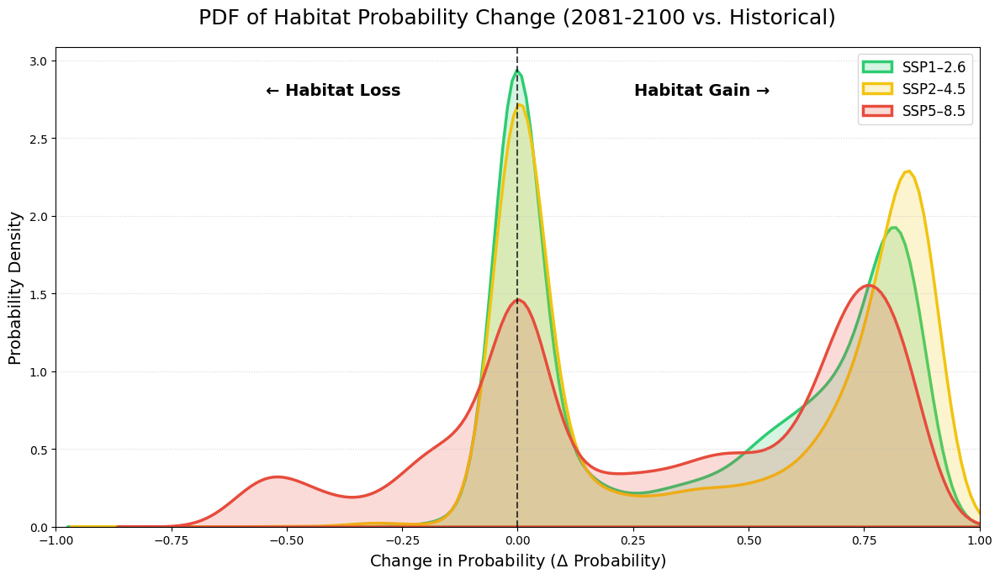

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import geopandas as gpd
from rasterio.features import rasterize

# ==========================================================
# 1. 准备数据与初始化（复用之前的栅格逻辑）
# ==========================================================
all_diff_values_dbb = {}  # 存储每个情景的有效差异值
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb"

for sc in scenarios:
    fname = f"dbb_{sc}_{period}_density_renamed_prediction.csv"
    fpath = os.path.join(output_dir, fname)

    if not os.path.exists(fpath):
        continue

    # 读取并栅格化未来数据
    df_f = pd.read_csv(fpath)
    df_f["lon_c"] = df_f["long"] + delta_long
    df_f["lat_c"] = df_f["lat"]  + delta_lat

    gdf_f = gpd.GeoDataFrame(
        df_f,
        geometry=gpd.points_from_xy(df_f.lon_c, df_f.lat_c),
        crs="EPSG:4326"
    )
    gdf_f = gdf_f[gdf_f.within(park_geom)]

    shapes_f = [
        (geom, value)
        for geom, value in zip(gdf_f.geometry, gdf_f["probability"])
    ]

    raster_future = rasterize(
        shapes_f,
        out_shape=(height, width),
        transform=transform,
        fill=np.nan,
        dtype="float32"
    )

    # 计算差异值（future − historical）
    raster_diff = raster_future - raster_hist

    # 提取非空值
    diff_values = raster_diff.flatten()
    diff_values = diff_values[~np.isnan(diff_values)]

    all_diff_values_dbb[sc_titles[sc]] = diff_values

# ==========================================================
# 2. 绘制 PDF 概率密度曲线
# ==========================================================
plt.figure(figsize=(12, 7))

# 颜色映射
colors = {
    "SSP1–2.6": "#2ecc71",
    "SSP2–4.5": "#f1c40f",
    "SSP5–8.5": "#e74c3c"
}

for sc_name, values in all_diff_values_dbb.items():
    sns.kdeplot(
        values,
        label=sc_name,
        color=colors[sc_name],
        fill=True,
        alpha=0.2,
        linewidth=2.5
    )

# X = 0 参考线
plt.axvline(
    x=0,
    color='black',
    linestyle='--',
    linewidth=1.5,
    alpha=0.7
)

# 图形装饰
plt.title(
    f"PDF of Habitat Probability Change ({period} vs. Historical)",
    fontsize=18,
    pad=20
)
plt.xlabel("Change in Probability ($\\Delta$ Probability)", fontsize=14)
plt.ylabel("Probability Density", fontsize=14)
plt.xlim(-1.0, 1.0)
plt.grid(axis='y', linestyle=':', alpha=0.5)

# Loss / Gain 注释
plt.text(
    -0.4, plt.ylim()[1] * 0.9,
    "← Habitat Loss",
    fontsize=14,
    color="black",
    fontweight='bold',
    ha='center'
)
plt.text(
    0.4, plt.ylim()[1] * 0.9,
    "Habitat Gain →",
    fontsize=14,
    color="black",
    fontweight='bold',
    ha='center'
)

plt.legend(fontsize=12, loc='upper right')
plt.tight_layout()
plt.show()


### 豹子中心移动分析

In [ ]:
import os
import pandas as pd
import geopandas as gpd

# ==========================================================
# 0. 路径设置
# ==========================================================

# 当前情景（已是 DataFrame，带 probability 列）
df_current = df_dbb_clean.copy()  # 确保不修改原数据

# 未来情景预测结果目录
future_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/"

# 输出结果 CSV
output_csv = "/content/drive/MyDrive/虎豹分布_ML/results_test/dbb_重心迁移汇总表.csv"

# ==========================================================
# 1. 定义概率加权重心函数（核心公式）
# ==========================================================

def weighted_centroid(df, x="long", y="lat", w="probability"):
    """
    计算概率加权重心 (x̄, ȳ) = (Σ x_i w_i / Σ w_i , Σ y_i w_i / Σ w_i)
    """
    df = df.dropna(subset=[x, y, w])
    wx = (df[x] * df[w]).sum()
    wy = (df[y] * df[w]).sum()
    wsum = df[w].sum()
    return wx / wsum, wy / wsum

# ==========================================================
# 2. 计算 current 情景重心
# ==========================================================

results = []

cx, cy = weighted_centroid(df_current)

results.append({
    "species": "dbb",
    "scenario": "current",
    "period": "current",
    "centroid_long": cx,
    "centroid_lat": cy
})

# ==========================================================
# 3. 计算未来情景（SSP × period）重心
# ==========================================================

future_files = sorted([
    f for f in os.listdir(future_dir)
    if f.endswith("_prediction.csv")
])

for fname in future_files:
    path = os.path.join(future_dir, fname)
    df = pd.read_csv(path)

    # 确保 probability 列存在
    if "probability" not in df.columns:
        df["probability"] = 1.0

    # 文件名示例：
    # dbb_ssp126_2021-2040_prediction.csv
    parts = fname.replace(".csv", "").split("_")
    scenario = parts[1]        # ssp126 / ssp245 / ssp585
    period   = parts[2]        # 2021-2040 / 2041-2060 ...

    cx, cy = weighted_centroid(df)

    results.append({
        "species": "dbb",
        "scenario": scenario,
        "period": period,
        "centroid_long": cx,
        "centroid_lat": cy
    })

# ==========================================================
# 4. 汇总为 DataFrame，并排序
# ==========================================================

centroid_table_dbb = pd.DataFrame(results)

period_order = [
    "current",
    "2021-2040",
    "2041-2060",
    "2061-2080",
    "2081-2100"
]

centroid_table_dbb["period"] = pd.Categorical(
    centroid_table_dbb["period"],
    categories=period_order,
    ordered=True
)

centroid_table_dbb = centroid_table_dbb.sort_values(
    ["scenario", "period"]
).reset_index(drop=True)

# ==========================================================
# 5. 保存结果
# ==========================================================

centroid_table_dbb.to_csv(output_csv, index=False)

print(f"输出文件：{output_csv}")
print(centroid_table_dbb)

输出文件：/content/drive/MyDrive/虎豹分布_ML/results_test/dbb_重心迁移汇总表.csv
   species scenario     period  centroid_long  centroid_lat
0      dbb      126  2021-2040     130.417257     43.016664
1      dbb      126  2041-2060     130.347892     43.065646
2      dbb      126  2061-2080     130.335073     43.071304
3      dbb      126  2081-2100     130.323288     43.079174
4      dbb      245  2021-2040     130.417957     43.015235
5      dbb      245  2041-2060     130.317413     43.079692
6      dbb      245  2061-2080     130.306200     43.091122
7      dbb      245  2081-2100     130.304481     43.092806
8      dbb      585  2021-2040     130.389838     43.031836
9      dbb      585  2041-2060     130.307135     43.091720
10     dbb      585  2061-2080     130.291551     43.099913
11     dbb      585  2081-2100     130.256819     43.105416
12     dbb  current    current     130.541384     42.896850


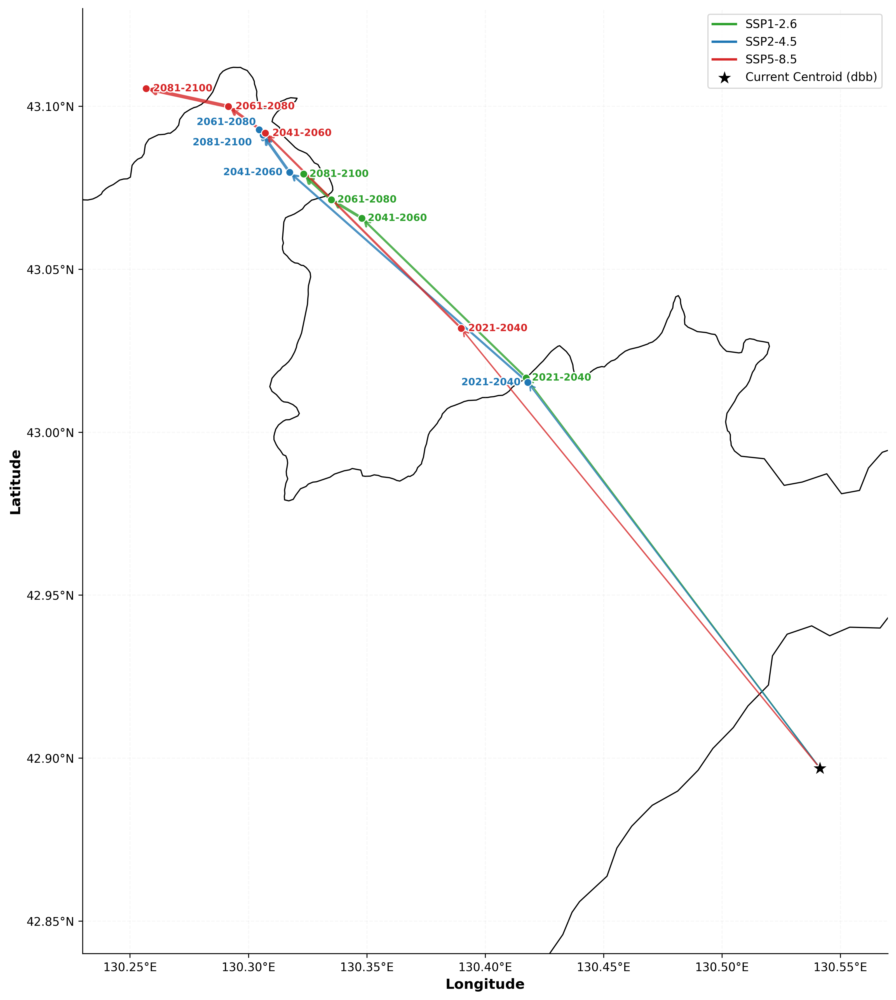

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
from matplotlib.ticker import FormatStrFormatter
import matplotlib.patheffects as PathEffects

# ==========================================================
# 0. 数据构造 (保持一致)
# ==========================================================
data = {
    "species": ["dbb"]*13,
    "scenario": ["126"]*4 + ["245"]*4 + ["585"]*4 + ["current"],
    "period": [
        "2021-2040","2041-2060","2061-2080","2081-2100",
        "2021-2040","2041-2060","2061-2080","2081-2100",
        "2021-2040","2041-2060","2061-2080","2081-2100",
        "current"
    ],
    "centroid_long": [
        130.417257, 130.347892, 130.335073, 130.323288,
        130.417957, 130.317413, 130.306200, 130.304481,
        130.389838, 130.307135, 130.291551, 130.256819,
        130.541384
    ],
    "centroid_lat": [
        43.016664, 43.065646, 43.071304, 43.079174,
        43.015235, 43.079692, 43.091122, 43.092806,
        43.031836, 43.091720, 43.099913, 43.105416,
        42.896850
    ]
}
df = pd.DataFrame(data)

df_current = df[df["scenario"] == "current"].copy()
df_future  = df[df["scenario"] != "current"].copy()
period_order = ["2021-2040","2041-2060","2061-2080","2081-2100"]
df_future.loc[:, "period"] = pd.Categorical(df_future["period"], categories=period_order, ordered=True)

# ==========================================================
# 1. 绘图设置
# ==========================================================
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
hbgy = gpd.read_file("/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp")

fig, ax = plt.subplots(figsize=(11, 12), dpi=300)

hbgy.boundary.plot(ax=ax, color="black", linewidth=1, zorder=1)

# 修改后的偏移策略逻辑：
# 126 (绿): 全部放在右侧 (ha='left', ox=0.003)
# 245 (蓝): 保持左侧 (ha='right')，但缩短 oy 距离到 0.0025
# 585 (红): 保持右侧 (ha='left')
styles = {
    "126": {"color": "#2ca02c", "label": "SSP1-2.6", "ha": 'left',  "va": 'center', "ox": 0.003,  "oy": 0.000},
    "245": {"color": "#1f77b4", "label": "SSP2-4.5", "ha": 'right', "va": 'center', "ox": -0.003, "oy": 0.000},
    "585": {"color": "#d62728", "label": "SSP5-8.5", "ha": 'left',  "va": 'center', "ox": 0.003,  "oy": 0.000},
}

for scen, style in styles.items():
    df_s = df_future[df_future["scenario"] == scen].sort_values("period")
    x_prev, y_prev = df_current.centroid_long.values[0], df_current.centroid_lat.values[0]

    for i, (idx, row) in enumerate(df_s.iterrows()):
        x, y = row.centroid_long, row.centroid_lat

        # 箭头线绘制
        ax.add_patch(FancyArrowPatch((x_prev, y_prev), (x, y), arrowstyle="->,head_width=2.5,head_length=4",
                                     color=style["color"], linewidth=1.2 + i*0.6, alpha=0.8, zorder=3))
        # 散点绘制
        ax.scatter(x, y, color=style["color"], s=45, edgecolors='white', linewidth=0.8, zorder=4)

        current_ox, current_oy = style["ox"], style["oy"]
        current_va = style["va"]

        # 精细化处理蓝色 (SSP2-4.5) 的重叠问题，缩短距离并错开
        if scen == "245":
            if i == 2: # 2061-2080
                current_oy = 0.0025 # 距离缩短，贴近上方点
                current_va = 'bottom'
            if i == 3: # 2081-2100
                current_oy = -0.0025 # 距离缩短，贴近下方点
                current_va = 'top'

        # 绿色 (SSP1-2.6) 统一靠右且紧凑
        if scen == "126":
            current_ox = 0.0025 # 距离缩短，贴近点位

        # 绘制标注文字
        txt = ax.text(x + current_ox, y + current_oy, row.period, fontsize=8.5, fontweight='bold',
                      color=style["color"], ha=style['ha'], va=current_va, zorder=6)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='white')])

        x_prev, y_prev = x, y

    # 图例辅助线
    ax.plot([], [], color=style["color"], linewidth=2, label=style["label"])

# 当前重心绘制
ax.scatter(df_current.centroid_long, df_current.centroid_lat, color="black", s=220, marker="*",
           edgecolors='white', zorder=10, label="Current Centroid (dbb)")

# ==========================================================
# 2. 坐标轴及布局修饰
# ==========================================================
ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f°E'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f°N'))
ax.set_xlabel("Longitude", fontsize=12, fontweight='bold')
ax.set_ylabel("Latitude", fontsize=12, fontweight='bold')
ax.set_xlim(130.23, 130.57); ax.set_ylim(42.84, 43.13)
ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
ax.legend(loc="upper right", frameon=True, framealpha=0.9, edgecolor='lightgray', fontsize=10)
ax.grid(True, linestyle='--', alpha=0.1, zorder=0)

plt.tight_layout()
plt.show()

## 整体绘图结果

### 混淆矩阵-ROC图

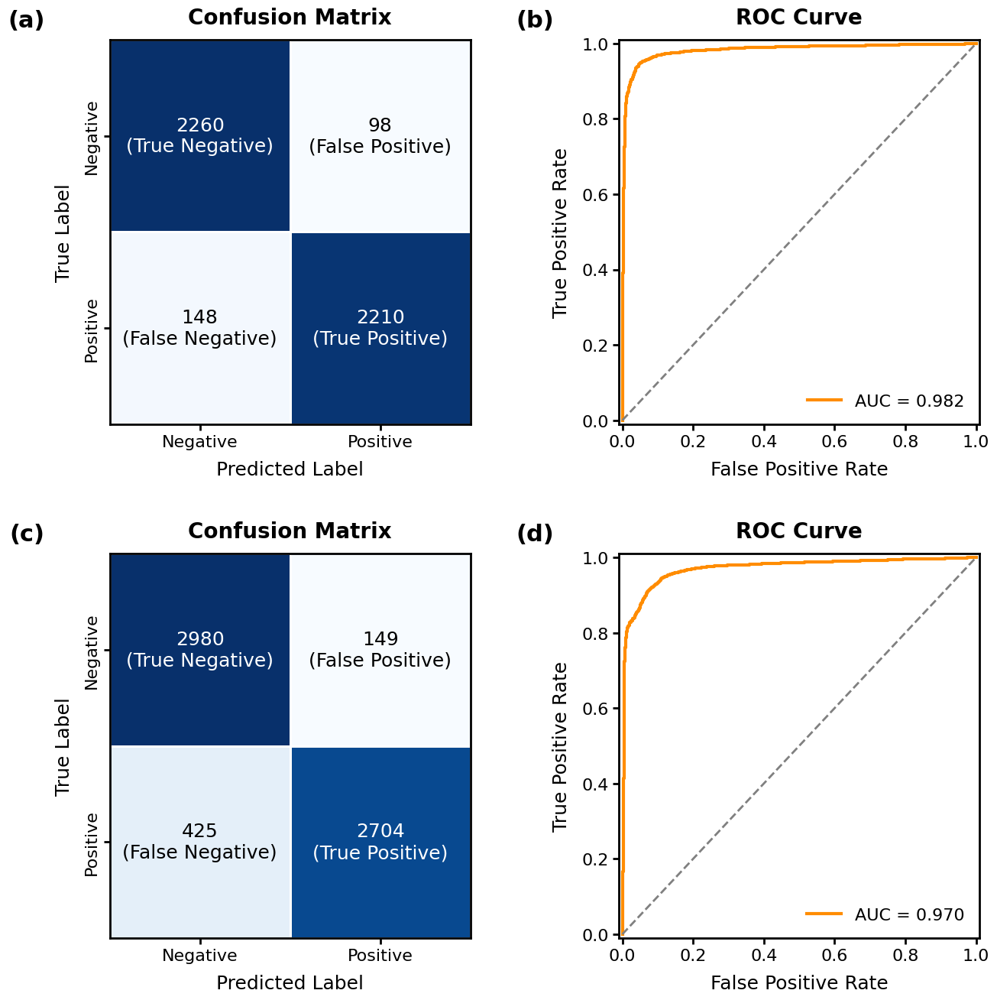

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
import os

# ======================
# 1. 设置全局绘图参数 (确保字体统一)
# ======================
plt.rcParams['font.family'] = 'sans-serif' # 或您指定的字体
# 确保所有刻度向外突出
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.direction'] = 'out'

# 增加列宽：将 figsize 宽度由 12 改为 18，高度由 12 改为 14
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# ---------------------
# 函数：绘制单个混淆矩阵 + ROC
# ---------------------
def plot_cm_roc(ax_cm, ax_roc, y_true, y_pred, y_proba, title_cm, title_roc, tag_cm, tag_roc):
    # 计算数据
    cm = confusion_matrix(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_proba)
    fpr, tpr, _ = roc_curve(y_true, y_proba)

    # --- 混淆矩阵绘制 ---
    annot_colors = [["white", "black"], ["black", "white"]]
    annot_text = [
        [f"{cm[0,0]}\n(True Negative)", f"{cm[0,1]}\n(False Positive)"],
        [f"{cm[1,0]}\n(False Negative)", f"{cm[1,1]}\n(True Positive)"]
    ]

    sns.heatmap(
        cm, annot=annot_text, fmt='',
        cmap='Blues', cbar=False,
        linewidths=1, linecolor='white',
        xticklabels=['Negative', 'Positive'],
        yticklabels=['Negative', 'Positive'],
        ax=ax_cm,
        annot_kws={"size": 18}  # 矩阵内部文字设为 18
    )

    # 设置矩阵内部文字颜色
    for text_obj, color in zip(ax_cm.texts, sum(annot_colors, [])):
        text_obj.set_color(color)

    # 坐标轴刻度与标签 (最小16号)
    ax_cm.tick_params(axis='both', labelsize=16, width=2, length=6)

    # 加粗边框 (2px/2pt)
    for spine in ax_cm.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)

    ax_cm.set_title(title_cm, fontsize=20, fontweight='bold', pad=15)
    ax_cm.set_xlabel("Predicted Label", fontsize=18, labelpad=10)
    ax_cm.set_ylabel("True Label", fontsize=18, labelpad=10)

    # 子图标签 (a) (c)
    ax_cm.text(-0.18, 1.08, tag_cm, transform=ax_cm.transAxes,
               fontsize=22, fontweight='bold', va='top', ha='right')

    # --- ROC 曲线绘制 ---
    ax_roc.plot(fpr, tpr, lw=3, color='darkorange', label=f"AUC = {roc_auc:.3f}")
    ax_roc.plot([0,1],[0,1], linestyle='--', lw=2, color='gray')

    ax_roc.set_xlim([-0.01, 1.01])
    ax_roc.set_ylim([-0.01, 1.01])

    # 坐标轴刻度与标签 (最小16号)
    ax_roc.tick_params(axis='both', labelsize=16, width=2, length=6)

    # 加粗边框 (2px/2pt)
    for spine in ax_roc.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)

    ax_roc.set_xlabel("False Positive Rate", fontsize=18, labelpad=10)
    ax_roc.set_ylabel("True Positive Rate", fontsize=18, labelpad=10)
    ax_roc.set_title(title_roc, fontsize=20, fontweight='bold', pad=15)

    # 子图标签 (b) (d)
    ax_roc.text(-0.18, 1.08, tag_roc, transform=ax_roc.transAxes,
                fontsize=22, fontweight='bold', va='top', ha='right')

    # 图例设置：16号字，且移除外边框 (frameon=False)
    ax_roc.legend(fontsize=16, loc="lower right", frameon=False)
    ax_roc.grid(False)

# ---------------------
# 2. 执行绘图 (假设您的 y_true 等变量已定义)
# ---------------------
# 绘制 Tiger (a, b)
plot_cm_roc(
    axes[0,0], axes[0,1],
    y_true_all_tiger, y_pred_all_tiger, y_proba_all_tiger,
    title_cm="Confusion Matrix",
    title_roc="ROC Curve",
    tag_cm="(a)", tag_roc="(b)"
)

# 绘制 DBB (c, d)
plot_cm_roc(
    axes[1,0], axes[1,1],
    y_true_all_dbb, y_pred_all_dbb, y_proba_all_dbb,
    title_cm="Confusion Matrix",
    title_roc="ROC Curve",
    tag_cm="(c)", tag_roc="(d)"
)

# 调整布局防止重叠
plt.tight_layout(pad=4.0)

# ---------------------
# 3. 输出与保存
# ---------------------
# 确保建立 figure 文件夹
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

save_path = os.path.join(output_dir, "Figure2.jpg")
# 300dpi, jpg格式, 包含所有元素
plt.savefig(save_path, dpi=300, bbox_inches='tight', format='jpg')

plt.show()

### 空间叠置精度图

/tmp/ipykernel_2491/3672651650.py:27: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  gdf = gdf[gdf.within(hbgy.unary_union)]
/tmp/ipykernel_2491/3672651650.py:27: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  gdf = gdf[gdf.within(hbgy.unary_union)]


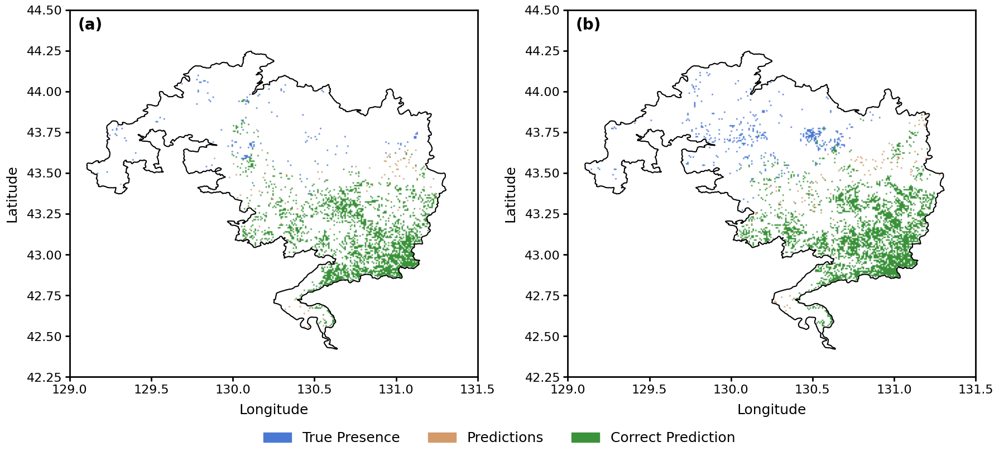

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import os

# ==========================================
# 1. 修改后的绘图函数
# ==========================================
def plot_overlap_raster(
    df, X, y, model_pipeline, hbgy,
    delta_long, delta_lat,
    xmin, xmax, ymin, ymax, resolution,
    ax, panel_label
):
    # --- [前序逻辑保持不变: 数据处理与栅格化] ---
    df = df.copy()
    df["long_corrected"] = df["long"] + delta_long
    df["lat_corrected"]  = df["lat"]  + delta_lat
    model_pipeline.fit(X, y)
    df["prediction"] = model_pipeline.predict(X)

    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df.long_corrected, df.lat_corrected),
        crs="EPSG:4326"
    )
    gdf = gdf[gdf.within(hbgy.unary_union)]

    gdf_occ1 = gdf[gdf.occ == 1]
    gdf_pred1 = gdf[gdf.prediction == 1]
    gdf_correct_pred = gdf[(gdf.occ == 1) & (gdf.prediction == 1)]

    width = int((xmax - xmin) / resolution)
    height = int((ymax - ymin) / resolution)
    transform = from_origin(xmin, ymax, resolution, resolution)

    raster_occ1 = rasterize([(g, 1) for g in gdf_occ1.geometry], out_shape=(height, width), transform=transform, fill=0)
    raster_pred1 = rasterize([(g, 1) for g in gdf_pred1.geometry], out_shape=(height, width), transform=transform, fill=0)
    raster_correct = rasterize([(g, 1) for g in gdf_correct_pred.geometry], out_shape=(height, width), transform=transform, fill=0)

    raster_combined = np.zeros((height, width), dtype=np.uint8)
    raster_combined[raster_correct == 1] = 1
    raster_combined[(raster_occ1 == 1) & (raster_correct == 0)] = 2
    raster_combined[(raster_pred1 == 1) & (raster_correct == 0)] = 3

    # 定义颜色映射
    cmap = ListedColormap(["white", "#3a923a", "#4a79d4", "#d49a6a"])

    # --- [核心修改：视觉样式] ---

    # 绘制边界 (加粗到 1.5 或 2)
    hbgy.boundary.plot(ax=ax, color="black", linewidth=1.5)

    # 绘制栅格
    plot.show(raster_combined, transform=transform, ax=ax, cmap=cmap)

    # 设置轴线加粗为 2pt
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_visible(True)

    # 设置刻度：16号字，粗细2pt，长度6pt，方向向外
    ax.tick_params(axis='both', labelsize=16, width=2, length=6, direction='out')

    # 设置坐标轴标签：18号字
    ax.set_xlabel("Longitude", fontsize=18, labelpad=10)
    ax.set_ylabel("Latitude", fontsize=18, labelpad=10)

    # 设置子图标签 (a)/(b)：20号字，加粗
    ax.text(
        0.02, 0.98,
        panel_label,
        transform=ax.transAxes,
        fontsize=20,
        fontweight="bold",
        va="top",
        ha="left"
    )

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)


# ==========================================
# 2. 外部调用与整体布局控制
# ==========================================
# 创建 1x2 布局，宽度设大一些以容纳坐标轴
fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# 调用函数 (此处以您的实际变量名为准)
plot_overlap_raster(
    df_tiger, X_tiger, y_tiger,
    model_pipeline_tiger, hbgy,           # 模型和地理边界
    delta_long, delta_lat,          # 经纬度修正值
    xmin, xmax, ymin, ymax,         # 绘图范围
    resolution,                     # 分辨率
    axes[0], "(a)"                  # 子图轴对象和标签
)
plot_overlap_raster(
    df_dbb, X_dbb, y_dbb,
    model_pipeline_dbb, hbgy,           # 模型和地理边界
    delta_long, delta_lat,          # 经纬度修正值
    xmin, xmax, ymin, ymax,         # 绘图范围
    resolution,                     # 分辨率
    axes[1], "(b)"                  # 子图轴对象和标签
)

# --- [核心修改：共用图例设计] ---
# 根据代码逻辑创建图例句柄 (Patch)
handles = [
    mpatches.Patch(color='#4a79d4', label='True Presence'),
    mpatches.Patch(color='#d49a6a', label='Predictions'),
    mpatches.Patch(color='#3a923a', label='Correct Prediction')
]

# 在图表下方正中央添加图例
# ncol=3 使其横向排列，frameon=False 移除边框，fontsize=16
fig.legend(
    handles=handles,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.02), # 放置在底部中央
    ncol=3,
    fontsize=18,
    frameon=False
)

# 调整布局，给底部的图例留出空间 (bottom 参数)
plt.tight_layout(rect=[0, 0.08, 1, 1])

# --- [保存输出] ---
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/"
output_path = os.path.join(output_dir, "Figure3")

plt.savefig(output_path, dpi=300, format='jpg', bbox_inches='tight')
plt.show()

### 变化率概率图

<>:133: SyntaxWarning: invalid escape sequence '\D'
<>:133: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_4127/944899644.py:133: SyntaxWarning: invalid escape sequence '\D'
  cbar.set_label("Change in Habitat Probability ($\Delta$ Probability)", fontsize=20, labelpad=10)


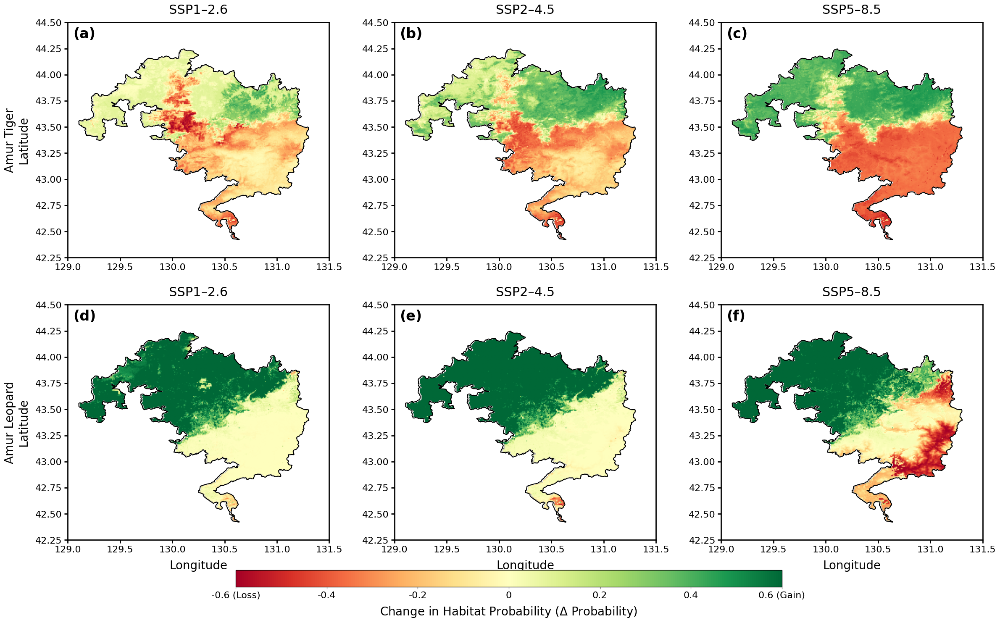

In [ ]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from rasterio.features import rasterize
from rasterio.transform import from_origin

# ==========================================================
# 1. 基础配置
# ==========================================================
period = "2081-2100"
scenarios = ["126", "245", "585"]
sc_titles = {"126": "SSP1–2.6", "245": "SSP2–4.5", "585": "SSP5–8.5"}
species_list = ["tiger", "dbb"]
species_labels = {"tiger": "Amur Tiger", "dbb": "Amur Leopard"}

# 假设路径和数据变量已在环境中
output_dir_tiger = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/tiger/"
output_dir_dbb = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测/dbb/"

# 读取边界
hbgy = gpd.read_file("/content/drive/MyDrive/虎豹分布_ML/animal/hbgy/hbgy.shp").to_crs("EPSG:4326")
park_geom = hbgy.union_all()

# 坐标修正值
delta_long = 129.1666666 - 129.0714729
delta_lat  = 43.49499957 - 43.07656553

# 范围设置
xmin, xmax = 129.0, 131.5
ymin, ymax = 42.25, 44.5
resolution = 0.0083333
width, height = int((xmax - xmin) / resolution), int((ymax - ymin) / resolution)
transform = from_origin(xmin, ymax, resolution, resolution)
extent = (xmin, xmax, ymin, ymax)

# ==========================================================
# 2. 预处理基准期数据 (Rasterize Historical)
# ==========================================================
hist_rasters = {}
for sp in species_list:
    df_name = f"df_{sp}_clean"
    if df_name in globals():
        df_hist = globals()[df_name].copy()
        df_hist["lon_c"], df_hist["lat_c"] = df_hist["long"] + delta_long, df_hist["lat"] + delta_lat
        gdf_hist = gpd.GeoDataFrame(df_hist, geometry=gpd.points_from_xy(df_hist.lon_c, df_hist.lat_c), crs="EPSG:4326")
        gdf_hist = gdf_hist[gdf_hist.within(park_geom)]
        shapes = [(geom, val) for geom, val in zip(gdf_hist.geometry, gdf_hist["probability"])]
        hist_rasters[sp] = rasterize(shapes, out_shape=(height, width), transform=transform, fill=np.nan, dtype="float32")

# ==========================================================
# 3. 绘制 2x3 差异分布图 (Figure 4)
# ==========================================================
# 增加画布尺寸比例，并设置背景为白色 (要求4)
fig = plt.figure(figsize=(26, 16), facecolor='white')

gs = gridspec.GridSpec(
    2, 3,
    figure=fig,
    wspace=0.1, hspace=0.2, # 稍微增加间距避免挤压
    bottom=0.15, top=0.92, left=0.08, right=0.95
)

im_diff = None

for row, sp in enumerate(species_list):
    current_out_dir = output_dir_tiger if sp == "tiger" else output_dir_dbb

    for col, sc in enumerate(scenarios):
        ax = fig.add_subplot(gs[row, col])

        # 读取与数据处理 (保持原逻辑)
        fname = f"{sp}_{sc}_{period}_density_renamed_prediction.csv"
        fpath = os.path.join(current_out_dir, fname)
        if not os.path.exists(fpath): continue

        df_future = pd.read_csv(fpath)
        df_future["lon_c"], df_future["lat_c"] = df_future["long"] + delta_long, df_future["lat"] + delta_lat
        gdf_f = gpd.GeoDataFrame(df_future, geometry=gpd.points_from_xy(df_future.lon_c, df_future.lat_c), crs="EPSG:4326")
        gdf_f = gdf_f[gdf_f.within(park_geom)]
        shapes_f = [(geom, val) for geom, val in zip(gdf_f.geometry, gdf_f["probability"])]
        raster_future = rasterize(shapes_f, out_shape=(height, width), transform=transform, fill=np.nan, dtype="float32")
        raster_diff = raster_future - hist_rasters[sp]

        # 绘图内容
        im_diff = ax.imshow(raster_diff, extent=extent, origin="upper", cmap="RdYlGn", vmin=-0.6, vmax=0.6)
        hbgy.boundary.plot(ax=ax, color="black", linewidth=1.5)

        # --- [样式核心修改区] ---

        # 1. 加粗边框 (要求2: 2pt)
        for spine in ax.spines.values():
            spine.set_linewidth(2)

        # 2. 设置向外的刻度 (要求2: 2pt, direction='out')
        # 设置刻度字体为 16 号 (要求1)
        ax.tick_params(axis='both', which='major', direction='out', width=2, length=6, labelsize=16)

        # 3. 背景设为白底 (要求4)
        ax.set_facecolor("white")

        # 范围与比例
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_aspect('equal') # 地图建议用等比例

        # 4. 坐标轴注记 (要求1 & 3: Y轴无需加粗)
        if row == 1:
            ax.set_xlabel("Longitude", fontsize=20, labelpad=10)

        if col == 0:
            # 移除了 fontweight='bold' (要求3)
            ax.set_ylabel(f"{species_labels[sp]}\nLatitude", fontsize=20, fontweight='normal', labelpad=10)

        # 5. 顶部注记只保留 SSP 情景 (要求3)
        # 统一设置为情景标题
        ax.set_title(sc_titles[sc], fontsize=22, pad=15)

        # 6. 子图编号 (要求1: 对应扩大)
        label_idx = row * 3 + col
        ax.text(0.02, 0.98, f"({chr(97+label_idx)})", transform=ax.transAxes,
                fontsize=24, fontweight="bold", va='top')

# ==========================================================
# 4. 统一图例与保存 (要求5)
# ==========================================================
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.025]) # 调整高度和位置
if im_diff is not None:
    cbar = fig.colorbar(im_diff, cax=cbar_ax, orientation="horizontal")
    # 图例字体对应扩大至 20 (要求1)
    cbar.set_label("Change in Habitat Probability ($\Delta$ Probability)", fontsize=20, labelpad=10)
    cbar.set_ticks([-0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6])
    # 刻度标签设为 16
    cbar.ax.tick_params(labelsize=16)
    cbar.ax.set_xticklabels(['-0.6 (Loss)', '-0.4', '-0.2', '0', '0.2', '0.4', '0.6 (Gain)'])
    # 移除图例边框（如果需要满足之前的全局规范c项，尽管这里是Colorbar）
    cbar.outline.set_linewidth(1)

output_path = os.path.join(output_dir, "Figure4")

plt.savefig(output_path, dpi=300, format='jpg', bbox_inches='tight')

plt.show()

### pdf图

<>:61: SyntaxWarning: invalid escape sequence '\D'
<>:61: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_4127/2707519011.py:61: SyntaxWarning: invalid escape sequence '\D'
  ax.set_xlabel("Change in Probability ($\Delta$ Probability)", fontsize=18, labelpad=12)


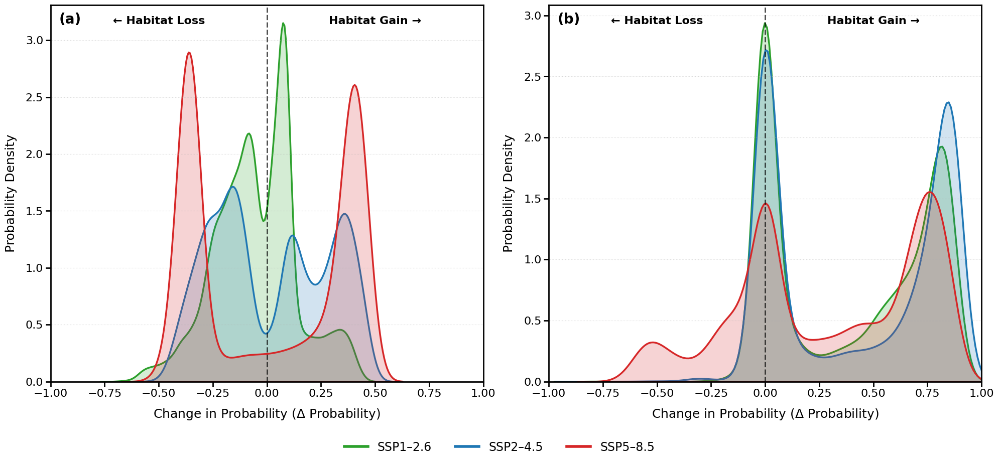

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.lines as mlines

# ==========================================================
# 1. 绘图参数初始化 (完全沿用你的变量)
# ==========================================================
# 颜色映射 (严格对应你的字典键名)
colors = {
    "SSP1–2.6": "#2ca02c",
    "SSP2–4.5": "#1f77b4",
    "SSP5–8.5": "#d62728"
}


# 创建 1x2 子图
fig, axes = plt.subplots(1, 2, figsize=(20, 10), facecolor='white')

# 定义需要绘制的数据集和对应的子图标签
datasets = [
    {"data": all_diff_values_tiger, "label": "(a)", "ax": axes[0]},
    {"data": all_diff_values_dbb,   "label": "(b)", "ax": axes[1]}
]

# ==========================================================
# 2. 循环绘制两个子图
# ==========================================================
for item in datasets:
    ax = item["ax"]
    current_data = item["data"]

    # 绘制 KDE 曲线 (严格沿用你的 sns.kdeplot 逻辑)
    for sc_name, values in current_data.items():
        sns.kdeplot(
            values,
            ax=ax,
            label=sc_name,
            color=colors[sc_name],
            fill=True,
            alpha=0.2,
            linewidth=2.5
        )

    # --- 视觉规范修改 ---

    # 1. 加粗边框和刻度 (要求 2: 2pt)
    for spine in ax.spines.values():
        spine.set_linewidth(2)

    # 2. 向外的 tick (要求 2: 2pt)
    ax.tick_params(axis='both', which='major', direction='out', width=2, length=7, labelsize=16)

    # 3. 参考线与范围
    ax.axvline(x=0, color='black', linestyle='--', linewidth=2, alpha=0.7)
    ax.set_xlim(-1.0, 1.0)
    ax.grid(axis='y', linestyle=':', alpha=0.5)

    # 4. 坐标轴标签 (要求 1: 18号字)
    ax.set_xlabel("Change in Probability ($\Delta$ Probability)", fontsize=18, labelpad=12)
    ax.set_ylabel("Probability Density", fontsize=18, labelpad=12)

    # 5. Loss / Gain 注释 (对应扩大字号)
    curr_ylim = ax.get_ylim()[1]
    ax.text(-0.5, curr_ylim * 0.95, "← Habitat Loss", fontsize=16, color="black", fontweight='bold', ha='center')
    ax.text(0.5, curr_ylim * 0.95, "Habitat Gain →", fontsize=16, color="black", fontweight='bold', ha='center')

    # 6. 子图编号 (要求 1: 20号字)
    ax.text(0.02, 0.98, item["label"], transform=ax.transAxes, fontsize=20, fontweight="bold", va="top")

# ==========================================================
# 3. 统一横向图例与保存 (要求 3 & 4 & 5)
# ==========================================================
# 创建图例句柄 (Patch 或 Line)
legend_handles = [
    mlines.Line2D([], [], color="#2ca02c", lw=4, label='SSP1–2.6'),
    mlines.Line2D([], [], color="#1f77b4", lw=4, label='SSP2–4.5'),
    mlines.Line2D([], [], color="#d62728", lw=4, label='SSP5–8.5')
]

# 横向摆放在下方正中央
fig.legend(
    handles=legend_handles,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.05),
    ncol=3,
    fontsize=17,
    frameon=False
)

# 调整布局留出底部空间
plt.tight_layout(rect=[0, 0.12, 1, 0.98])

# 保存为 Figure5.jpg, 300dpi
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/Figure5.jpg"
plt.savefig(save_path, dpi=300, format='jpg', bbox_inches="tight", facecolor='white')

plt.show()

### 虎豹中心移动图

KeyError: 'scenario'

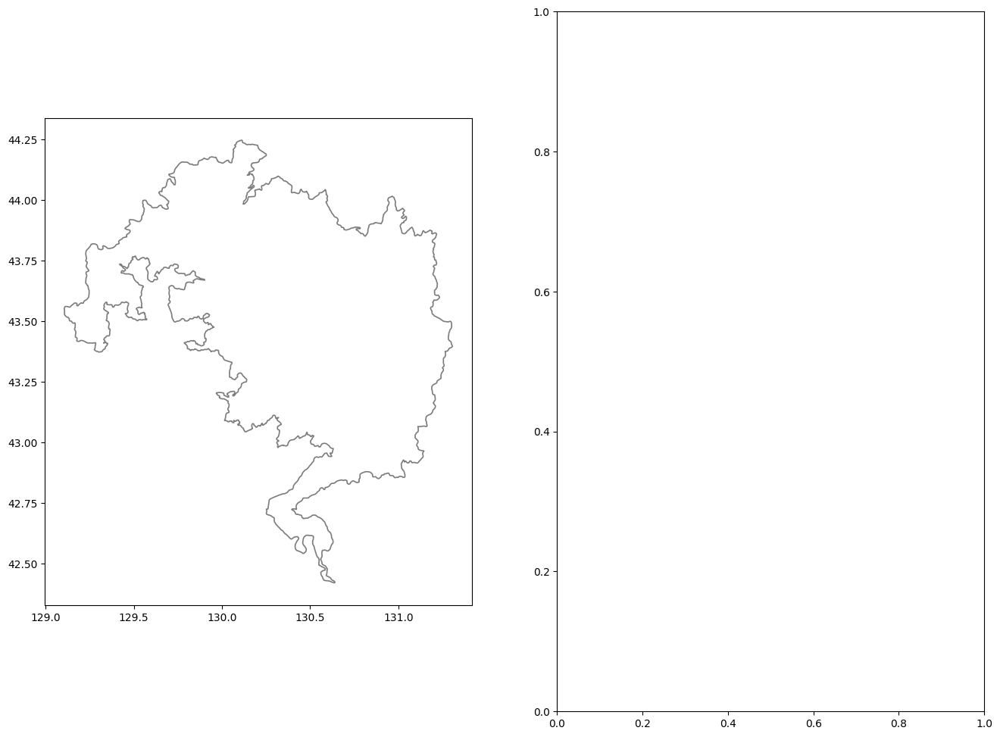

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.patches import FancyArrowPatch
import matplotlib.lines as mlines
from matplotlib.ticker import FormatStrFormatter, MultipleLocator # 导入刻度控制器
import os

# ==========================================================
# 0. 环境与数据准备
# ==========================================================
# 颜色配置
colors = {
    "SSP1-2.6": "#2ca02c",
    "SSP2-4.5": "#1f77b4",
    "SSP5-8.5": "#d62728"
}

# 【关键参数说明】
# 下方的 period_sizes 字典即为控制圆圈大小的数据源
# 在 ax.scatter 中通过参数 s=period_sizes[row.period] 来调用
period_sizes = {"2021-2040": 80, "2041-2060": 140, "2061-2080": 200, "2081-2100": 260}
period_order = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]

def calculate_movement(lon1, lat1, lon2, lat2):
    R = 6371.0
    phi1, phi2 = np.radians(lat1), np.radians(lat2)
    dphi, dlambda = np.radians(lat2 - lat1), np.radians(lon2 - lon1)
    a = np.sin(dphi/2)**2 + np.cos(phi1)*np.cos(phi2)*np.sin(dlambda/2)**2
    dist = 2 * R * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    y = np.sin(dlambda) * np.cos(phi2)
    x = np.cos(phi1) * np.sin(phi2) - np.sin(phi1) * np.cos(phi2) * np.cos(dlambda)
    bearing = (np.degrees(np.arctan2(y, x)) + 360) % 360
    return round(dist, 3), round(bearing, 2)

# ==========================================================
# 1. 绘图函数
# ==========================================================
def plot_migration_fixed(ax, data_df, label, hbgy_obj):
    # --- A. 绘制公园边界 ---
    hbgy_obj.boundary.plot(ax=ax, color="#444444", linewidth=1.2, zorder=1, alpha=0.7)

    df_curr = data_df[data_df["scenario"] == "current"].iloc[0]

    for scen, color in colors.items():
        df_s = data_df[data_df["scenario"] == scen].copy()
        df_s['period'] = pd.Categorical(df_s['period'], categories=period_order, ordered=True)
        df_s = df_s.sort_values('period')

        # 1. 过程虚线
        pts = [(df_curr.centroid_long, df_curr.centroid_lat)] + list(zip(df_s.centroid_long, df_s.centroid_lat))
        for i in range(len(pts)-1):
            ax.plot([pts[i][0], pts[i+1][0]], [pts[i][1], pts[i+1][1]],
                    color=color, linestyle='--', linewidth=2.5, alpha=0.2, zorder=2)

        # 2. 时期圆圈 (参数 s 控制大小)
        for _, row in df_s.iterrows():
            ax.scatter(row.centroid_long, row.centroid_lat, color=color,
                       s=period_sizes[row.period], # 此处 s 即为控制大小的参数
                       edgecolors='white', linewidth=0.8, alpha=0.9, zorder=4)

        # 3. 总趋势箭头
        final_pt = df_s[df_s['period'] == "2081-2100"].iloc[0]
        arrow = FancyArrowPatch((df_curr.centroid_long, df_curr.centroid_lat),
                                (final_pt.centroid_long, final_pt.centroid_lat),
                                arrowstyle='->,head_width=5,head_length=10',
                                color=color, linewidth=4, zorder=5)
        ax.add_patch(arrow)

    # 4. 基准期星号
    ax.scatter(df_curr.centroid_long, df_curr.centroid_lat, color="black", s=500, marker="*",
               edgecolors='white', zorder=10)

    # --- B. 坐标轴与刻度控制 ---
    ax.set_xlim(130.2, 130.58)
    ax.set_ylim(42.82, 43.15)

    # 修改 1：设置 X 轴主刻度(0.1)和次刻度(0.05)
    ax.xaxis.set_major_locator(MultipleLocator(0.1)) # 显示数字的频率
    ax.xaxis.set_minor_locator(MultipleLocator(0.05)) # 仅绘制线条/刻度的频率
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f°E'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f°N'))

    # --- C. 视觉规范 ---
    ax.set_xlabel("Longitude", fontsize=18)
    ax.set_ylabel("Latitude", fontsize=18)

    # 2pt 边框
    for spine in ax.spines.values():
        spine.set_linewidth(2)

    # 修改刻度：同时作用于主次刻度，确保 0.05 的线也能画出来
    ax.tick_params(axis='both', which='both', direction='out', width=2, length=8, labelsize=16)
    ax.grid(True, which='both', linestyle=':', alpha=0.3) # grid 设为 both 以显示 0.05 刻度线

    # 修改 3：子图编号 (a)(b) 放在框框内，位于子图内部
    ax.text(0.02, 0.98, label, transform=ax.transAxes, fontsize=22, fontweight='bold',
            va='top', ha='left', zorder=15)

# ==========================================================
# 2. 生成表格与绘图执行
# ==========================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12), facecolor='white')

# 调用绘图
plot_migration_fixed(ax1, df_tiger, "(a)", hbgy)
plot_migration_fixed(ax2, df_dbb, "(b)", hbgy)

# 自定义图例
legend_elements = [
    mlines.Line2D([], [], color=colors["SSP1-2.6"], lw=4, label='SSP1-2.6'),
    mlines.Line2D([], [], color=colors["SSP2-4.5"], lw=4, label='SSP2-4.5'),
    mlines.Line2D([], [], color=colors["SSP5-8.5"], lw=4, label='SSP5-8.5'),
    mlines.Line2D([], [], color='black', marker='*', linestyle='None', markersize=15, label='Current Baseline'),
    plt.scatter([], [], s=80, color='gray', alpha=0.6, edgecolors='white', label='2021-2040'),
    plt.scatter([], [], s=160, color='gray', alpha=0.6, edgecolors='white', label='2041-2060'),
    plt.scatter([], [], s=260, color='gray', alpha=0.6, edgecolors='white', label='2061-2080'),
    plt.scatter([], [], s=400, color='gray', alpha=0.6, edgecolors='white', label='2081-2100')
]

# 修改 4：调整 bbox_to_anchor 的 y 值(从0.02调至0.08)，使图例靠近横坐标
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, 0.11),
            ncol=4, fontsize=16, frameon=False)

# 调整 tight_layout 的边缘，确保底部紧凑
plt.tight_layout(rect=[0, 0.15, 1, 0.98])
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/Figure6"
plt.savefig(save_path, dpi=300, format='jpg', bbox_inches='tight')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# --- tiger ---
data_tiger = {
    "centroid_long": [130.532924, 130.524578, 130.527945, 130.517413,
                      130.526638, 130.500677, 130.490326, 130.452623,
                      130.528060, 130.501006, 130.378454, 130.318517,
                      130.541384],
    "centroid_lat": [42.855337, 42.914730, 42.924517, 42.924652,
                     42.861643, 42.925837, 42.975530, 43.005655,
                     42.872581, 42.961637, 43.055564, 43.090311,
                     42.896850],
    "scenario": ["126"]*4 + ["245"]*4 + ["585"]*4 + ["current"],
    "period": ["2021-2040","2041-2060","2061-2080","2081-2100"]*3 + ["current"]
}
df_tiger = pd.DataFrame(data_tiger)

# --- dbb ---
data_dbb = {
    "centroid_long": [130.417257, 130.347892, 130.335073, 130.323288,
                      130.417957, 130.317413, 130.306200, 130.304481,
                      130.389838, 130.307135, 130.291551, 130.256819,
                      130.541384],
    "centroid_lat": [43.016664, 43.065646, 43.071304, 43.079174,
                     43.015235, 43.079692, 43.091122, 43.092806,
                     43.031836, 43.091720, 43.099913, 43.105416,
                     42.896850],
    "scenario": ["126"]*4 + ["245"]*4 + ["585"]*4 + ["current"],
    "period": ["2021-2040","2041-2060","2061-2080","2081-2100"]*3 + ["current"]
}
df_dbb = pd.DataFrame(data_dbb)
def calculate_movement(lon1, lat1, lon2, lat2):
    R = 6371.0
    phi1, phi2 = np.radians(lat1), np.radians(lat2)
    dphi = np.radians(lat2 - lat1)
    dlambda = np.radians(lon2 - lon1)

    a = np.sin(dphi/2)**2 + np.cos(phi1)*np.cos(phi2)*np.sin(dlambda/2)**2
    dist = 2 * R * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    y = np.sin(dlambda) * np.cos(phi2)
    x = np.cos(phi1)*np.sin(phi2) - np.sin(phi1)*np.cos(phi2)*np.cos(dlambda)
    bearing = (np.degrees(np.arctan2(y, x)) + 360) % 360

    return dist, bearing
def build_movement_df(data_df, species_name):
    results = []
    period_order = ["2021-2040","2041-2060","2061-2080","2081-2100"]

    df_curr = data_df[data_df["scenario"] == "current"].iloc[0]

    for scen in ["126", "245", "585"]:
        df_s = data_df[data_df["scenario"] == scen].copy()
        df_s["period"] = pd.Categorical(df_s["period"], categories=period_order, ordered=True)
        df_s = df_s.sort_values("period")

        prev_lon, prev_lat = df_curr.centroid_long, df_curr.centroid_lat
        prev_period = "current"

        for _, row in df_s.iterrows():
            dist, bearing = calculate_movement(
                prev_lon, prev_lat,
                row.centroid_long, row.centroid_lat
            )

            results.append({
                "species": species_name,
                "scenario": scen,
                "from_period": prev_period,
                "to_period": row.period,
                "distance_km": round(dist, 4),
                "bearing_deg": round(bearing, 2)
            })

            prev_lon, prev_lat = row.centroid_long, row.centroid_lat
            prev_period = row.period

    return pd.DataFrame(results)
df_move_tiger = build_movement_df(df_tiger, "tiger")
df_move_dbb   = build_movement_df(df_dbb, "dbb")

df_movement = pd.concat([df_move_tiger, df_move_dbb], ignore_index=True)

df_movement


,species,scenario,from_period,to_period,distance_km,bearing_deg
0,tiger,126,current,2021-2040,4.6672,188.50
1,tiger,126,2021-2040,2041-2060,6.6391,354.12
2,tiger,126,2041-2060,2061-2080,1.1223,14.14
3,tiger,126,2061-2080,2081-2100,0.8577,271.01
4,tiger,245,current,2021-2040,4.0951,197.07
5,tiger,245,2021-2040,2041-2060,7.4448,343.51
6,tiger,245,2041-2060,2061-2080,5.5895,351.33
7,tiger,245,2061-2080,2081-2100,4.5414,317.54
8,tiger,585,current,2021-2040,2.9088,201.92
9,tiger,585,2021-2040,2041-2060,10.1447,347.47


### SHP分析

/tmp/ipykernel_2491/1820066489.py:47: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(
/tmp/ipykernel_2491/1820066489.py:123: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


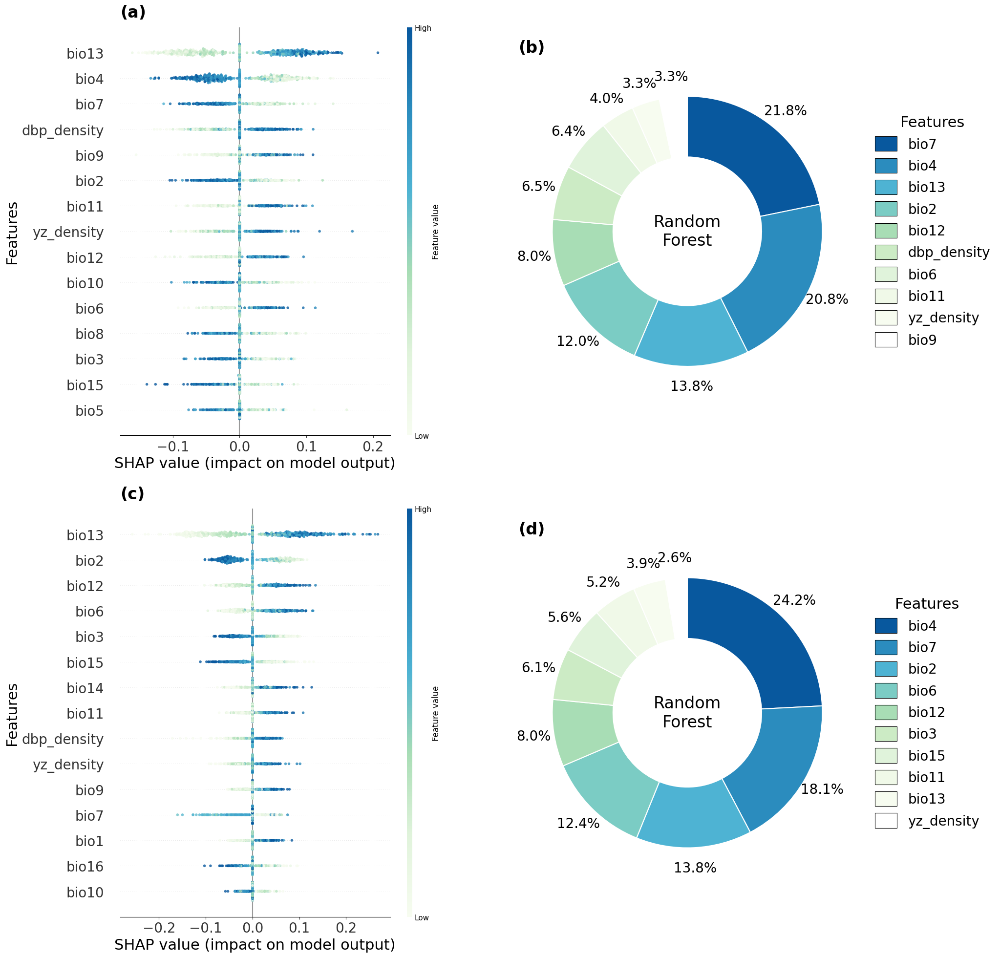

图像已成功保存至: /content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/Figure8.jpg


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap
from matplotlib.colors import LinearSegmentedColormap

# -----------------------------
# 0. 全局设置（整体再放大一档）
# -----------------------------
plt.rcParams.update({
    'font.size': 20,
    'font.weight': 'normal'
})

save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/"
os.makedirs(save_path, exist_ok=True)

def clean_feature_name(name):
    if name == 'hm.asc': return 'human activities'
    if 'bio_' in name: return f"bio{name.split('bio_')[1].split('_')[0]}"
    return name

# -----------------------------
# 1. 画布
# -----------------------------
fig, axes = plt.subplots(2, 2, figsize=(22, 20))

custom_colors = ['#f7fcf0', '#e0f3db', '#a8ddb5',
                 '#4eb3d3', '#2b8cbe', '#08589e']
cmap_custom = LinearSegmentedColormap.from_list("custom_blue_green", custom_colors)

def set_sub_title(ax, label):
    ax.set_title(label, loc='left', fontsize=24, fontweight='bold', pad=15)

# ==========================================================
# 第一行：Tiger
# ==========================================================

# --- (a) SHAP ---
ax1 = axes[0,0]

X_display_tiger = X_sample_tiger.copy()
X_display_tiger.columns = [clean_feature_name(c) for c in X_display_tiger.columns]

plt.sca(ax1)
shap.summary_plot(
    shap_values_tiger,
    X_display_tiger,
    show=False,
    cmap=cmap_custom,
    plot_type="dot",
    alpha=0.8,
    max_display=15,
    plot_size=None
)

set_sub_title(ax1, "(a)")
ax1.set_ylabel("Features", fontsize=22)
ax1.set_xlabel("SHAP value (impact on model output)", fontsize=22)
ax1.tick_params(labelsize=20)

# --- (b) RF ---
ax2 = axes[0,1]

if 'rf' in stacking_model_tiger.named_estimators_:
    importance_tiger = stacking_model_tiger.named_estimators_['rf'].feature_importances_

    idx_tiger = np.argsort(importance_tiger)[::-1][:10]
    vals_tiger = importance_tiger[idx_tiger]
    labels_tiger = [clean_feature_name(X_tiger.columns[i]) for i in idx_tiger]

    colors_hex = ['#08589e', '#2b8cbe', '#4eb3d3', '#7bccc4', '#a8ddb5',
                  '#ccebc5', '#e0f3db', '#f0f9e8', '#f7fcf0', '#ffffff']

    wedges_tiger, _, autotexts_tiger = ax2.pie(
        vals_tiger,
        autopct='%1.1f%%',
        startangle=90,
        counterclock=False,
        colors=colors_hex[:len(vals_tiger)],
        pctdistance=1.15,
        wedgeprops=dict(width=0.45, edgecolor='white', linewidth=1.5)
    )

    for txt in autotexts_tiger:
        txt.set_fontsize(20)

    ax2.text(0, 0, "Random\nForest", ha='center', va='center', fontsize=24)

    leg_tiger = ax2.legend(
        wedges_tiger, labels_tiger,
        title="Features",
        title_fontproperties={'size': 22},
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        frameon=False,
        fontsize=20,
        handlelength=1.6,
        handleheight=1.3,
        labelspacing=0.5,
        borderpad=0.4
    )

    for patch in leg_tiger.get_patches():
        patch.set_edgecolor('black')
        patch.set_linewidth(0.8)

    set_sub_title(ax2, "(b)")
    ax2.set_aspect('equal')

# ==========================================================
# 第二行：DBB
# ==========================================================

# --- (c) SHAP ---
ax3 = axes[1,0]

X_display_dbb = X_sample_dbb.copy()
X_display_dbb.columns = [clean_feature_name(c) for c in X_display_dbb.columns]

plt.sca(ax3)
shap.summary_plot(
    shap_values_dbb,
    X_display_dbb,
    show=False,
    cmap=cmap_custom,
    plot_type="dot",
    alpha=0.8,
    max_display=15,
    plot_size=None
)

set_sub_title(ax3, "(c)")
ax3.set_ylabel("Features", fontsize=22)
ax3.set_xlabel("SHAP value (impact on model output)", fontsize=22)
ax3.tick_params(labelsize=20)

# --- (d) RF ---
ax4 = axes[1,1]

if 'rf' in stacking_model_dbb.named_estimators_:
    importance_dbb = stacking_model_dbb.named_estimators_['rf'].feature_importances_

    idx_dbb = np.argsort(importance_dbb)[::-1][:10]
    vals_dbb = importance_dbb[idx_dbb]
    labels_dbb = [clean_feature_name(X_dbb.columns[i]) for i in idx_dbb]

    wedges_dbb, _, autotexts_dbb = ax4.pie(
        vals_dbb,
        autopct='%1.1f%%',
        startangle=90,
        counterclock=False,
        colors=colors_hex[:len(vals_dbb)],
        pctdistance=1.15,
        wedgeprops=dict(width=0.45, edgecolor='white', linewidth=1.5)
    )

    for txt in autotexts_dbb:
        txt.set_fontsize(20)

    ax4.text(0, 0, "Random\nForest", ha='center', va='center', fontsize=24)

    leg_dbb = ax4.legend(
        wedges_dbb, labels_dbb,
        title="Features",
        title_fontproperties={'size': 22},
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        frameon=False,
        fontsize=20,
        handlelength=1.6,
        handleheight=1.3,
        labelspacing=0.5,
        borderpad=0.4
    )

    for patch in leg_dbb.get_patches():
        patch.set_edgecolor('black')
        patch.set_linewidth(0.8)

    set_sub_title(ax4, "(d)")
    ax4.set_aspect('equal')

# -----------------------------
# 5. 布局（同步微调避免拥挤）
# -----------------------------
plt.tight_layout(rect=[0, 0, 0.95, 1])

plt.subplots_adjust(
    wspace=0.18,
    hspace=0.18
)

# -----------------------------
# 6. 保存
# -----------------------------
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/Figure8"
plt.savefig(save_path, dpi=300, format='jpg', bbox_inches="tight")

plt.show()
print(f"图像已成功保存至: {full_save_path}")


## 附录内容制作

### 猎物中心移动图（效果一般）

In [ ]:
import os
import rasterio
import numpy as np

# 根目录
base_dir = "/content/drive/MyDrive/虎豹分布_ML/animal/density"

# 遍历 animal 文件夹
for animal in os.listdir(base_dir):
    animal_path = os.path.join(base_dir, animal)
    if not os.path.isdir(animal_path):
        continue

    # 遍历该动物下的 tiff 文件
    for fname in os.listdir(animal_path):
        if not fname.endswith(".tif"):
            continue

        # 解析文件名
        # 格式: (animal)-(scenario)-(time)-mean.tif
        try:
            parts = fname.replace(".tif", "").split("-")
            if len(parts) < 4:
                continue
            file_animal = parts[0]
            scenario = parts[1]
            time = "-".join(parts[2:-1])  # 处理像 2081-2100 这样的时间段
        except:
            continue

        # 完整文件路径
        tif_path = os.path.join(animal_path, fname)

        # 打开 tif
        with rasterio.open(tif_path) as src:
            data = src.read(1).astype(float)  # 栅格值
            mask = data != src.nodata         # 先排除 nodata
            data[data == -9999] = np.nan      # 再排除 -9999
            valid_mask = mask & (~np.isnan(data))

            if np.sum(valid_mask) == 0:
                print(f"{fname} 全是无效值，跳过")
                continue

            # 获取每个栅格中心坐标
            nrows, ncols = data.shape
            xs = np.zeros((nrows, ncols))
            ys = np.zeros((nrows, ncols))

            for row in range(nrows):
                for col in range(ncols):
                    x, y = src.xy(row, col)
                    xs[row, col] = x
                    ys[row, col] = y

            # flatten
            xs_flat = xs[valid_mask]
            ys_flat = ys[valid_mask]
            w_flat = data[valid_mask]

            # 计算重心
            X_bar = np.sum(xs_flat * w_flat) / np.sum(w_flat)
            Y_bar = np.sum(ys_flat * w_flat) / np.sum(w_flat)

            # 打印结果
            print(f"{file_animal}-{scenario}-{time}: X̄={X_bar:.4f}, Ȳ={Y_bar:.4f}")


dbp-126-2021-2040: X̄=130.4067, Ȳ=43.4760
dbp-126-2041-2060: X̄=130.4086, Ȳ=43.4770
dbp-126-2061-2080: X̄=130.4087, Ȳ=43.4771
dbp-126-2081-2100: X̄=130.4063, Ȳ=43.4761
dbp-245-2021-2040: X̄=130.4068, Ȳ=43.4764
dbp-245-2041-2060: X̄=130.4079, Ȳ=43.4765
dbp-245-2061-2080: X̄=130.4075, Ȳ=43.4760
dbp-245-2081-2100: X̄=130.4075, Ȳ=43.4771
dbp-585-2021-2040: X̄=130.4084, Ȳ=43.4764
dbp-585-2041-2060: X̄=130.4084, Ȳ=43.4770
dbp-585-2081-2100: X̄=130.4082, Ȳ=43.4773
dbp-585-2061-2080: X̄=130.4082, Ȳ=43.4768
mhl-126-2021-2040: X̄=130.4953, Ȳ=43.3606
mhl-126-2041-2060: X̄=130.4989, Ȳ=43.3624
mhl-126-2061-2080: X̄=130.4978, Ȳ=43.3619
mhl-126-2081-2100: X̄=130.4942, Ȳ=43.3605
mhl-245-2021-2040: X̄=130.4956, Ȳ=43.3608
mhl-245-2041-2060: X̄=130.4951, Ȳ=43.3605
mhl-245-2081-2100: X̄=130.4951, Ȳ=43.3615
mhl-245-2061-2080: X̄=130.4977, Ȳ=43.3607
mhl-585-2021-2040: X̄=130.4995, Ȳ=43.3616
mhl-585-2041-2060: X̄=130.5003, Ȳ=43.3620
mhl-585-2061-2080: X̄=130.4980, Ȳ=43.3623
mhl-585-2081-2100: X̄=130.4984, Ȳ=

In [ ]:
import os
import rasterio
import numpy as np

# 文件夹路径
base_dir = "/content/drive/MyDrive/虎豹分布_ML/animal/history"

# delta 修正
delta_long = 129.1666666 - 129.0714729
delta_lat  = 43.49499957 - 43.07656553

# 要处理的动物
animals = ["mhl", "yz", "dbp"]

for animal in animals:
    # 构建文件路径
    asc_path = os.path.join(base_dir, f"{animal}_density.asc")

    if not os.path.exists(asc_path):
        print(f"{asc_path} 不存在，跳过")
        continue

    # 读取栅格
    with rasterio.open(asc_path) as src:
        data = src.read(1).astype(float)
        # 删除 -9999
        data[data == -9999] = np.nan
        valid_mask = ~np.isnan(data)

        if np.sum(valid_mask) == 0:
            print(f"{animal}_density 全是无效值，跳过")
            continue

        nrows, ncols = data.shape
        xs = np.zeros((nrows, ncols))
        ys = np.zeros((nrows, ncols))

        # 计算每个栅格的原始经纬度
        for row in range(nrows):
            for col in range(ncols):
                x, y = src.xy(row, col)
                xs[row, col] = x + delta_long  # 经度加 delta
                ys[row, col] = y + delta_lat   # 纬度加 delta

        # flatten
        xs_flat = xs[valid_mask]
        ys_flat = ys[valid_mask]
        w_flat = data[valid_mask]

        # 计算重心
        X_bar = np.sum(xs_flat * w_flat) / np.sum(w_flat)
        Y_bar = np.sum(ys_flat * w_flat) / np.sum(w_flat)

        # 打印结果
        print(f"{animal}_density: X̄={X_bar:.6f}, Ȳ={Y_bar:.6f}")


mhl_density: X̄=130.484506, Ȳ=43.360626
yz_density: X̄=130.404333, Ȳ=43.468705
dbp_density: X̄=130.401826, Ȳ=43.473695


Success! Image saved to: /content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/Figure10.jpg


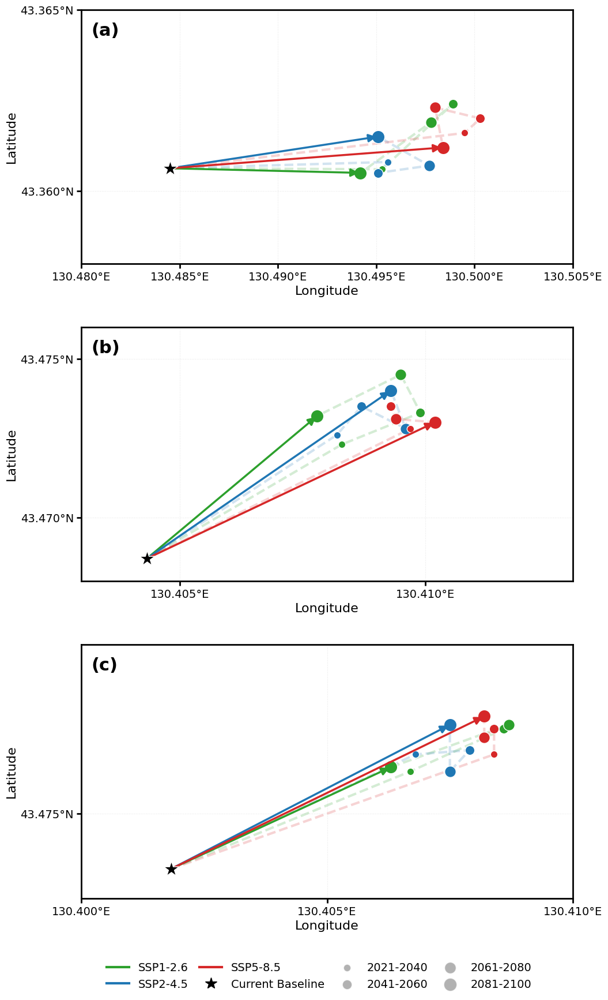

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.patches import FancyArrowPatch
from matplotlib.ticker import FormatStrFormatter, MultipleLocator
import os

# ==========================================================
# 0. 数据解析与构造
# ==========================================================
def create_df(species_prefix, current_coords, future_data):
    rows = []
    rows.append({"species": species_prefix, "scenario": "current", "period": "current", "long": current_coords[0], "lat": current_coords[1]})
    for key, coords in future_data.items():
        parts = key.split('-')
        rows.append({"species": species_prefix, "scenario": parts[1], "period": f"{parts[2]}-{parts[3]}", "long": coords[0], "lat": coords[1]})
    return pd.DataFrame(rows)

# 数据输入
mhl_data = {"mhl-126-2021-2040": (130.4953, 43.3606), "mhl-126-2041-2060": (130.4989, 43.3624), "mhl-126-2061-2080": (130.4978, 43.3619), "mhl-126-2081-2100": (130.4942, 43.3605), "mhl-245-2021-2040": (130.4956, 43.3608), "mhl-245-2041-2060": (130.4951, 43.3605), "mhl-245-2061-2080": (130.4977, 43.3607), "mhl-245-2081-2100": (130.4951, 43.3615), "mhl-585-2021-2040": (130.4995, 43.3616), "mhl-585-2041-2060": (130.5003, 43.3620), "mhl-585-2061-2080": (130.4980, 43.3623), "mhl-585-2081-2100": (130.4984, 43.3612)}
yz_data = {"yz-126-2021-2040": (130.4083, 43.4723), "yz-126-2041-2060": (130.4099, 43.4733), "yz-126-2061-2080": (130.4095, 43.4745), "yz-126-2081-2100": (130.4078, 43.4732), "yz-245-2021-2040": (130.4082, 43.4726), "yz-245-2041-2060": (130.4087, 43.4735), "yz-245-2061-2080": (130.4096, 43.4728), "yz-245-2081-2100": (130.4093, 43.4740), "yz-585-2021-2040": (130.4097, 43.4728), "yz-585-2061-2080": (130.4094, 43.4731), "yz-585-2041-2060": (130.4093, 43.4735), "yz-585-2081-2100": (130.4102, 43.4730)}
dbp_data = {"dbp-126-2021-2040": (130.4067, 43.4760), "dbp-126-2041-2060": (130.4086, 43.4770), "dbp-126-2061-2080": (130.4087, 43.4771), "dbp-126-2081-2100": (130.4063, 43.4761), "dbp-245-2021-2040": (130.4068, 43.4764), "dbp-245-2041-2060": (130.4079, 43.4765), "dbp-245-2061-2080": (130.4075, 43.4760), "dbp-245-2081-2100": (130.4075, 43.4771), "dbp-585-2021-2040": (130.4084, 43.4764), "dbp-585-2041-2060": (130.4084, 43.4770), "dbp-585-2061-2080": (130.4082, 43.4768), "dbp-585-2081-2100": (130.4082, 43.4773)}

df_mhl = create_df("mhl", (130.484506, 43.360626), mhl_data)
df_yz = create_df("yz", (130.404333, 43.468705), yz_data)
df_dbp = create_df("dbp", (130.401826, 43.473695), dbp_data)

# 全局颜色定义，确保图例与绘图一致
colors_map = {"126": "#2ca02c", "245": "#1f77b4", "585": "#d62728"}

# ==========================================================
# 1. 核心绘图函数
# ==========================================================
def plot_migration_v2(ax, data_df, panel_label, custom_xlim, custom_ylim):
    # 如果你有hbgy变量，请取消下方注释
    # if 'hbgy' in globals():
    #     hbgy.boundary.plot(ax=ax, color="#CCCCCC", linewidth=1, zorder=1)

    df_curr = data_df[data_df["scenario"] == "current"]
    df_fut = data_df[data_df["scenario"] != "current"].copy()
    period_order = ["2021-2040","2041-2060","2061-2080","2081-2100"]
    period_sizes = [80, 140, 200, 260]

    df_fut["period"] = pd.Categorical(df_fut["period"], categories=period_order, ordered=True)

    curr_x, curr_y = df_curr.long.values[0], df_curr.lat.values[0]

    for scen in ["126", "245", "585"]:
        df_s = df_fut[df_fut["scenario"] == scen].sort_values("period")
        color = colors_map[scen]

        # A. 绘制过程线
        pts_x = [curr_x] + df_s.long.tolist()
        pts_y = [curr_y] + df_s.lat.tolist()
        ax.plot(pts_x, pts_y, color=color, linestyle='--', linewidth=3, alpha=0.2, zorder=2)

        # B. 绘制时期点
        for i, (_, row) in enumerate(df_s.iterrows()):
            ax.scatter(row.long, row.lat, color=color, s=period_sizes[i],
                        edgecolors='white', linewidth=1, zorder=5)

        # C. 绘制总趋势箭头
        final_row = df_s.iloc[-1]
        ax.add_patch(FancyArrowPatch((curr_x, curr_y), (final_row.long, final_row.lat),
                                     arrowstyle='-|>,head_width=4,head_length=8',
                                     color=color, linewidth=2.5, alpha=1.0, zorder=6))

    # 基准期五角星
    ax.scatter(curr_x, curr_y, color="black", s=400, marker="*", edgecolors='white', zorder=10)

    # 格式化
    ax.set_xlim(custom_xlim)
    ax.set_ylim(custom_ylim)
    ax.xaxis.set_major_locator(MultipleLocator(0.005))
    ax.yaxis.set_major_locator(MultipleLocator(0.005))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.3f°E'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f°N'))

    ax.tick_params(axis='both', which='major', direction='out', length=6, width=2, labelsize=14)
    for spine in ax.spines.values():
        spine.set_linewidth(2)

    ax.set_xlabel("Longitude", fontsize=16)
    ax.set_ylabel("Latitude", fontsize=16)
    ax.text(0.02, 0.95, panel_label, transform=ax.transAxes, fontsize=22, fontweight='bold', va='top')
    ax.grid(True, linestyle=':', alpha=0.3, zorder=0)

# ==========================================================
# 2. 运行绘图并保存
# ==========================================================
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']

fig, axes = plt.subplots(3, 1, figsize=(11, 22))

# 绘图
plot_migration_v2(axes[0], df_mhl, "(a)", (130.480, 130.505), (43.358, 43.365))
plot_migration_v2(axes[1], df_yz,  "(b)", (130.403, 130.413), (43.468, 43.476))
plot_migration_v2(axes[2], df_dbp, "(c)", (130.400, 130.410), (43.473, 43.479))

# 调整子图间距，为底部预留 15% 的空间放图例
plt.subplots_adjust(hspace=0.25, bottom=0.18)

# 自定义图例元素
legend_elements = [
    mlines.Line2D([], [], color=colors_map["126"], lw=3, label='SSP1-2.6'),
    mlines.Line2D([], [], color=colors_map["245"], lw=3, label='SSP2-4.5'),
    mlines.Line2D([], [], color=colors_map["585"], lw=3, label='SSP5-8.5'),
    mlines.Line2D([], [], color='black', marker='*', linestyle='None', markersize=15, label='Current Baseline'),
    plt.scatter([], [], s=80, color='gray', alpha=0.6, edgecolors='white', label='2021-2040'),
    plt.scatter([], [], s=140, color='gray', alpha=0.6, edgecolors='white', label='2041-2060'),
    plt.scatter([], [], s=200, color='gray', alpha=0.6, edgecolors='white', label='2061-2080'),
    plt.scatter([], [], s=260, color='gray', alpha=0.6, edgecolors='white', label='2081-2100')
]

# 放置图例：注意 bbox_to_anchor 设为 (0.5, 0.05) 位于画布最下方
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, 0.1),
           ncol=4, fontsize=14, frameon=False, columnspacing=1.0)

# 保存路径处理
save_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
save_path = os.path.join(save_dir, "Figure10.jpg")

plt.savefig(save_path, dpi=300, format='jpg', bbox_inches='tight')
print(f"Success! Image saved to: {save_path}")

plt.show()

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
from matplotlib.ticker import FormatStrFormatter, MultipleLocator
from matplotlib.lines import Line2D
import os

# ==========================================================
# 0. 数据解析与构造 (保持原逻辑)
# ==========================================================
def create_df(species_prefix, current_coords, future_data):
    rows = []
    rows.append({"species": species_prefix, "scenario": "current", "period": "current", "long": current_coords[0], "lat": current_coords[1]})
    for key, coords in future_data.items():
        parts = key.split('-')
        rows.append({"species": species_prefix, "scenario": parts[1], "period": f"{parts[2]}-{parts[3]}", "long": coords[0], "lat": coords[1]})
    return pd.DataFrame(rows)

# 数据输入
mhl_data = {"mhl-126-2021-2040": (130.4953, 43.3606), "mhl-126-2041-2060": (130.4989, 43.3624), "mhl-126-2061-2080": (130.4978, 43.3619), "mhl-126-2081-2100": (130.4942, 43.3605), "mhl-245-2021-2040": (130.4956, 43.3608), "mhl-245-2041-2060": (130.4951, 43.3605), "mhl-245-2061-2080": (130.4977, 43.3607), "mhl-245-2081-2100": (130.4951, 43.3615), "mhl-585-2021-2040": (130.4995, 43.3616), "mhl-585-2041-2060": (130.5003, 43.3620), "mhl-585-2061-2080": (130.4980, 43.3623), "mhl-585-2081-2100": (130.4984, 43.3612)}
yz_data = {"yz-126-2021-2040": (130.4083, 43.4723), "yz-126-2041-2060": (130.4099, 43.4733), "yz-126-2061-2080": (130.4095, 43.4745), "yz-126-2081-2100": (130.4078, 43.4732), "yz-245-2021-2040": (130.4082, 43.4726), "yz-245-2041-2060": (130.4087, 43.4735), "yz-245-2061-2080": (130.4096, 43.4728), "yz-245-2081-2100": (130.4093, 43.4740), "yz-585-2021-2040": (130.4097, 43.4728), "yz-585-2061-2080": (130.4094, 43.4731), "yz-585-2041-2060": (130.4093, 43.4735), "yz-585-2081-2100": (130.4102, 43.4730)}
dbp_data = {"dbp-126-2021-2040": (130.4067, 43.4760), "dbp-126-2041-2060": (130.4086, 43.4770), "dbp-126-2061-2080": (130.4087, 43.4771), "dbp-126-2081-2100": (130.4063, 43.4761), "dbp-245-2021-2040": (130.4068, 43.4764), "dbp-245-2041-2060": (130.4079, 43.4765), "dbp-245-2061-2080": (130.4075, 43.4760), "dbp-245-2081-2100": (130.4075, 43.4771), "dbp-585-2021-2040": (130.4084, 43.4764), "dbp-585-2041-2060": (130.4084, 43.4770), "dbp-585-2061-2080": (130.4082, 43.4768), "dbp-585-2081-2100": (130.4082, 43.4773)}

df_mhl = create_df("mhl", (130.484506, 43.360626), mhl_data)
df_yz = create_df("yz", (130.404333, 43.468705), yz_data)
df_dbp = create_df("dbp", (130.401826, 43.473695), dbp_data)

# ==========================================================
# 1. 核心绘图函数
# ==========================================================
def plot_migration_v2(ax, data_df, panel_label, custom_xlim, custom_ylim):
    # 绘制背景边界
    if hbgy is not None:
        hbgy.boundary.plot(ax=ax, color="#CCCCCC", linewidth=1, zorder=1)

    df_curr = data_df[data_df["scenario"] == "current"]
    df_fut = data_df[data_df["scenario"] != "current"].copy()
    period_order = ["2021-2040","2041-2060","2061-2080","2081-2100"]
    period_sizes = [80, 140, 200, 260] # 用于区分时期的圆圈大小

    df_fut["period"] = pd.Categorical(df_fut["period"], categories=period_order, ordered=True)
    colors = {"126": "#2ca02c", "245": "#1f77b4", "585": "#d62728"}

    curr_x, curr_y = df_curr.long.values[0], df_curr.lat.values[0]

    for scen in ["126", "245", "585"]:
        df_s = df_fut[df_fut["scenario"] == scen].sort_values("period")
        color = colors[scen]

        # A. 绘制过程线 (虚线, 加粗, 透明度20%)
        pts_x = [curr_x] + df_s.long.tolist()
        pts_y = [curr_y] + df_s.lat.tolist()
        ax.plot(pts_x, pts_y, color=color, linestyle='--', linewidth=3, alpha=0.2, zorder=2)

        # B. 绘制时期符号 (大小随时间增加)
        for i, (_, row) in enumerate(df_s.iterrows()):
            ax.scatter(row.long, row.lat, color=color, s=period_sizes[i],
                       edgecolors='white', linewidth=1, zorder=5)

        # C. 绘制首尾总趋势箭头 (实线, 最明显)
        final_row = df_s.iloc[-1]
        ax.add_patch(FancyArrowPatch((curr_x, curr_y), (final_row.long, final_row.lat),
                                     arrowstyle='-|>,head_width=4,head_length=8',
                                     color=color, linewidth=2.5, alpha=1.0, zorder=6))

    # 绘制基准期重心 (五角星)
    ax.scatter(curr_x, curr_y, color="black", s=400, marker="*", edgecolors='white', zorder=10)

    # 坐标轴格式化
    ax.set_xlim(custom_xlim)
    ax.set_ylim(custom_ylim)
    ax.xaxis.set_major_locator(MultipleLocator(0.005))
    ax.yaxis.set_major_locator(MultipleLocator(0.005))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.3f°E'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f°N'))

    # 字体与边框设置
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=2, labelsize=16)
    for spine in ax.spines.values():
        spine.set_linewidth(2) # 边框加粗

    ax.set_xlabel("Longitude", fontsize=18, fontweight='normal')
    ax.set_ylabel("Latitude", fontsize=18, fontweight='normal')

    # 子图标签 (a)(b)(c) 加粗
    ax.text(0.02, 0.94, panel_label, transform=ax.transAxes, fontsize=22, fontweight='bold', va='top')
    ax.grid(True, linestyle=':', alpha=0.3, zorder=0)

# ==========================================================
# 2. 运行绘图并保存
# ==========================================================
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# 3行1列，figsize 调大以保证比例
fig, axes = plt.subplots(3, 1, figsize=(10, 24))

plot_migration_v2(axes[0], df_mhl, "(a)", (130.480, 130.505), (43.358, 43.365))
plot_migration_v2(axes[1], df_yz, "(b)", (130.403, 130.413), (43.468, 43.476))
plot_migration_v2(axes[2], df_dbp, "(c)", (130.400, 130.410), (43.473, 43.479))



SyntaxError: invalid non-printable character U+00A0 (2831161391.py, line 13)

In [ ]:
import numpy as np

def calculate_movement(lon1, lat1, lon2, lat2):
    R = 6371.0  # 地球半径 km
    phi1, phi2 = np.radians(lat1), np.radians(lat2)
    dphi = np.radians(lat2 - lat1)
    dlambda = np.radians(lon2 - lon1)

    a = np.sin(dphi/2)**2 + np.cos(phi1)*np.cos(phi2)*np.sin(dlambda/2)**2
    dist = 2 * R * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    # bearing
    y = np.sin(dlambda) * np.cos(phi2)
    x = np.cos(phi1)*np.sin(phi2) - np.sin(phi1)*np.cos(phi2)*np.cos(dlambda)
    bearing = (np.degrees(np.arctan2(y, x)) + 360) % 360

    return dist, bearing
def build_movement_df_v2(data_df):
    results = []

    period_order = ["2021-2040","2041-2060","2061-2080","2081-2100"]

    df_curr = data_df[data_df["scenario"] == "current"].iloc[0]

    for scen in ["126", "245", "585"]:
        df_s = data_df[data_df["scenario"] == scen].copy()
        df_s["period"] = pd.Categorical(df_s["period"], categories=period_order, ordered=True)
        df_s = df_s.sort_values("period")

        prev_lon, prev_lat = df_curr.long, df_curr.lat
        prev_period = "current"

        for _, row in df_s.iterrows():
            dist, bearing = calculate_movement(
                prev_lon, prev_lat,
                row.long, row.lat
            )

            results.append({
                "species": data_df["species"].iloc[0],
                "scenario": scen,
                "from_period": prev_period,
                "to_period": row.period,
                "distance_km": round(dist, 4),
                "bearing_deg": round(bearing, 2)
            })

            prev_lon, prev_lat = row.long, row.lat
            prev_period = row.period

    return pd.DataFrame(results)
df_move_mhl = build_movement_df_v2(df_mhl)
df_move_yz  = build_movement_df_v2(df_yz)
df_move_dbp = build_movement_df_v2(df_dbp)

# 合并（如果你想统一看）
df_movement_all = pd.concat([df_move_mhl, df_move_yz, df_move_dbp], ignore_index=True)

df_movement_all


,species,scenario,from_period,to_period,distance_km,bearing_deg
0,mhl,126,current,2021-2040,0.8726,90.19
1,mhl,126,2021-2040,2041-2060,0.3532,55.48
2,mhl,126,2041-2060,2061-2080,0.1049,237.99
3,mhl,126,2061-2080,2081-2100,0.3301,241.86
4,mhl,245,current,2021-2040,0.8971,88.76
5,mhl,245,2021-2040,2041-2060,0.0524,230.47
6,mhl,245,2041-2060,2061-2080,0.2114,83.96
7,mhl,245,2061-2080,2081-2100,0.2282,292.94
8,mhl,585,current,2021-2040,1.2170,84.89
9,mhl,585,2021-2040,2041-2060,0.0785,55.48


|index|species|scenario|from\_period|to\_period|distance\_km|bearing\_deg|
|---|---|---|---|---|---|---|
|0|mhl|126|current|2021-2040|0\.8726|90\.19|
|1|mhl|126|2021-2040|2041-2060|0\.3532|55\.48|
|2|mhl|126|2041-2060|2061-2080|0\.1049|237\.99|
|3|mhl|126|2061-2080|2081-2100|0\.3301|241\.86|
|4|mhl|245|current|2021-2040|0\.8971|88\.76|
|5|mhl|245|2021-2040|2041-2060|0\.0524|230\.47|
|6|mhl|245|2041-2060|2061-2080|0\.2114|83\.96|
|7|mhl|245|2061-2080|2081-2100|0\.2282|292\.94|
|8|mhl|585|current|2021-2040|1\.217|84\.89|
|9|mhl|585|2021-2040|2041-2060|0\.0785|55\.48|
|10|mhl|585|2041-2060|2061-2080|0\.1889|280\.17|
|11|mhl|585|2061-2080|2081-2100|0\.1265|165\.19|
|12|yz|126|current|2021-2040|0\.5121|38\.69|
|13|yz|126|2021-2040|2041-2060|0\.1704|49\.26|
|14|yz|126|2041-2060|2061-2080|0\.1373|346\.4|
|15|yz|126|2061-2080|2081-2100|0\.1993|223\.5|
|16|yz|245|current|2021-2040|0\.5338|35\.77|
|17|yz|245|2021-2040|2041-2060|0\.1079|21\.96|
|18|yz|245|2041-2060|2061-2080|0\.1065|136\.98|
|19|yz|245|2061-2080|2081-2100|0\.1356|349\.72|
|20|yz|585|current|2021-2040|0\.6284|43\.56|
|21|yz|585|2021-2040|2041-2060|0\.0843|337\.48|
|22|yz|585|2041-2060|2061-2080|0\.0452|169\.72|
|23|yz|585|2061-2080|2081-2100|0\.0655|99\.77|
|24|dbp|126|current|2021-2040|0\.4694|56\.91|
|25|dbp|126|2021-2040|2041-2060|0\.1894|54\.05|
|26|dbp|126|2041-2060|2061-2080|0\.0137|35\.97|
|27|dbp|126|2061-2080|2081-2100|0\.2233|240\.14|
|28|dbp|245|current|2021-2040|0\.5016|53\.15|
|29|dbp|245|2021-2040|2041-2060|0\.0895|82\.86|
|30|dbp|245|2041-2060|2061-2080|0\.0643|210\.14|
|31|dbp|245|2061-2080|2081-2100|0\.1223|0\.0|
|32|dbp|585|current|2021-2040|0\.6098|60\.44|
|33|dbp|585|2021-2040|2041-2060|0\.0667|0\.0|
|34|dbp|585|2041-2060|2061-2080|0\.0275|215\.97|
|35|dbp|585|2061-2080|2081-2100|0\.0556|0\.0|

### 因子重要性排序图

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# 设置全局字体为 Times New Roman
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# 创建 2x1 的子图布局
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10), dpi=300)

# ==========================================================
# 1. 绘制第一个子图 (Tiger) - 标注 (a)
# ==========================================================
if 'rf' in stacking_model_tiger.named_estimators_:
    importances_tiger = stacking_model_tiger.named_estimators_['rf'].feature_importances_
    sorted_idx_tiger = np.argsort(importances_tiger)[::-1]
    top_10_idx_tiger = sorted_idx_tiger[:10]

    # 获取原始列名并清洗：取 bio_ 后的数字并拼接
    # 例如 wc2.1_30s_bio_7_clip_0.asc -> bio7
    raw_labels_tiger = X_tiger.columns[top_10_idx_tiger]
    clean_labels_tiger = [f"bio{label.split('bio_')[1].split('_')[0]}" if 'bio_' in label else label
                          for label in raw_labels_tiger]

    # 绘图
    ax1.bar(range(10), importances_tiger[top_10_idx_tiger], color='#1f77b4', edgecolor='black', alpha=0.8)

    # 设置标签
    ax1.set_ylabel("Importance Score", fontsize=12, fontweight='bold')
    ax1.set_xticks(range(10))
    ax1.set_xticklabels(clean_labels_tiger, rotation=0, ha='center', fontsize=10) # 标签短了，可以尝试不旋转

    # 添加左上角编号 (a)
    ax1.text(-0.05, 1.05, "(a)", transform=ax1.transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

    ax1.tick_params(axis='both', which='major', labelsize=10)
    ax1.grid(axis='y', linestyle='--', alpha=0.4, zorder=0)

# ==========================================================
# 2. 绘制第二个子图 (DBB/Leopard) - 标注 (b)
# ==========================================================
if 'rf' in stacking_model_dbb.named_estimators_:
    importances_dbb = stacking_model_dbb.named_estimators_['rf'].feature_importances_
    sorted_idx_dbb = np.argsort(importances_dbb)[::-1]
    top_10_idx_dbb = sorted_idx_dbb[:10]

    # 同样的清洗逻辑
    raw_labels_dbb = X_dbb.columns[top_10_idx_dbb]
    clean_labels_dbb = [f"bio{label.split('bio_')[1].split('_')[0]}" if 'bio_' in label else label
                        for label in raw_labels_dbb]

    # 绘图
    ax2.bar(range(10), importances_dbb[top_10_idx_dbb], color='#1f77b4', edgecolor='black', alpha=0.8)

    # 设置标签
    ax2.set_ylabel("Importance Score", fontsize=12, fontweight='bold')
    ax2.set_xticks(range(10))
    ax2.set_xticklabels(clean_labels_dbb, rotation=0, ha='center', fontsize=10)

    # 添加左上角编号 (b)
    ax2.text(-0.05, 1.05, "(b)", transform=ax2.transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

    ax2.tick_params(axis='both', which='major', labelsize=10)
    ax2.grid(axis='y', linestyle='--', alpha=0.4, zorder=0)

# ==========================================================
# 3. 整体布局优化与保存
# ==========================================================
plt.tight_layout()

save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果/"
os.makedirs(save_path, exist_ok=True)
plt.savefig(os.path.join(save_path, "猎物因子重要性排序.png"),
            dpi=600, bbox_inches="tight")

plt.show()

###  猎物变化率图

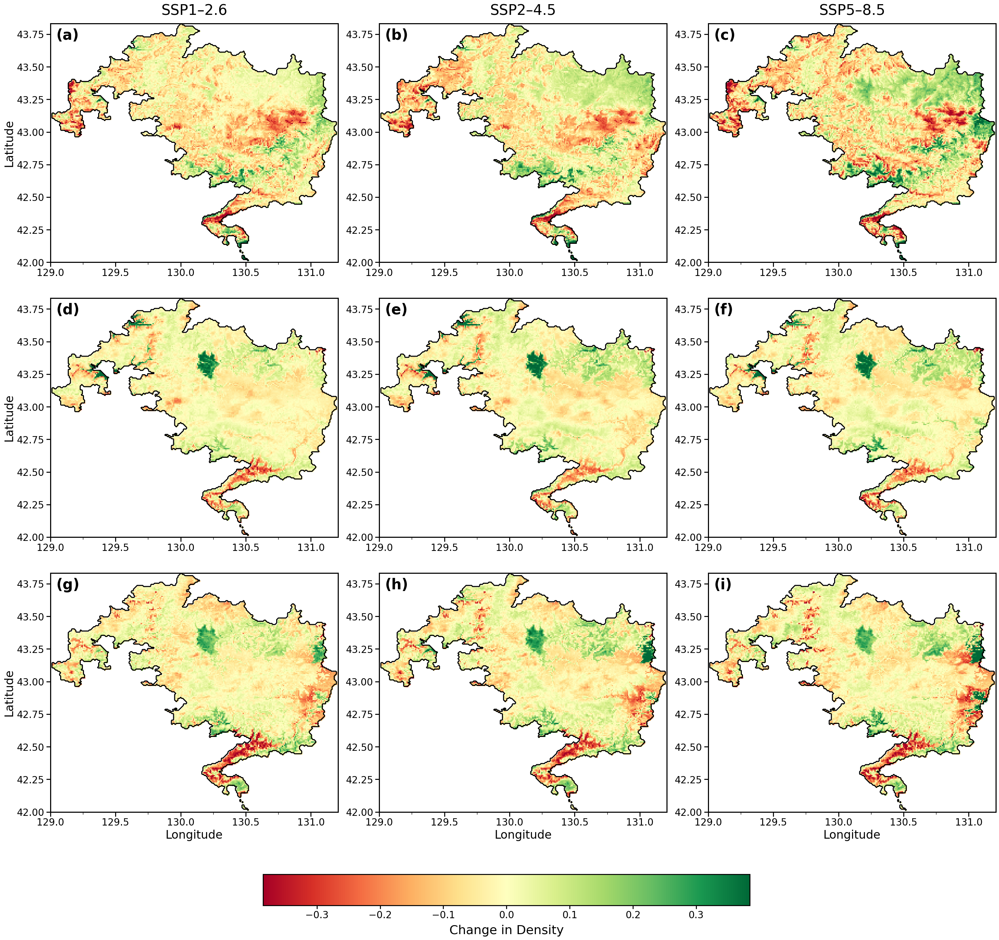

图像已保存至: /content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/Figure9


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import rasterio
from skimage import measure
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

# ==========================================================
# 1. 全局字体
# ==========================================================
plt.rcParams.update({
    'font.size': 20
})

period = "2081-2100"
scenarios = ["126", "245", "585"]
sc_titles = {"126": "SSP1–2.6", "245": "SSP2–4.5", "585": "SSP5–8.5"}
species_list = ["mhl", "yz", "dbp"]

future_path_tpl = "/content/drive/MyDrive/虎豹分布_ML/animal/density/asc/{sp}-{sc}-{period}-mean.asc"
history_path_tpl = "/content/drive/MyDrive/虎豹分布_ML/animal/history/{sp}_density.asc"

# ==========================================================
# 2. 画布
# ==========================================================
fig = plt.figure(figsize=(32, 30), facecolor='white')

gs = gridspec.GridSpec(
    3, 3,
    figure=fig,
    wspace=0.08,
    hspace=0.15,
    bottom=0.16,
    top=0.92,
    left=0.08,
    right=0.95
)

# ==========================================================
# 3. 绘图
# ==========================================================
im_diff = None

for row, sp in enumerate(species_list):

    hist_fpath = history_path_tpl.format(sp=sp)
    with rasterio.open(hist_fpath) as src_h:
        raster_hist = src_h.read(1)
        raster_hist = np.where(raster_hist < 0, np.nan, raster_hist)

        xmin = src_h.bounds.left
        xmax = src_h.bounds.right
        ymin = src_h.bounds.bottom
        ymax = src_h.bounds.top

    diff_maps = []
    for sc in scenarios:
        fut_fpath = future_path_tpl.format(sp=sp, sc=sc, period=period)
        if os.path.exists(fut_fpath):
            with rasterio.open(fut_fpath) as src_f:
                rf = src_f.read(1)
                rf = np.where(rf < 0, np.nan, rf)
                diff_maps.append(rf - raster_hist)
        else:
            diff_maps.append(np.full_like(raster_hist, np.nan))

    valid_data = [d[~np.isnan(d)] for d in diff_maps if not np.all(np.isnan(d))]
    v_limit = np.percentile(np.abs(np.concatenate(valid_data)), 99) if valid_data else 0.3

    for col, sc in enumerate(scenarios):
        ax = fig.add_subplot(gs[row, col])
        raster_diff = diff_maps[col]

        im_diff = ax.imshow(
            raster_diff,
            extent=[xmin, xmax, ymin, ymax],
            origin="upper",
            cmap="RdYlGn",
            vmin=-v_limit,
            vmax=v_limit
        )

        # ======================================================
        # 自动边界提取
        # ======================================================
        mask = ~np.isnan(raster_diff)

        if np.any(mask):
            contours = measure.find_contours(mask.astype(float), 0.5)

            for contour in contours:
                xs = xmin + contour[:, 1] / raster_diff.shape[1] * (xmax - xmin)
                ys = ymax - contour[:, 0] / raster_diff.shape[0] * (ymax - ymin)

                ax.plot(xs, ys, color='black', linewidth=2.2, zorder=10)

        ax.set_facecolor("white")

        for spine in ax.spines.values():
            spine.set_linewidth(2.2)

        ax.tick_params(
            direction='out',
            width=2,
            length=9,
            labelsize=20
        )

        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_aspect('equal')

        # ======================================================
        # ✅ x轴：0.5显示标签，0.25刻度线
        # ======================================================
        ax.xaxis.set_major_locator(MultipleLocator(0.5))
        ax.xaxis.set_minor_locator(MultipleLocator(0.25))
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

        ax.tick_params(axis='x', which='major', length=9, width=2)
        ax.tick_params(axis='x', which='minor', length=5, width=1)

        # （可选）y轴一致
        # ax.yaxis.set_major_locator(MultipleLocator(0.5))
        # ax.yaxis.set_minor_locator(MultipleLocator(0.25))
        # ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

        if row == 2:
            ax.set_xlabel("Longitude", fontsize=24)
        if col == 0:
            ax.set_ylabel("Latitude", fontsize=24)

        if row == 0:
            ax.set_title(sc_titles[sc], fontsize=30, pad=18)

        label_idx = row * 3 + col
        ax.text(
            0.02, 0.98,
            f"({chr(97+label_idx)})",
            transform=ax.transAxes,
            fontsize=30,
            fontweight="bold",
            va='top',
            ha='left',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
        )

# ==========================================================
# 4. Colorbar
# ==========================================================
cbar_ax = fig.add_axes([0.28, 0.07, 0.44, 0.03])

if im_diff is not None:
    cbar = fig.colorbar(im_diff, cax=cbar_ax, orientation="horizontal")
    cbar.set_label("Change in Density", fontsize=26, labelpad=10)
    cbar.ax.tick_params(labelsize=20, width=2, length=7)
    cbar.outline.set_linewidth(2)

# ==========================================================
# 5. 保存
# ==========================================================
save_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/"
os.makedirs(save_dir, exist_ok=True)
save_file = os.path.join(save_dir, "Figure9")

plt.savefig(save_file, dpi=300, format='jpg', bbox_inches='tight')
plt.show()

print(f"图像已保存至: {save_file}")


## 补充实验：多因素方差分析

In [ ]:
# ============= 东北豹未来120种情景预测 + 时空三因素方差分解 =============
import os
import pandas as pd
import numpy as np

# ==== 1. 路径设置 ====
input_dir = "/content/drive/MyDrive/虎豹分布_ML/animal/envir_with_density/dbb/"
output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/dbb/"
os.makedirs(output_dir, exist_ok=True)

# 训练好的模型
model_trained = model_pipeline_dbb

# 三大维度列表
GCMs = ["ACCESS-CM2", "CMCC-ESM2", "EC-Earth3-Veg", "GISS-E2-1-G", "INM-CM5-0",
        "IPSL-CM6A-LR", "MIROC6", "MPI-ESM1-2-HR", "MRI-ESM2-0", "UKESM1-0-LL"]
SSPs = ["126", "245", "585"]
Times = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]

# 专门用于存储方差分析的概率张量字典
all_probs = {}
base_geo = None
global_mask = None

print(">>> 开始进行 120 种情景的预测与概率提取...\n")

# ==== 2. 主循环：严格沿用你的数据读取和预测逻辑 ====
for gcm in GCMs:
    for ssp in SSPs:
        for time in Times:
            fname = f"dbb_{ssp}_{time}_{gcm}.csv"
            file_path = os.path.join(input_dir, fname)

            if not os.path.exists(file_path):
                print(f"缺失文件跳过：{fname}")
                continue

            print(f"正在处理：{fname}")
            df = pd.read_csv(file_path)

            # ---- 提取地理列 (ID, long, lat) ----
            geo_info = df.iloc[:, 0:3]

            # ---- 只保留训练时的变量列 (完全参照你的代码逻辑) ----
            X_future = df[X_leopard.columns]

            # ---- 剔除含 -9999 的行 ----
            # 为了保证120个图层的像元绝对对齐以进行矩阵运算，我们以第一个读取的有效图层mask为基准
            if global_mask is None:
                mask = (X_future != -9999).all(axis=1)
                global_mask = mask
                base_geo = geo_info[mask].copy()
            else:
                mask = global_mask

            X_clean = X_future[mask]
            geo_clean = geo_info[mask]

            # (1) 预测分类
            pred = model_trained.predict(X_clean)

            # (2) 预测概率
            proba = model_trained.predict_proba(X_clean)[:, 1]

            # ---- 存储概率用于后续方差分解 ----
            all_probs[f"{gcm}_{ssp}_{time}"] = proba

            # 保存单次预测结果
            result = pd.DataFrame({
                "ID": geo_clean.iloc[:, 0],
                "long": geo_clean.iloc[:, 1],
                "lat": geo_clean.iloc[:, 2],
                "prediction": pred,
                "probability": proba
            })

            save_path = os.path.join(output_dir, fname.replace(".csv", "_prediction.csv"))
            result.to_csv(save_path, index=False)

print(f"\n>>> 所有预测及单文件保存完成！有效像元数量: {len(base_geo)}。准备进行方差分解...")

# ==== 3. 数据张量化与三因素方差分解 (Three-way ANOVA) ====
# 3.0 初始化 4D 矩阵: Shape -> (像元数, 10, 3, 4)
N_pixels = len(base_geo)
N_GCM, N_SSP, N_Time = len(GCMs), len(SSPs), len(Times)
prob_array = np.zeros((N_pixels, N_GCM, N_SSP, N_Time))

# 按照维度的严谨顺序将一维数据填充进 4D 张量中
for i, gcm in enumerate(GCMs):
    for j, ssp in enumerate(SSPs):
        for k, time in enumerate(Times):
            key = f"{gcm}_{ssp}_{time}"
            if key in all_probs:
                prob_array[:, i, j, k] = all_probs[key]

# 3.1 矩阵化计算各维度均值 (keepdims=True 保持形状方便矩阵减法)
mean_total = prob_array.mean(axis=(1, 2, 3), keepdims=True)

mean_GCM = prob_array.mean(axis=(2, 3), keepdims=True)
mean_SSP = prob_array.mean(axis=(1, 3), keepdims=True)
mean_Time = prob_array.mean(axis=(1, 2), keepdims=True)

mean_GCM_SSP = prob_array.mean(axis=3, keepdims=True)
mean_GCM_Time = prob_array.mean(axis=2, keepdims=True)
mean_SSP_Time = prob_array.mean(axis=1, keepdims=True)

# 3.2 计算平方和 (Sum of Squares)
SST = np.sum((prob_array - mean_total)**2, axis=(1, 2, 3))

SS_GCM = N_SSP * N_Time * np.sum((mean_GCM - mean_total)**2, axis=(1, 2, 3))
SS_SSP = N_GCM * N_Time * np.sum((mean_SSP - mean_total)**2, axis=(1, 2, 3))
SS_Time = N_GCM * N_SSP * np.sum((mean_Time - mean_total)**2, axis=(1, 2, 3))

SS_GCM_SSP = N_Time * np.sum((mean_GCM_SSP - mean_GCM - mean_SSP + mean_total)**2, axis=(1, 2, 3))
SS_GCM_Time = N_SSP * np.sum((mean_GCM_Time - mean_GCM - mean_Time + mean_total)**2, axis=(1, 2, 3))
SS_SSP_Time = N_GCM * np.sum((mean_SSP_Time - mean_SSP - mean_Time + mean_total)**2, axis=(1, 2, 3))

# 残差平方和
SS_res = SST - (SS_GCM + SS_SSP + SS_Time + SS_GCM_SSP + SS_GCM_Time + SS_SSP_Time)

# ==== 4. 计算方差占比并处理 SST=0 的极端异常 ====
SST_safe = np.where(SST == 0, 1e-10, SST)

base_geo["V_GCM"] = SS_GCM / SST_safe
base_geo["V_SSP"] = SS_SSP / SST_safe
base_geo["V_Time"] = SS_Time / SST_safe
base_geo["V_GCM_SSP"] = SS_GCM_SSP / SST_safe
base_geo["V_GCM_Time"] = SS_GCM_Time / SST_safe
base_geo["V_SSP_Time"] = SS_SSP_Time / SST_safe
base_geo["V_Residual"] = SS_res / SST_safe

# 对于该点完全没有任何变化的地方（如水体等），方差占比强制置 0
zero_mask = (SST == 0)
columns_to_zero = ["V_GCM", "V_SSP", "V_Time", "V_GCM_SSP", "V_GCM_Time", "V_SSP_Time", "V_Residual"]
base_geo.loc[zero_mask, columns_to_zero] = 0.0

# ==== 5. 结果落盘 ====
anova_save_path = os.path.join(output_dir, "dbb_variance_decomposition_results.csv")
base_geo.to_csv(anova_save_path, index=False)

print(f"\n>>> 运行成功！方差分解结果已保存至：\n{anova_save_path}")

In [ ]:
import os
import pandas as pd
import numpy as np

# =====================================================
# ==== 基本设置 ====
# =====================================================
GCMs = ["ACCESS-CM2", "CMCC-ESM2", "EC-Earth3-Veg", "GISS-E2-1-G", "INM-CM5-0",
        "IPSL-CM6A-LR", "MIROC6", "MPI-ESM1-2-HR", "MRI-ESM2-0", "UKESM1-0-LL"]

SSPs = ["126", "245", "585"]

Times = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]

output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/tiger/"

all_probs = {}
base_geo = None

# =====================================================
# ==== 读取 prediction 文件 ====
# =====================================================
for gcm in GCMs:
    for ssp in SSPs:
        for time in Times:

            fname = f"tiger_{ssp}_{time}_{gcm}_prediction.csv"
            file_path = os.path.join(output_dir, fname)

            if not os.path.exists(file_path):
                print(f"缺失文件：{fname}")
                continue

            df = pd.read_csv(file_path)

            proba = df["probability"].values
            key = f"{gcm}_{ssp}_{time}"
            all_probs[key] = proba

            if base_geo is None:
                base_geo = df[["ID", "long", "lat"]].copy()

print(">>> 数据读取完成")

# =====================================================
# ==== 每个时间单独做 ANOVA ====
# =====================================================

N_pixels = len(base_geo)
N_GCM, N_SSP = len(GCMs), len(SSPs)

for time in Times:

    print(f"\n>>> 正在处理时间段：{time}")

    # ---- 构造二维数组 (pixel, GCM, SSP) ----
    prob_array = np.zeros((N_pixels, N_GCM, N_SSP))

    for i, gcm in enumerate(GCMs):
        for j, ssp in enumerate(SSPs):
            key = f"{gcm}_{ssp}_{time}"
            if key in all_probs:
                prob_array[:, i, j] = all_probs[key]

    # =====================================================
    # ==== 均值 ====
    # =====================================================
    mean_total = prob_array.mean(axis=(1,2), keepdims=True)

    mean_GCM = prob_array.mean(axis=2, keepdims=True)
    mean_SSP = prob_array.mean(axis=1, keepdims=True)

    mean_GCM_SSP = prob_array

    # =====================================================
    # ==== 方差分解 ====
    # =====================================================
    SST = np.sum((prob_array - mean_total)**2, axis=(1,2))

    SS_GCM = N_SSP * np.sum((mean_GCM - mean_total)**2, axis=(1,2))
    SS_SSP = N_GCM * np.sum((mean_SSP - mean_total)**2, axis=(1,2))

    SS_GCM_SSP = np.sum(
        (mean_GCM_SSP - mean_GCM - mean_SSP + mean_total)**2,
        axis=(1,2)
    )

    SS_res = SST - (SS_GCM + SS_SSP + SS_GCM_SSP)

    # =====================================================
    # ==== 占比 ====
    # =====================================================
    SST_safe = np.where(SST == 0, 1e-10, SST)

    result = base_geo.copy()
    result["V_GCM"] = SS_GCM / SST_safe
    result["V_SSP"] = SS_SSP / SST_safe
    result["V_GCM_SSP"] = SS_GCM_SSP / SST_safe
    result["V_Residual"] = SS_res / SST_safe

    # ---- 处理0方差 ----
    zero_mask = (SST == 0)
    cols = ["V_GCM","V_SSP","V_GCM_SSP","V_Residual"]
    result.loc[zero_mask, cols] = 0

    # =====================================================
    # ==== 保存 ====
    # =====================================================
    save_path = os.path.join(
        output_dir,
        f"tiger_variance_decomposition_{time}.csv"
    )
    result.to_csv(save_path, index=False)

    print(f"完成：{save_path}")

print("\n>>> 全部时间段方差分解完成！")


>>> 数据读取完成

>>> 正在处理时间段：2021-2040
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/tiger/tiger_variance_decomposition_2021-2040.csv

>>> 正在处理时间段：2041-2060
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/tiger/tiger_variance_decomposition_2041-2060.csv

>>> 正在处理时间段：2061-2080
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/tiger/tiger_variance_decomposition_2061-2080.csv

>>> 正在处理时间段：2081-2100
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/tiger/tiger_variance_decomposition_2081-2100.csv

>>> 全部时间段方差分解完成！


In [ ]:
import os
import pandas as pd
import numpy as np

# =====================================================
# ==== 基本设置 ====
# =====================================================
GCMs = ["ACCESS-CM2", "CMCC-ESM2", "EC-Earth3-Veg", "GISS-E2-1-G", "INM-CM5-0",
        "IPSL-CM6A-LR", "MIROC6", "MPI-ESM1-2-HR", "MRI-ESM2-0", "UKESM1-0-LL"]

SSPs = ["126", "245", "585"]

Times = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]

output_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/dbb/"

all_probs = {}
base_geo = None

# =====================================================
# ==== 读取 prediction 文件 ====
# =====================================================
for gcm in GCMs:
    for ssp in SSPs:
        for time in Times:

            fname = f"dbb_{ssp}_{time}_{gcm}_prediction.csv"
            file_path = os.path.join(output_dir, fname)

            if not os.path.exists(file_path):
                print(f"缺失文件：{fname}")
                continue

            df = pd.read_csv(file_path)

            proba = df["probability"].values
            key = f"{gcm}_{ssp}_{time}"
            all_probs[key] = proba

            if base_geo is None:
                base_geo = df[["ID", "long", "lat"]].copy()

print(">>> 数据读取完成")

# =====================================================
# ==== 每个时间单独做 ANOVA ====
# =====================================================

N_pixels = len(base_geo)
N_GCM, N_SSP = len(GCMs), len(SSPs)

for time in Times:

    print(f"\n>>> 正在处理时间段：{time}")

    # ---- 构造二维数组 (pixel, GCM, SSP) ----
    prob_array = np.zeros((N_pixels, N_GCM, N_SSP))

    for i, gcm in enumerate(GCMs):
        for j, ssp in enumerate(SSPs):
            key = f"{gcm}_{ssp}_{time}"
            if key in all_probs:
                prob_array[:, i, j] = all_probs[key]

    # =====================================================
    # ==== 均值 ====
    # =====================================================
    mean_total = prob_array.mean(axis=(1,2), keepdims=True)

    mean_GCM = prob_array.mean(axis=2, keepdims=True)
    mean_SSP = prob_array.mean(axis=1, keepdims=True)

    mean_GCM_SSP = prob_array

    # =====================================================
    # ==== 方差分解 ====
    # =====================================================
    SST = np.sum((prob_array - mean_total)**2, axis=(1,2))

    SS_GCM = N_SSP * np.sum((mean_GCM - mean_total)**2, axis=(1,2))
    SS_SSP = N_GCM * np.sum((mean_SSP - mean_total)**2, axis=(1,2))

    SS_GCM_SSP = np.sum(
        (mean_GCM_SSP - mean_GCM - mean_SSP + mean_total)**2,
        axis=(1,2)
    )

    SS_res = SST - (SS_GCM + SS_SSP + SS_GCM_SSP)

    # =====================================================
    # ==== 占比 ====
    # =====================================================
    SST_safe = np.where(SST == 0, 1e-10, SST)

    result = base_geo.copy()
    result["V_GCM"] = SS_GCM / SST_safe
    result["V_SSP"] = SS_SSP / SST_safe
    result["V_GCM_SSP"] = SS_GCM_SSP / SST_safe
    result["V_Residual"] = SS_res / SST_safe

    # ---- 处理0方差 ----
    zero_mask = (SST == 0)
    cols = ["V_GCM","V_SSP","V_GCM_SSP","V_Residual"]
    result.loc[zero_mask, cols] = 0

    # =====================================================
    # ==== 保存 ====
    # =====================================================
    save_path = os.path.join(
        output_dir,
        f"tiger_variance_decomposition_{time}.csv"
    )
    result.to_csv(save_path, index=False)

    print(f"完成：{save_path}")

print("\n>>> 全部时间段方差分解完成！")


>>> 数据读取完成

>>> 正在处理时间段：2021-2040
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/dbb/tiger_variance_decomposition_2021-2040.csv

>>> 正在处理时间段：2041-2060
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/dbb/tiger_variance_decomposition_2041-2060.csv

>>> 正在处理时间段：2061-2080
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/dbb/tiger_variance_decomposition_2061-2080.csv

>>> 正在处理时间段：2081-2100
完成：/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/dbb/tiger_variance_decomposition_2081-2100.csv

>>> 全部时间段方差分解完成！


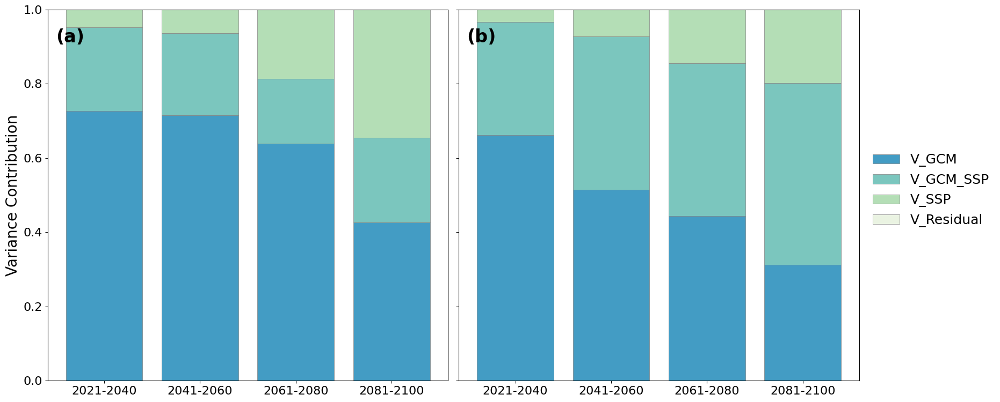

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# =====================================================
# ==== 基础配置 ====
# =====================================================
times = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]
species_list = ["tiger", "dbb"]
plot_order = ["V_GCM", "V_GCM_SSP", "V_SSP", "V_Residual"]
colors = {
    "V_GCM": "#439cc4",
    "V_GCM_SSP": "#7bc6be",
    "V_SSP": "#b4deb6",
    "V_Residual": "#eaf3e2"
}

# =====================================================
# ==== 创建 1x2 子图布局 ====
# =====================================================
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)
plt.subplots_adjust(wspace=0.25) # 调整子图间距

for idx, species in enumerate(species_list):
    ax = axes[idx]
    base_path = f"/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/{species}/"

    # 1. 读取数据
    summary = []
    for t in times:
        file_path = os.path.join(base_path, f"{species}_variance_decomposition_{t}.csv")
        if not os.path.exists(file_path): continue
        df = pd.read_csv(file_path)
        mean_vals = df[plot_order].mean()
        summary.append({"Time": t, **mean_vals.to_dict()})

    summary_df = pd.DataFrame(summary).set_index("Time")

    # 2. 绘制堆叠柱状图
    bottom = np.zeros(len(times))
    for comp in plot_order:
        values = summary_df[comp].values
        ax.bar(times, values, bottom=bottom, label=comp,
               color=colors[comp], edgecolor='gray', linewidth=0.5)
        bottom += values

    # 3. 格式调整
    ax.set_xticks(range(len(times)))
    ax.set_xticklabels(times, fontsize=16)
    ax.tick_params(axis='y', labelsize=16)

    # 【修改重点 1】：标注 (a) 和 (b) 移入框内
    # (0.02, 0.95) 代表子图内部左上角，ha='left' 确保文字向右延展
    label = "(a)" if idx == 0 else "(b)"
    ax.text(0.02, 0.95, label, transform=ax.transAxes,
            fontsize=24, fontweight='bold', va='top', ha='left')

    if idx == 0:
        ax.set_ylabel("Variance Contribution", fontsize=20)

# =====================================================
# ==== 统一图例与整体调整 ====
# =====================================================
handles, labels = axes[1].get_legend_handles_labels()

# 【修改重点 2】：通过 bbox_to_anchor 的第一个参数调整图例距离
# 将 0.97 调小（例如 0.91 或 0.88）会使图例更贴近子图
fig.legend(handles, labels, bbox_to_anchor=(0.90, 0.5), loc='center left',
           fontsize=18, borderaxespad=0., frameon=False)

# 调整整体布局，rect 后的 0.9 留出空间给图例
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

In [ ]:
import pandas as pd
import os

def build_variance_table(base_path, prefix, times):

    results = []

    for t in times:
        file_path = os.path.join(
            base_path,
            f"{prefix}_variance_decomposition_{t}.csv"
        )

        df = pd.read_csv(file_path)

        # ==== 空间平均（关键一步）====
        row = {
            "Time": t,
            "V_GCM": df["V_GCM"].mean(),
            "V_SSP": df["V_SSP"].mean(),
            "V_GCM_SSP": df["V_GCM_SSP"].mean(),
            "V_Residual": df["V_Residual"].mean()
        }

        results.append(row)

    table = pd.DataFrame(results)
    table = table.set_index("Time")

    return table

times = [
    "2021-2040",
    "2041-2060",
    "2061-2080",
    "2081-2100"
]

base_dir = "/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/"

tiger_table = build_variance_table(
    base_path=os.path.join(base_dir, "tiger"),
    prefix="tiger",
    times=times
)

print("Tiger variance table:")
print(tiger_table)

leopard_table = build_variance_table(
    base_path=os.path.join(base_dir, "dbb"),
    prefix="dbb",
    times=times
)

print("Leopard variance table:")
print(leopard_table)


Tiger variance table:
              V_GCM     V_SSP  V_GCM_SSP    V_Residual
Time                                                  
2021-2040  0.727567  0.047544   0.224890  7.994909e-19
2041-2060  0.715252  0.063160   0.221588  2.033380e-18
2061-2080  0.638767  0.185998   0.175234 -1.441338e-19
2081-2100  0.427248  0.345154   0.227597 -2.855777e-18
Leopard variance table:
              V_GCM     V_SSP  V_GCM_SSP    V_Residual
Time                                                  
2021-2040  0.661315  0.032739   0.305945  2.199913e-17
2041-2060  0.514882  0.071635   0.413483  1.853732e-17
2061-2080  0.443379  0.144226   0.412395 -3.383182e-18
2081-2100  0.312053  0.197514   0.490433 -1.080502e-18


/tmp/ipykernel_2491/2771864497.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(times, fontsize=18) # X轴标签略大
/tmp/ipykernel_2491/2771864497.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(times, fontsize=18) # X轴标签略大


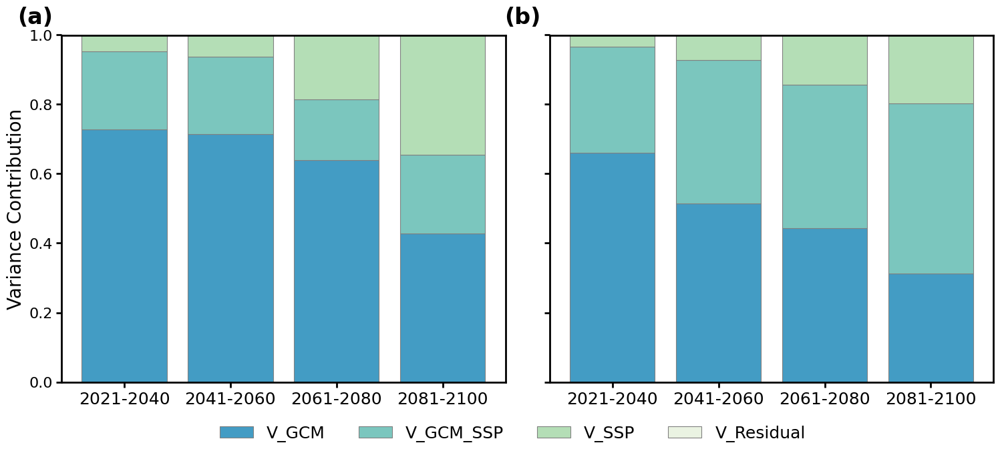

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# =====================================================
# ==== 1. 基础配置与全局字体设置 ====
# =====================================================
# 设置全局字体大小，确保最小为 16 号
plt.rcParams.update({'font.size': 16})

times = ["2021-2040", "2041-2060", "2061-2080", "2081-2100"]
species_list = ["tiger", "dbb"]
plot_order = ["V_GCM", "V_GCM_SSP", "V_SSP", "V_Residual"]
colors = {
    "V_GCM": "#439cc4",
    "V_GCM_SSP": "#7bc6be",
    "V_SSP": "#b4deb6",
    "V_Residual": "#eaf3e2"
}

# =====================================================
# ==== 2. 创建 1x2 子图布局 ====
# =====================================================
# 增加 figsize 的高度以容纳底部的图例
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)
plt.subplots_adjust(wspace=0.1, bottom=0.2, top=0.85) # 预留底部空间给图例，顶部给序号

for idx, species in enumerate(species_list):
    ax = axes[idx]

    # --- 数据读取部分 (保留您的逻辑) ---
    base_path = f"/content/drive/MyDrive/虎豹分布_ML/results_test/未来情景预测_方差分析/{species}/"
    summary = []
    for t in times:
        file_path = os.path.join(base_path, f"{species}_variance_decomposition_{t}.csv")
        if not os.path.exists(file_path): continue
        df = pd.read_csv(file_path)
        mean_vals = df[plot_order].mean()
        summary.append({"Time": t, **mean_vals.to_dict()})
    summary_df = pd.DataFrame(summary).set_index("Time")


    # 3. 绘制堆叠柱状图
    bottom = np.zeros(len(times))
    for comp in plot_order:
        values = summary_df[comp].values
        ax.bar(times, values, bottom=bottom, label=comp,
               color=colors[comp], edgecolor='gray', linewidth=0.8)
        bottom += values

    # =====================================================
    # ==== 修改项 2：边框、刻度设置 (2pt, 向外) ====
    # =====================================================
    for spine in ax.spines.values():
        spine.set_linewidth(2)  # 边框粗细 2pt

    ax.tick_params(axis='both', direction='out', length=6, width=2, labelsize=16) # 向外刻度，2pt宽
    ax.set_xticklabels(times, fontsize=18) # X轴标签略大

    # =====================================================
    # ==== 修改项 3：(a)(b) 序号放在子图左上角外部 ====
    # =====================================================
    label = "(a)" if idx == 0 else "(b)"
    # x=-0.05 表示在 y 轴左侧，y=1.05 表示在 x 轴上方
    ax.text(-0.02, 1.02, label, transform=ax.transAxes,
            fontsize=24, fontweight='bold', va='bottom', ha='right')

    if idx == 0:
        ax.set_ylabel("Variance Contribution", fontsize=20)

# =====================================================
# ==== 修改项 4：图例横向摆放在底部中央 ====
# =====================================================
handles, labels = axes[0].get_legend_handles_labels()
# ncol=4 设置为横向排列，loc='lower center' 配合 bbox_to_anchor 居中
fig.legend(handles, labels, loc='lower center',
           bbox_to_anchor=(0.5, 0.06), ncol=4,
           fontsize=18, frameon=False)

# =====================================================
# ==== 修改项 6：图片输出设置 (300dpi, JPG) ====
# =====================================================
# 保存为 Figure7.jpg，设置 300 DPI
save_path = "/content/drive/MyDrive/虎豹分布_ML/results_test/绘图结果_规范版本/Figure7"
plt.savefig(save_path, dpi=300, format='jpg', bbox_inches='tight')

plt.show()